In [1]:
# Imports
import sys
sys.path.insert(1, '/users/wx21978/projects/pion-phys/pi0-analysis/analysis/')
import os
import numpy as np
# import tensorflow as tf
# from tensorflow import keras
import sklearn.ensemble as ensemble
import sklearn.impute as impute
import awkward as ak
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from python.analysis import EventSelection, Plots, vector, PairSelection, Master, PFOSelection, cross_section, CutOptimization
from python.analysis import SelectionEvaluation as seval
from apps.cex_analysis_input import BeamPionSelection
from python.gnn import bdt_classifier, Models
from apps import photon_pairs
import time

2024-08-07 15:04:13.882643: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
plt_conf = Plots.PlotConfig()
plt_conf.SHOW_PLOT = True
plt_conf.SAVE_FOLDER = None
# plt_conf.BINS = 30

In [3]:
def apply_selection(
        events, data_type, selection,
        conf_args=None,
        conf_file="/users/wx21978/projects/pion-phys/pi0-analysis/analysis/config/cex_analysis_3GeV_config_hm01.json",
        show_table=True):
    if show_table:
        init_tab_index = events.cutTable.concat_index
    if conf_args is None:
        conf_args = cross_section.ApplicationArguments.ResolveConfig(cross_section.LoadConfiguration(conf_file))
    args = vars(conf_args)
    if selection.lower() == "valid_pfo":
        if not args["valid_pfo_selection"]:
            return events
        pos_mask = PFOSelection.ValidRecoTrackPositionCut(events)
        events.Filter([pos_mask], [])
        mask = PFOSelection.GoodShowerSelection(events)
        events.Filter([mask], [])
    elif "selection_masks" in args:
        for m in args["selection_masks"][data_type][selection].values():
            events.Filter([m], [m])
    else:
        print("Saved masks not found, generating...")
        for s, a in zip(args[f"{selection}_selection"]["selections"].values(), args[f"{selection}_selection"][f"{data_type}_arguments"].values()):
            mask = s(events, **a)
            events.Filter([mask], [mask])
    if show_table:
        print(events.cutTable.get_table(initial_concat_index=init_tab_index))
    return events

In [3]:
beam_masks = Master.LoadObject("/users/wx21978/projects/pion-phys/analyses/3GeV_MC_only/masks_mc/beam_selection_masks.dill")
pfo_masks = Master.LoadObject("/users/wx21978/projects/pion-phys/analyses/3GeV_MC_only/masks_mc/null_pfo_selection_masks.dill")
conf_file = "/users/wx21978/projects/pion-phys/analyses/3GeV_MC_only/config_3GeV_MC_only.json"
conf_args = cross_section.ApplicationArguments.ResolveConfig(cross_section.LoadConfiguration(conf_file))
set_nums = [0]# [0,1,2]
for num in set_nums:
    graph_folder = f"/users/wx21978/projects/pion-phys/pi0-analysis/analysis/gnn-data/3GeVMC_Set0{num}_final_31-07-24/"
    root_file = f"/storage/wx21978/phys/mc_root/PDSPProd4a_MC_3GeV_Set0{num}_reco1_sce_datadriven_v1_ntuple_v09_44_00_02.root"
    these_evts = Master.Data(root_file, nTuple_type="PDSPAnalyser", target_momentum=3)
    # print(ak.num(these_evts.recoParticles.number, axis=0))
    # print(ak.count(these_evts.recoParticles.number))
    # beam_mask_dict = beam_masks[root_file]
    # for m in beam_mask_dict.items():
    #     these_evts.Filter([m[-1]], [m[-1]])
    # pfo_mask_dict = pfo_masks[root_file]
    # for m in pfo_mask_dict.items():
    #     these_evts.Filter([m[-1]], [])
    evts = BeamPionSelection(these_evts, conf_args, True)
    print(ak.num(evts.recoParticles.number, axis=0))
    print(ak.count(evts.recoParticles.number))

'BeamPionSelection' executed in 0.0319s

26190
121002


In [5]:
conf_file = "/users/wx21978/projects/pion-phys/pi0-analysis/analysis/config/cex_analysis_3GeV_config_mc1.json"
conf_args = cross_section.ApplicationArguments.ResolveConfig(cross_section.LoadConfiguration(conf_file))

evts = Master.Data(conf_args.mc_file, nTuple_type = conf_args.ntuple_type)
evts = apply_selection(evts, "mc", "beam", show_table=False)
evts = apply_selection(evts, "mc", "valid_pfo", show_table=False)

/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to filters.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to _RecoParticleData__number.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to _TrueParticleDataBT__pdg.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to filename.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to nTuple_type.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/p

In [8]:
from importlib import reload
reload(bdt_classifier)

<module 'python.gnn.bdt_classifier' from '/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/gnn/bdt_classifier.py'>

In [4]:
bdt_props = [
    "track", "length", "nhits",
    "dEdx_med", "dEdx_sum", "dEdx_var", "dEdx_start10%", "dEdx_end25%",
    "chi2_pion_reduced", "chi2_proton_reduced", "chi2_muon_reduced"]
bdt_truths = ["pion", "photon", "proton"]

bdt_holder = bdt_classifier.BDTPropertyGenerator(bdt_props, bdt_truths)

In [5]:
bdt_holder.train(evts)

In [6]:
bdt_holder.save("/users/wx21978/projects/pion-phys/analyses/3GeV_MC_only/gnn_data/bdt_pfo.dll")
bdt_holder.save("/users/wx21978/projects/pion-phys/pi0-analysis/analysis/gnn-data/bdt_pfo.dll")

'/users/wx21978/projects/pion-phys/pi0-analysis/analysis/gnn-data/bdt_pfo.dll'

In [58]:
loaded_bdt = bdt_classifier.loadBDT("/users/wx21978/projects/pion-phys/pi0-analysis/analysis/gnn-data/bdt_pfo.dll")

In [59]:
predicted_pfos = loaded_bdt.predict(evts)

In [64]:
predicted_pfos

array([0, 3, 3, ..., 1, 2, 1])

In [66]:
truth_pfos = loaded_bdt.gen_truths(evts)
truth_pfos = np.sum(truth_pfos * np.array([[1,2,3]]), axis=1) - 1
truth_pfos[truth_pfos == -1] = 3

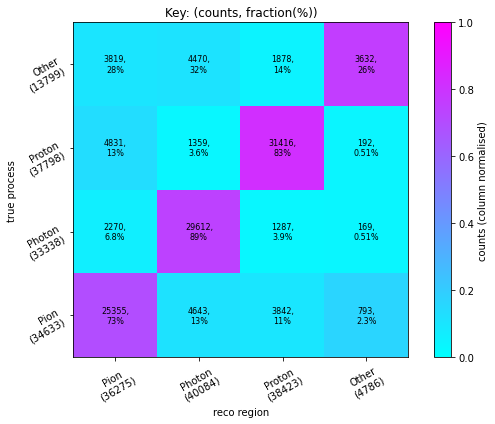

In [67]:
matrix = Models.create_confusion_matrix(predicted_pfos, truth_pfos)
Models.plot_confusion_matrix(matrix, true_labels=["Pion", "Photon", "Proton", "Other"], reco_labels=["Pion", "Photon", "Proton", "Other"])

In [6]:
from apps.cex_toy_parameters import GetRegions, PlotCorrelationMatrix
def get_counts_from_regions(true_regions, reco_regions):
    counts = []
    for t in true_regions:
        true_counts = []
        for r in reco_regions:
            true_counts.append(ak.sum(true_regions[t] & reco_regions[r])) # true counts for each reco region
        counts.append(true_counts)
    return counts

In [7]:
evts_raw = Master.Data(conf_args.mc_file, nTuple_type = conf_args.ntuple_type)

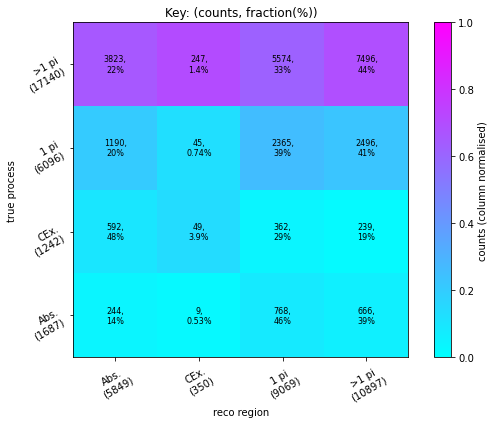

In [17]:
true, reco = GetRegions(evts_raw, conf_args)
mat = get_counts_from_regions(true, reco)
PlotCorrelationMatrix(mat, true_labels=["Abs.", "CEx.", "1 pi", ">1 pi"], reco_labels=["Abs.", "CEx.", "1 pi", ">1 pi"])

In [5]:
evts_data = Master.Data(conf_args.data_file, nTuple_type = conf_args.ntuple_type)
evts_data = apply_selection(evts_data, "data", "beam")
evts_data = apply_selection(evts_data, "data", "valid_pfo")

/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to filters.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to filename.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to nTuple_type.
  warnings.warn(f"Couldn't apply filters to {var}.")


            Name  Remaining events  Percentage of total events remaining  \
0   Initial data            256372                            100.000000   
1              -             61129                             23.843868   
2              -             52421                             20.447241   
3              -             47936                             18.697830   
4              -             36923                             14.402119   
5              -             35364                             13.794018   
6              -             33179                             12.941741   
7              -             24844                              9.690606   
8              -             24763                              9.659011   
9              -             23655                              9.226827   
10             -             18402                              7.177851   

    Relative percentage events  Remaining PFOs  \
0                   100.000000       

/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to filters.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to _TrueParticleDataBT__pdg.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to filename.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to nTuple_type.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to run.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/

            Name  Remaining events  Percentage of total events remaining  \
0   Initial data            256372                            100.000000   
1              -             61129                             23.843868   
2              -             52421                             20.447241   
3              -             47936                             18.697830   
4              -             36923                             14.402119   
5              -             35364                             13.794018   
6              -             33179                             12.941741   
7              -             24844                              9.690606   
8              -             24763                              9.659011   
9              -             23655                              9.226827   
10             -             18402                              7.177851   
11             -             18402                              7.177851   
12          

In [9]:
dQdxs = evts.recoParticles.track_dQdX
res_ranges = evts.recoParticles.residual_range
chi2_proton = evts.recoParticles.track_chi2_proton
chi2_proton_dof = evts.recoParticles.track_chi2_proton_ndof
chi2_pion = evts.recoParticles.track_chi2_pion
chi2_pion_dof = evts.recoParticles.track_chi2_pion_ndof
chi2_muon = evts.recoParticles.track_chi2_muon
chi2_muon_dof = evts.recoParticles.track_chi2_muon_ndof
lens = evts.recoParticles.track_len
lens_alt = evts.recoParticles.track_len_alt
verts_michel = evts.recoParticles.track_vertex_michel
verts_nhits = evts.recoParticles.track_vertex_nhits
dEdxs = evts.recoParticles.track_dEdX

In [100]:
def remove_unknown(prop):
    return prop[prop != -999.]

def make_good(prop1, prop2, lim1=10000, lim2=60):
    propsgood = np.logical_and(prop1 != -999., prop2 != -1)
    lim_good = np.logical_and(prop1 <= lim1, prop2 <= lim2)
    mask = np.logical_and(propsgood, lim_good)
    return prop1[mask], prop2[mask]

def plot_chi2s(mask):
    proton = ak.ravel(chi2_proton[mask])
    proton_dof = ak.ravel(chi2_proton_dof[mask])
    proton_good = proton_dof != -999.
    pion = ak.ravel(chi2_pion[mask])
    pion_dof = ak.ravel(chi2_pion_dof[mask])
    pion_good = pion_dof != -999.
    muon = ak.ravel(chi2_muon[mask])
    muon_dof = ak.ravel(chi2_muon_dof[mask])
    muon_good = muon_dof != -999.
    ver_michel = ak.ravel(verts_michel[mask])

    used_bins = plt_conf.get_bins(proton)
    plt_conf.setup_figure()
    plt.hist(proton, **plt_conf.gen_kwargs(type="hist", index=0, label="Proton fit", bins=used_bins))
    plt.hist(pion, **plt_conf.gen_kwargs(type="hist", index=1, label="Pion fit", bins=used_bins))
    plt.hist(muon, **plt_conf.gen_kwargs(type="hist", index=2, label="Muon fit", bins=used_bins))
    plt_conf.format_axis(xlabel="Chi2 fit", ylabel="Count")
    plt_conf.end_plot()

    plt_conf.setup_figure()
    # plt.hist2d(proton[proton_good], proton_dof[proton_good], bins=60)
    plt.hist2d(*make_good(proton, proton_dof), bins=60)
    plt_conf.format_axis(xlabel="Proton chi2", ylabel="Chi2 n.d.o.f.", xlim=(0, 10000))
    plt.colorbar()
    plt_conf.end_plot()

    plt_conf.setup_figure()
    # plt.hist2d(pion[pion_good], pion_dof[pion_good], bins=60)
    plt.hist2d(*make_good(pion, pion_dof), bins=60)
    plt_conf.format_axis(xlabel="Pion chi2", ylabel="Chi2 n.d.o.f.", xlim=(0, 10000))
    plt.colorbar()
    plt_conf.end_plot()

    plt_conf.setup_figure()
    # plt.hist2d(muon[muon_good], muon_dof[muon_good], bins=60)
    plt.hist2d(*make_good(muon, muon_dof), bins=60)
    plt_conf.format_axis(xlabel="Muon chi2", ylabel="Chi2 n.d.o.f.", xlim=(0, 10000))
    plt.colorbar()
    plt_conf.end_plot()

    plt_conf.setup_figure()
    plt.hist(remove_unknown(ver_michel), **plt_conf.gen_kwargs(type="hist", index=0, bins=plt_conf.get_bins(ver_michel)))
    plt_conf.format_axis(xlabel="Vertex micehl score", ylabel="Count")
    plt_conf.end_plot()
    return


def plot_props(mask):
    maxdEdx = 6
    maxres = 300
    flat_res = ak.ravel(res_ranges[mask])
    flat_dEdx = ak.ravel(dEdxs[mask])
    comb_mask = np.logical_and(flat_res < maxres, flat_dEdx < maxdEdx)
    plt_res = flat_res[comb_mask]
    plt_dEdx = flat_dEdx[comb_mask]
    plt_dQdx = ak.ravel(dQdxs[mask])[comb_mask]
    
    plt_conf.setup_figure()
    plt.hist2d(plt_res, plt_dEdx, bins=60)
    plt_conf.format_axis(xlabel="Residual range", ylabel="dEdX")
    plt.colorbar()
    plt_conf.end_plot()

    plt_conf.setup_figure()
    plt.hist2d(plt_res, plt_dQdx, bins=60)
    plt_conf.format_axis(xlabel="Residual range", ylabel="dQdX")
    plt.colorbar()
    plt_conf.end_plot()
    return

In [ ]:
# hist, x_bin, y_bin = np.histogram2d(ak.ravel(res_ranges[piplus_mask]), ak.ravel(dEdxs[piplus_mask]))

# hist_1d = hist.flatten()
# x_bin_1d = np.repeat(x_bin[:-1, np.newaxis], len(y_bin)-1, axis=1).flatten()
# y_bin_1d = np.repeat(y_bin[np.newaxis, :-1], len(x_bin)-1, axis=0).flatten()
piplus_mask = evts.trueParticlesBT.pdg == 211
# maxdEdx = 6
# maxres = 300
# flat_res = ak.ravel(res_ranges[piplus_mask])
# flat_dEdx = ak.ravel(dEdxs[piplus_mask])
# comb_mask = np.logical_and(flat_res < maxres, flat_dEdx < maxdEdx)
# plt_res = flat_res[comb_mask]
# plt_dEdx = flat_dEdx[comb_mask]
# plt_dQdx = ak.ravel(dQdxs[piplus_mask])

# plt_conf.setup_figure()
# # plt.hist2d(x_bin_1d, y_bin_1d, bins=[x_bin, y_bin], weights=hist_1d)
# plt.hist2d(plt_res, plt_dEdx, bins=60)
# plt_conf.format_axis(xlabel="Residual range", ylabel="dEdX")
# plt.colorbar()
# plt_conf.end_plot()
plot_props(piplus_mask)
plot_chi2s(piplus_mask)

In [ ]:
muon_mask = evts.trueParticlesBT.pdg == 13
plot_props(muon_mask)
plot_chi2s(muon_mask)

In [ ]:
proton_mask = evts.trueParticlesBT.pdg == 2212
plot_props(proton_mask)
plot_chi2s(proton_mask)

In [67]:
evts.io.ListNTuples()

[
    'run',
    'subrun',
    'event',
    'MC',
    'reco_reconstructable_beam_event',
    'reco_beam_type',
    'reco_beam_startX',
    'reco_beam_startY',
    'reco_beam_startZ',
    'reco_beam_endX',
    'reco_beam_endY',
    'reco_beam_endZ',
    'true_beam_len',
    'reco_beam_len',
    'test_branch',
    'reco_beam_alt_len',
    'for_truncation_method',
    'reco_beam_alt_len_allTrack',
    'reco_beam_calo_startX',
    'reco_beam_calo_startY',
    'reco_beam_calo_startZ',
    'reco_beam_calo_endX',
    'reco_beam_calo_endY',
    'reco_beam_calo_endZ',
    'reco_beam_calo_startX_allTrack',
    'reco_beam_calo_startY_allTrack',
    'reco_beam_calo_startZ_allTrack',
    'reco_beam_calo_endX_allTrack',
    'reco_beam_calo_endY_allTrack',
    'reco_beam_calo_endZ_allTrack',
    'reco_beam_calo_startDirX',
    'reco_beam_calo_startDirY',
    'reco_beam_calo_startDirZ',
    'reco_beam_calo_endDirX',
    'reco_beam_calo_endDirY',
    'reco_beam_calo_endDirZ',
    'reco_beam_trackDirX',
    'reco_beam_trackDirY',
    'reco_beam_trackDirZ',
    'reco_beam_trackEndDirX',
    'reco_beam_trackEndDirY',
    'reco_beam_trackEndDirZ',
    'reco_beam_vertex_nHits',
    'reco_beam_vertex_michel_score',
    'reco_beam_vertex_nHits_allTrack',
    'reco_beam_vertex_michel_score_allTrack',
    'reco_beam_vertex_michel_score_weight_by_charge',
    'reco_beam_vertex_michel_score_weight_by_charge_allTrack',
    'reco_beam_trackID',
    'n_beam_slices',
    'n_beam_particles',
    'beam_track_IDs',
    'beam_particle_scores',
    'reco_beam_dQdX_SCE',
    'reco_beam_EField_SCE',
    'reco_beam_calo_X',
    'reco_beam_calo_Y',
    'reco_beam_calo_Z',
    'reco_beam_calo_X_allTrack',
    'reco_beam_calo_Y_allTrack',
    'reco_beam_calo_Z_allTrack',
    'reco_beam_dQ',
    'reco_beam_dEdX_SCE',
    'reco_beam_calibrated_dEdX_SCE',
    'reco_beam_calibrated_dQdX_SCE',
    'reco_beam_resRange_SCE',
    'reco_beam_TrkPitch_SCE',
    'reco_beam_TrkPitch_SCE_allTrack',
    'reco_beam_dQdX_NoSCE',
    'reco_beam_dQ_NoSCE',
    'reco_beam_dEdX_NoSCE',
    'reco_beam_calibrated_dEdX_NoSCE',
    'reco_beam_resRange_NoSCE',
    'reco_beam_TrkPitch_NoSCE',
    'reco_beam_calo_wire',
    'reco_beam_calo_wire_allTrack',
    'reco_beam_calo_wire_z',
    'reco_beam_calo_wire_NoSCE',
    'reco_beam_calo_wire_z_NoSCE',
    'reco_beam_calo_tick',
    'reco_beam_calo_TPC',
    'reco_beam_calo_TPC_NoSCE',
    'reco_beam_flipped',
    'reco_beam_passes_beam_cuts',
    'reco_beam_PFP_ID',
    'reco_beam_PFP_nHits',
    'reco_beam_PFP_trackScore',
    'reco_beam_PFP_emScore',
    'reco_beam_PFP_michelScore',
    'reco_beam_PFP_trackScore_collection',
    'reco_beam_PFP_emScore_collection',
    'reco_beam_PFP_michelScore_collection',
    'reco_beam_PFP_trackScore_weight_by_charge',
    'reco_beam_PFP_emScore_weight_by_charge',
    'reco_beam_PFP_michelScore_weight_by_charge',
    'reco_beam_PFP_trackScore_collection_weight_by_charge',
    'reco_beam_PFP_emScore_collection_weight_by_charge',
    'reco_beam_PFP_michelScore_collection_weight_by_charge',
    'reco_beam_allTrack_ID',
    'reco_beam_allTrack_beam_cuts',
    'reco_beam_allTrack_flipped',
    'reco_beam_allTrack_len',
    'reco_beam_allTrack_startX',
    'reco_beam_allTrack_startY',
    'reco_beam_allTrack_startZ',
    'reco_beam_allTrack_endX',
    'reco_beam_allTrack_endY',
    'reco_beam_allTrack_endZ',
    'reco_beam_allTrack_trackDirX',
    'reco_beam_allTrack_trackDirY',
    'reco_beam_allTrack_trackDirZ',
    'reco_beam_allTrack_trackEndDirX',
    'reco_beam_allTrack_trackEndDirY',
    'reco_beam_allTrack_trackEndDirZ',
    'reco_beam_allTrack_resRange',
    'reco_beam_allTrack_calibrated_dEdX',
    'reco_beam_allTrack_Chi2_proton',
    'reco_beam_allTrack_Chi2_ndof',
    'reco_track_startX',
    'reco_track_startY',
    'reco_track_startZ',
    'reco_track_endX',
    'reco_track_endY',
    'reco_track_endZ',
    'reco_track_michel_score',
    'reco_track_michel_score_weight_by_charge',
    'reco_track_ID

In [3]:
"""Functions for generating metrics"""

def gen_cut(limit):
    if isinstance(limit, tuple):
        def cut(param):
            return np.logical_and(param > limit[0], param < limit[1])
    else:
        def cut(param):
            return np.abs(param) < limit
    return cut

def cut_metric_generator(mass_cuts=None, momentum_cuts=None, energy_cuts=None, approach_cuts=None, separation_cuts=None, impact_cuts=None, angle_cuts=None):
    cuts_dict = {}
    if mass_cuts is not None:
        cuts_dict.update({"mass":gen_cut(mass_cuts)})
    if momentum_cuts is not None:
        cuts_dict.update({"momentum":gen_cut(momentum_cuts)})
    if energy_cuts is not None:
        cuts_dict.update({"energy":gen_cut(energy_cuts)})
    if approach_cuts is not None:
        cuts_dict.update({"approach":gen_cut(approach_cuts)})
    if separation_cuts is not None:
        cuts_dict.update({"separation":gen_cut(separation_cuts)})
    if impact_cuts is not None:
        cuts_dict.update({"impact":gen_cut(impact_cuts)})
    if angle_cuts is not None:
        cuts_dict.update({"angle":gen_cut(angle_cuts)})


    def cuts_metric(**params_dict):
        passing_pairs = []
        for param in list(cuts_dict.keys()):
            if params_dict[param] is not None:
                passing_pairs += [ cuts_dict[param]( params_dict[param] ) ]
        
        # If no cuts specified, return 1s
        if len(passing_pairs) == 0:
            return ak.ones_like(params_dict["mass"])
        
        # Return 1s for values passing the cut(s), 0s for others
        elif len(passing_pairs) == 1:
            return ak.values_astype(passing_pairs[0], float)
        else:
            current_passing = passing_pairs[0]
            for i in range(1, len(passing_pairs)):
                current_passing = np.logical_and(current_passing, passing_pairs[i])
            return ak.values_astype(current_passing, float)            


    def cut_argument_handler(mass, momentum, energy, approach, separation, impact, angle):
        return cuts_metric(mass=mass, momentum=momentum, energy=energy, approach=approach, separation=separation, impact=impact, angle=angle)
    
    return cut_argument_handler

In [4]:
"""Functions for analysing results (mostly supplanted by classes)"""

def plot_rank_hist_nb(
        prop_name, ranking,
        path="/users/wx21978/projects/pion-phys/plots/photon_pairs/", unique_save_id = "",
        y_scaling = 'log', bins = None, **kwargs
    ):

    if path[-1] != '/':
        path += '/'

    if not isinstance(y_scaling, list):
        y_scaling = [y_scaling]
    if bins is None:
        # bins = int(np.max(ranking) - 1)
        bins = 2*int(np.max(ranking)) + 1

    for y_scale in y_scaling:
        plt.figure(figsize=(12,9))
        plt.hist(ak.max(ranking, axis=-1), label="signal", bins=bins,  **kwargs)
        plt.legend()
        plt.yscale(y_scale)
        plt.xlabel(prop_name.title() + " ranking")
        plt.ylabel("Count")
        plt.show()
        # plt.savefig(path + "ranking_" + prop_name.replace(" ", "_") + unique_save_id + ".png")
        # plt.close()
    
    return

def get_efficiency_fpr_stats(passing_pairs, sig_count, print_results=False):
    num_events = ak.num(passing_pairs, axis=0)

    false_0_counts = ak.sum( ak.values_astype(passing_pairs[ sig_count == 0 ], int) )
    false_1_counts = ak.sum( ak.values_astype(passing_pairs[ sig_count == 1 ], int) )

    true_sig_count_per_event = ak.sum( ak.values_astype(passing_pairs[ sig_count == 2 ], int), axis=1 )
    true_pi0_events_found = ak.sum( ak.values_astype(true_sig_count_per_event > 0, int) )
    excess_pi0_events_found = ak.sum( np.maximum(true_sig_count_per_event - 1, 0) )
    
    truth_pi0_event_count = ak.sum( ak.values_astype(ak.sum( ak.values_astype(sig_count == 2, int), axis=1 ) > 0, int) )

    if print_results:
        print(f"{num_events} searched with {truth_pi0_event_count} events containing pi0s.")
        print(f"{false_0_counts} false triggers on pairs with no pi0 photons and {false_1_counts} false triggers on pairs with 1 pi0 photon")
        print(f"for a total of {false_0_counts + false_1_counts} false triggers, at an average rate of {(false_0_counts + false_1_counts)/num_events:.2f} false triggers per event.")
        print(f"{true_pi0_events_found} events with true pi0 triggering found, for an efficiency of {100*true_pi0_events_found/truth_pi0_event_count:.2f}%.")
        print(f"{excess_pi0_events_found} excess truth events were found for and average of {excess_pi0_events_found/truth_pi0_event_count:.2f} excess events per truth pi0 trigger.")
    
    return true_pi0_events_found/truth_pi0_event_count, (false_0_counts+false_1_counts)/num_events

In [5]:
class SimpleCutSelector():
    def __init__(self, **cuts):
        self.known_properties = [key for key in cuts.keys()]
        
        self.applied_cuts = cuts

        self.cuts_dict = {}

        for i, cut in enumerate(cuts.values()):
            self._gen_cut(cut, self.known_properties[i])
        return

    def __call__(self, *args, **kwargs):
        if len(args) == 1 and isinstance(args[0], dict):
            return self.metric(*args)
        elif len(args) == len(self.known_properties):
            return self.explicit_args(*args)
        elif len(args) != 0:
            raise TypeError(f"{self.__name__}() takes 1 or {len(self.known_properties)} positional arguments")
        else:
            for prop in kwargs.keys():
                if prop not in self.known_properties:
                    raise TypeError(f"{self.__name__}() got an unexpected keyword argument '{prop}'")
            return self.explicit_args(**kwargs)

    def _gen_cut(self, limit, prop_name):
        if limit is None:
            return
        elif isinstance(limit, tuple):
            if len(limit) == 2:
                def cut(prop):
                    return np.logical_and(prop > limit[0], prop < limit[1])
            else:
                def cut(prop):
                    return prop > limit[0]
        else:
            def cut(prop):
                return np.abs(prop) < limit
        self.cuts_dict.update({prop_name:cut})
        return

    def explicit_args(self, **args):
        props_dict = {}
        for i, prop in enumerate(args.values()):
            props_dict.update({self.known_properties[i]:prop})
        return self.metric(props_dict)

    def metric(self, properties_dict):
        passing_pairs = []
        for prop in self.cuts_dict.keys():
            if properties_dict[prop] is not None:
                passing_pairs += [ self.cuts_dict[prop]( properties_dict[prop] ) ]

        # If no cuts specified, return 1s
        if len(passing_pairs) == 0:
            return ak.ones_like(properties_dict[self.known_properties[0]])
        
        # Return 1s for values passing the cut(s), 0s for others
        elif len(passing_pairs) == 1:
            return ak.values_astype(passing_pairs[0], float)
        else:
            current_passing = passing_pairs[0]
            for i in range(1, len(passing_pairs)):
                current_passing = np.logical_and(current_passing, passing_pairs[i])
            return ak.values_astype(current_passing, float) 


class SelectorEvaluator():
    """
    Class to store properties and cuts an generate
    plots indicating cut performance.

    ...
    
    Attributes
    ----------
    properties : dict {str: ak.Array}
        A dictionary containing the properties which
        may be cut on, with an label.
    prop_labels : list
        The list of keys of the `properties` dictionary.
    truth_mask : ak.Array
        A mask which is true for "signal" PFOs, and
        False for backgrounds
    pfo_name : str
        Name of the signal type PFOs to appear in text.
    metrics : dict {str: function}
        A dictionary containing cuts which to select
        signal PFOs.
    
    INCOMPLETE

    Methods
    -------
    get_metric_values
        Returns the values of PFOs under a specified metric.
    get_threshold
        Returns to cut threshold used by a specified metric.
    get_passing
        Returns an boolean mask of PFOs which exceed a
        threshold under a specified metric.
    
    
    """
    def __init__(self, truth, props_dict, pfo_name="signal"):
        """
        Creates a SelectorEvaluator instance.

        Parameters
        ----------
        truth : ak.Array
            Boolean array containing True for signal type PFOs
        props_dict : dict {str: ak.Array}
            Dictionary containing a property label, with an
            array holding the values of that property for each
            PFO.
        """
        self.properties = props_dict
        self.prop_labels = [key for key in self.properties.keys()]
        self.truth_mask = truth

        self.pfo_name = pfo_name

        self.metrics = {}
        self.thresholds = {}
        self.rankings = {}

        self.default_threshold = 0.5

        self.plt_cfg = Plots.PlotConfig()
        self.plt_cfg.BEST_BINS_MULTIPLIER = 2
        self.plt_cfg.SHOW_PLOT = True
        self.plt_cfg.SAVE_FOLDER = None
        self.plotting_style = "density_rejected"

        return
    
    def add_metric(self, name, function, threshold=None):
        """
        Adds the metric generation `function` stored as `name`.

        The function recieves a dictionary containing the
        properties specified as `props_dict` in `__init__`.
        """
        self.metrics.update({name:function})

        if threshold is None:
            threshold = self.default_threshold
        self.thresholds.update({name:threshold})
        return
    
    def add_selector_metric(self, name, **cuts):
        """
        Adds a selector called `name` with the supplied cuts.

        Each supplied cut must be of the form:
        `{property: cut}`
        With `property` being a string indexing an item in
        `self.properties`, and `cut` being one of the following:
            None            : no cut applied
            number          : require `property < number`
            (number)        : require `property > number`
            (num1, num2)    : require `num1 < property < num2`
        """
        full_cuts = {p : None for p in self.prop_labels}
        full_cuts.update(cuts)
        self.metrics.update({name:SimpleCutSelector(**full_cuts)})

        self.thresholds.update({name:0.5})
        return

    def get_metric_values(self, metric):
        """
        Return an array values under a specfied metric that
        each PFO has.
        
        Parameters
        ----------
        metric : str or function
            Either a string indexing the metric to use (in
            `self.metrics`), or a function containing the
            metric calculation.

        Returns
        -------
        ak.Array
            Array containing the values of each PFO under
            the specified metric.
        """
        if isinstance(metric, str):
            return self.metrics[metric](self.properties)
        return metric(self.properties)

    def get_threshold(self, metric):
        """
        Get the threshold using in a given metric cut
        
        Parameters
        ----------
        metric : str
            Metric for which to get the threshold

        Returns
        -------
        float
            Threshold applied by the metric. If not specified,
            this will be `self.default_threshold`.
        """
        if isinstance(metric, str):
            return self.thresholds[metric]
        return self.default_threshold

    def get_passing(self, metric, threshold=None):
        """
        Creates a boolean mask indicating which PFOs
        pass the specified metric.
        Parameters
        ----------
        metric : str
            Name of the metric as stored in the
            `self.metrics` dictionary.
        threshold : float, optional
            Threshold that must be exceeded by the metric
            for a PFO to pass. If unspecified, the threshold
            assiciated with the metric is used.

        Returns
        -------
        ak.Array
            Boolean mask of PFOs whose metric values
            exceed the metric's threshold.
        """
        if threshold is None:
            threshold = self.get_threshold(metric)
        return self.get_metric_values(metric) > threshold

    def wrap_metric_arguments(self, metric_func, kwarg_metrics=False):
        if kwarg_metrics:
            def dict_metric(parameters):
                return metric_func(**parameters)
        else:
            def dict_metric(parameters):
                return metric_func(parameters[prop] for prop in self.prop_labels)
        return dict_metric
    
    def get_selection_stats(self, metric_name, threshold=None, return_text=False, print_text=False):
        passing_pfos = self.get_passing(metric_name, threshold=threshold)

        num_events = ak.num(passing_pfos, axis=0)

        false_counts = ak.sum( ak.values_astype(passing_pfos[ np.logical_not(self.truth_mask) ], int) )

        true_sig_count_per_event = ak.sum( ak.values_astype(passing_pfos[ self.truth_mask ], int), axis=1 )
        true_events_found = ak.sum( ak.values_astype(true_sig_count_per_event > 0, int) )
        excess_events_found = ak.sum( np.maximum(true_sig_count_per_event - 1, 0) )
        
        truth_event_count = ak.sum( ak.values_astype(ak.sum( ak.values_astype(self.truth_mask, int), axis=1 ) > 0, int) )

        if print_text or return_text:
            summary_text = f""
            summary_text += f"{num_events} searched with {true_events_found} events containing {self.pfo_name}s.\n"
            summary_text += f"{false_counts} false triggers on non {self.pfo_name} PFOs, leading to an average \n"
            summary_text += f" rate of {(false_counts)/num_events:.2f} false triggers per event.\n"
            summary_text += f"{true_events_found} events with true pi0 triggering found, for an efficiency of {100*true_events_found/truth_event_count:.2f}%.\n"
            summary_text += f"{excess_events_found} excess truth events were found for and average of {excess_events_found/truth_event_count:.2f}\n"
            summary_text += f"excess events per truth pi0 trigger."
        if print_text:
            print(summary_text)
        if return_text:
            return summary_text

        return true_events_found/truth_event_count, false_counts/num_events

    def plot_metric_distribution(
        self,
        metric_name,
        y_scaling="linear",
        override=None,
        equal_bins=True,
        ax=None,
        **kwargs 
    ):
        if override == "display":
            y_scaling = "linear"
            equal_bins = True
            kwargs.update({"density":True})

        values = self.get_metric_values(metric_name)

        signal = ak.ravel(values[self.truth_mask])
        background = ak.ravel(values[np.logical_not(self.truth_mask)])

        bins_gen = self.check_equal_binning(equal_bins, signal)
        
        if ax is None:
            self.plt_cfg.setup_figure()
            plt.hist(signal, **self.plt_cfg.gen_kwargs(type="hist", label="Signal",  index=0, bins=bins_gen(signal), **kwargs))
            plt.hist(background,  **self.plt_cfg.gen_kwargs(type="hist", label="Background",  index=1, bins=bins_gen(background), **kwargs))
        else:
            ax.hist(signal, **self.plt_cfg.gen_kwargs(type="hist", label="Signal",  index=0, bins=bins_gen(signal), **kwargs))
            ax.hist(background,  **self.plt_cfg.gen_kwargs(type="hist", label="Background",  index=1, bins=bins_gen(background), **kwargs))
        if isinstance(metric_name, str):
            title = metric_name.title()
        else:
            title = "Metric"
        self.plt_cfg.format_axis(ax, xlabel=title, ylabel="Count", ylog=y_scaling=='log')
        if ax is None:
            self.plt_cfg.end_plot()
        else:
            ax.legend()
        
        return

    def plot_param_distributions(
        self,
        metric_name,
        property,
        y_scaling="linear",
        quartile=100,
        equal_bins=True,
        plot_rejected=False,
        ax=None,
        override=None,
        threshold=None,
        **kwargs 
    ):
        if override == "display":
            quartile = 95
            y_scaling = "log"
            equal_bins = True
            plot_rejected = False
            kwargs.update({"density":True})

        passing_events = self.get_passing(metric_name, threshold=threshold)

        passing_sig  = np.logical_and(self.truth_mask, passing_events)
        passing_bkg  = np.logical_and( np.logical_not(self.truth_mask), passing_events)

        prop = self.properties[property]

        passing_sig  = ak.ravel(prop[passing_sig])
        passing_bkg  = ak.ravel(prop[passing_bkg])

        if plot_rejected:
            rejected_sig = np.logical_and(self.truth_mask, np.logical_not(passing_events))
            rejected_bkg = np.logical_not( np.logical_or(self.truth_mask, passing_events) )
        
            rejected_sig = ak.ravel(prop[rejected_sig])
            rejected_bkg = ak.ravel(prop[rejected_bkg])
        
        bins_gen = self.check_equal_binning(equal_bins, passing_sig)

        format_ax_kwargs = {}
        if quartile != 100:
            passing_count = len(passing_sig) - 1
            passing_sig = np.sort(passing_sig)

            if min(passing_sig) < 0:
                quartile_range = (passing_sig[int(np.round(passing_count * (100 - quartile)/200))], passing_sig[int(np.round(passing_count * (100 + quartile)/200)) + 1])
            else:
                quartile_range = (0, passing_sig[int(np.round(passing_count * quartile/100)) + 1])
            
            kwargs.update({"range":quartile_range})
            format_ax_kwargs.update({"xlim":tuple(map(lambda x: x*1.08, quartile_range))})

            def apply_lims(data):
                return data[np.logical_and(data >= quartile_range[0], data < quartile_range[1])]
            
            passing_sig = apply_lims(passing_sig)
            passing_bkg = apply_lims(passing_bkg)
            if plot_rejected:
                rejected_sig = apply_lims(rejected_sig)
                rejected_bkg = apply_lims(rejected_bkg)

        if ax is None:
            self.plt_cfg.setup_figure()
            plt.hist(passing_sig,  **self.plt_cfg.gen_kwargs(type="hist", label="Passing sig",  index=0, bins=bins_gen(passing_sig), **kwargs))
            plt.hist(passing_bkg,  **self.plt_cfg.gen_kwargs(type="hist", label="Passing bkg",  index=1, bins=bins_gen(passing_bkg), **kwargs))
            if plot_rejected:
                plt.hist(rejected_sig, **self.plt_cfg.gen_kwargs(type="hist", label="Rejected sig", index=2, ls='--', bins=bins_gen(rejected_sig), **kwargs))
                plt.hist(rejected_bkg, **self.plt_cfg.gen_kwargs(type="hist", label="Rejected bkg", index=3, ls='--', bins=bins_gen(rejected_bkg), **kwargs))
        else:
            ax.hist(passing_sig,  **self.plt_cfg.gen_kwargs(type="hist", label="Passing sig",  index=0, bins=bins_gen(passing_sig), **kwargs))
            ax.hist(passing_bkg,  **self.plt_cfg.gen_kwargs(type="hist", label="Passing bkg",  index=1, bins=bins_gen(passing_bkg), **kwargs))
            if plot_rejected:
                ax.hist(rejected_sig, **self.plt_cfg.gen_kwargs(type="hist", label="Rejected sig", index=2, ls='--', bins=bins_gen(rejected_sig), **kwargs))
                ax.hist(rejected_bkg, **self.plt_cfg.gen_kwargs(type="hist", label="Rejected bkg", index=3, ls='--', bins=bins_gen(rejected_bkg), **kwargs))
        self.plt_cfg.format_axis(ax, xlabel=property.title(), ylabel="Count", ylog=y_scaling=='log', **format_ax_kwargs)
        if ax is None:
            self.plt_cfg.end_plot()
        else:
            ax.legend()
        
        return
    
    def plot_selection_comparison(
        self,
        metric_name_pre,
        metric_name_post,
        selection_text="",
        y_scaling='linear',
        override=None,
        equal_bins=False,
        ax=None,
        threshold_pre=None,
        threshold_post=None,
        **kwargs
    ):
        if override == "display":
            y_scaling = "log"
            equal_bins = True

        passing_events_pre = self.get_passing(metric_name_pre, threshold=threshold_pre)
        passing_events_post = self.get_passing(metric_name_post, threshold=threshold_post)

        passing_sig_pre   = np.logical_and(self.truth_mask, passing_events_pre)
        passing_bkg_pre   = np.logical_and(np.logical_not(self.truth_mask), passing_events_pre)
        passing_sig_post  = np.logical_and(self.truth_mask, passing_events_post)
        passing_bkg_post  = np.logical_and(np.logical_not(self.truth_mask), passing_events_post)

        data_pre  = self.get_metric_values(metric_name_pre)
        data_post = self.get_metric_values(metric_name_post)

        passing_sig_pre   = ak.ravel(data_pre[passing_sig_pre])
        passing_bkg_pre   = ak.ravel(data_pre[passing_bkg_pre])
        passing_sig_post  = ak.ravel(data_post[passing_sig_post])
        passing_bkg_post  = ak.ravel(data_post[passing_bkg_post])

        bins_gen = self.check_equal_binning(equal_bins, passing_sig_pre)
        

        if ax is None:
            self.plt_cfg.setup_figure()
            plt.hist(passing_sig_pre,  **self.plt_cfg.gen_kwargs(type="hist", label="Sig pre "+selection_text,  index=0, bins=bins_gen(passing_sig_pre), **kwargs))
            plt.hist(passing_sig_post, **self.plt_cfg.gen_kwargs(type="hist", label="Sig post "+selection_text, index=1, bins=bins_gen(passing_sig_post), **kwargs))
            plt.hist(passing_bkg_pre,  **self.plt_cfg.gen_kwargs(type="hist", label="Bkg pre "+selection_text,  index=2, ls='--', bins=bins_gen(passing_bkg_pre), **kwargs))
            plt.hist(passing_bkg_post, **self.plt_cfg.gen_kwargs(type="hist", label="Bkg post "+selection_text, index=3, ls='--', bins=bins_gen(passing_bkg_post), **kwargs))
        else:
            ax.hist(passing_sig_pre,  **self.plt_cfg.gen_kwargs(type="hist", label="Sig pre "+selection_text,  index=0, bins=bins_gen(passing_sig_pre), **kwargs))
            ax.hist(passing_sig_post, **self.plt_cfg.gen_kwargs(type="hist", label="Sig post "+selection_text, index=1, bins=bins_gen(passing_sig_post), **kwargs))
            ax.hist(passing_bkg_pre,  **self.plt_cfg.gen_kwargs(type="hist", label="Bkg pre "+selection_text,  index=2, ls='--', bins=bins_gen(passing_bkg_pre), **kwargs))
            ax.hist(passing_bkg_post, **self.plt_cfg.gen_kwargs(type="hist", label="Bkg post "+selection_text, index=3, ls='--', bins=bins_gen(passing_bkg_post), **kwargs))
        self.plt_cfg.format_axis(ax, xlabel="Passing metric scores", ylabel="Count", ylog=y_scaling=='log')
        if ax is None:
            self.plt_cfg.end_plot()
        else:
            ax.legend()
        
        return

    def set_style(self, style):
        self.plotting_style = style
        return

    def format_style(self, style, plotting_function):
        kwargs = {}
        if style is None:
            style = self.plotting_style
        styles = style.split("_")

        if "display" in styles:
            kwargs.update({"override":"display"})

        else:
            if "binning" in styles:
                kwargs.update({"equal_bins":False})
            if "log" in styles:
                kwargs.update({"y_scaling":"log"})
            if ("density" in styles) and (plotting_function in [self.plot_param_distributions, self.plot_metric_distribution]):
                kwargs.update({"density":True})
            if ("rejected" in styles) and (plotting_function in [self.plot_param_distributions]):
                kwargs.update({"plot_rejected":True})
            if ("quartile" in styles) and (plotting_function in [self.plot_param_distributions]):
                kwargs.update({"quartile":90})
            
        return kwargs

    def check_equal_binning(self, equal_binning, primary_data):
        if equal_binning:
            bins = self.plt_cfg.get_bins(primary_data, array=True)
            def bins_gen(data):
                return self.plt_cfg.expand_bins(bins, data)
        else:
            def bins_gen(data):
                return self.plt_cfg.get_bins(data)
        return bins_gen

    
    def remove_property_from_metric(self, prop_to_remove, metric_name):
        def removal_argument_handler(properties_dict):
            # N.B. dictionaries are mutable, so we need to copy it
            prop_removed_dict = properties_dict.copy()
            prop_removed_dict.update({prop_to_remove:None})
            return self.metrics[metric_name](prop_removed_dict)
        return removal_argument_handler
    
    def _get_num_subfigs(self):
        n_props = len(self.properties) + 2 # +1 for summary text, +1 for first plot
        n_cols = int(np.sqrt(n_props))
        n_rows = int(np.ceil(n_props/n_cols))
        return n_rows, n_cols

    def make_n_minus_1_summary(self, metric_name, prop_to_exclude, style=None):
        comparision_kwargs = self.format_style(style, self.plot_selection_comparison)
        distribution_kwargs = self.format_style(style, self.plot_param_distributions)

        if isinstance(metric_name, str):
            n_minus_one = f"{metric_name}_n-1_{prop_to_exclude}"
            self.add_metric(n_minus_one, self.remove_property_from_metric(prop_to_exclude, metric_name))
        else:
            n_minus_one = self.remove_property_from_metric(prop_to_exclude, metric_name)

        n_rows, n_cols = self._get_num_subfigs()

        _, axes = self.plt_cfg.setup_figure(n_rows, n_cols, figsize=(self.plt_cfg.FIG_SIZE[0]*n_cols, self.plt_cfg.FIG_SIZE[1]*n_rows))
        
        self.plot_selection_comparison(metric_name, n_minus_one, selection_text=f"{prop_to_exclude} removal", ax=axes[0,0], **comparision_kwargs)
        
        for index, property in enumerate(self.properties):
            plot_index = index+1
            self.plot_param_distributions(n_minus_one, property, ax=axes[plot_index//n_cols, plot_index%n_cols], **distribution_kwargs)
        
        axes[-1,-1].text(0.1, 0.4, self.get_selection_stats(n_minus_one, return_text=True), fontsize=20)

        self.plt_cfg.end_plot()
        return
    
    def make_n_minus_1_per_property(self, metric_name, style=None, show_thresh=True):
        metric_kwargs = self.format_style(style, self.plot_metric_distribution)
        param_kwargs = self.format_style(style, self.plot_param_distributions)

        n_rows, n_cols = self._get_num_subfigs()

        _, axes = self.plt_cfg.setup_figure(n_rows, n_cols, figsize=(self.plt_cfg.FIG_SIZE[0]*n_cols, self.plt_cfg.FIG_SIZE[1]*n_rows))
        
        self.plot_metric_distribution(metric_name, ax=axes[0,0], **metric_kwargs)
        base_eff, base_fpr = self.get_selection_stats(metric_name)
        axes[0,0].text(0.55, 0.8, f"{base_eff*100:.2f}% eff., {base_fpr:.2f} false tags/event", fontsize=20, transform=axes[0,0].transAxes)

        for index, property in enumerate(self.properties):
            n_minus_one = self.remove_property_from_metric(property, metric_name)

            plot_index = index+1
            curr_ax = axes[plot_index//n_cols, plot_index%n_cols]
            self.plot_param_distributions(n_minus_one, property, ax=curr_ax, **param_kwargs)
            if show_thresh and isinstance(self.metrics[metric_name], SimpleCutSelector):
                threshs = self.metrics[metric_name].applied_cuts[property]
                if threshs is not None:
                    if not isinstance(threshs, tuple):
                        threshs = (-threshs, threshs)
                    curr_ax.vlines(np.array(threshs), 0, 2, **self.plt_cfg.gen_kwargs(type="line"))

            efficiency, fpr = self.get_selection_stats(n_minus_one)
            curr_ax.text(0.55, 0.8, f"{efficiency*100:.2f}% eff., {fpr:.2f} false tags/event", fontsize=20, transform=curr_ax.transAxes)
        
        axes[-1,-1].text(0.1, 0.4, self.get_selection_stats(metric_name, return_text=True), fontsize=20)

        self.plt_cfg.end_plot()
        return


In [6]:
class NewPi0SelectorEvaluator(SelectorEvaluator):
    def __init__(self, events, pair_coordinates, signal_counts):
        pairs = Master.ShowerPairs(events, pair_coordinates)
        properties = {
            "mass"          : pairs.reco_mass,
            "momentum"      : pairs.reco_pi0_mom,
            "energy"        : pairs.reco_energy,
            "approach"      : pairs.reco_closest_approach,
            "separation"    : pairs.reco_separation,
            "impact"        : PairSelection.paired_beam_impact(pairs),
            "angle"         : pairs.reco_angle
        }

        self.sig_counts = signal_counts
        truth_mask = self.sig_counts == 2
        super().__init__(truth_mask, properties, pfo_name="pi0")

    def get_selection_stats(self, metric_name, threshold=None, return_text=False, print_text=False):
        passing_pairs = self.get_passing(metric_name, threshold=threshold)

        num_events = ak.num(passing_pairs, axis=0)

        false_0_counts = ak.sum( ak.values_astype(passing_pairs[ self.sig_counts == 0 ], int) )
        false_1_counts = ak.sum( ak.values_astype(passing_pairs[ self.sig_counts == 1 ], int) )

        true_sig_count_per_event = ak.sum( ak.values_astype(passing_pairs[ self.sig_counts == 2 ], int), axis=1 )
        true_pi0_events_found = ak.sum( ak.values_astype(true_sig_count_per_event > 0, int) )
        excess_pi0_events_found = ak.sum( np.maximum(true_sig_count_per_event - 1, 0) )
        
        truth_pi0_event_count = ak.sum( ak.values_astype(ak.sum( ak.values_astype(self.sig_counts == 2, int), axis=1 ) > 0, int) )

        if print_text or return_text:
            summary_text = f""
            summary_text += f"{num_events} searched with {truth_pi0_event_count} events containing pi0s.\n"
            summary_text += f"{false_0_counts} false triggers on pairs with no pi0 photons and {false_1_counts} false\n"
            summary_text += f"triggers on pairs with 1 pi0 photon for a total of {false_0_counts + false_1_counts} false triggers,\n"
            summary_text += f"at an average rate of {(false_0_counts + false_1_counts)/num_events:.2f} false triggers per event.\n"
            summary_text += f"{true_pi0_events_found} events with true pi0 triggering found, for an efficiency of {100*true_pi0_events_found/truth_pi0_event_count:.2f}%.\n"
            summary_text += f"{excess_pi0_events_found} excess truth events were found for and average of {excess_pi0_events_found/truth_pi0_event_count:.2f}\n"
            summary_text += f"excess events per truth pi0 trigger."
        if print_text:
            print(summary_text)
        if return_text:
            return summary_text

        return true_pi0_events_found/truth_pi0_event_count, (false_0_counts+false_1_counts)/num_events

In [7]:
"""Class for evaluating a metric which ranks pairs"""

class RankEvaluator(SelectorEvaluator):

    def fetch_rankings(self, metric, ascending=True):
        rankings = ak.argsort(self.get_metric_values(metric), ascending=ascending)
        if isinstance(metric, str):
            if metric not in self.rankings.keys():
                self.rankings.update({metric:ak.argsort(self.get_metric_values(metric), ascending=ascending)})
        return rankings

    def get_successes(self, metric_name):
        truth_ranks = self.fetch_rankings(metric_name)[self.truth_mask]
        good_events_mask = (truth_ranks == 0).to_numpy()[:,0]

        num_successes = np.sum(good_events_mask)
        num_samples = good_events_mask.size

        return num_successes, num_samples
    
    def plot_sig_ranks(
        self,
        metric_name,
        y_scaling='linear',
        ax=None,
        # path="/users/wx21978/projects/pion-phys/plots/photon_pairs/",
        # unique_save_id = "",
        **kwargs
    ):

        # if path[-1] != '/':
            # path += '/'

        if not isinstance(y_scaling, list):
            y_scaling = [y_scaling]
        
        ranking = ak.max(self.fetch_rankings(metric_name)[self.truth_mask], axis=-1)
        
        bins = 2*np.max(ranking)

        
        if ax is None:
            self.plt_cfg.setup_figure()
            plt.hist(ranking, **self.plt_cfg.gen_kwargs(type="hist", label="signal", bins=bins, histtype='bar', **kwargs))
        else:
            ax.hist( ranking, **self.plt_cfg.gen_kwargs(type="hist", label="signal", bins=bins, histtype='bar', **kwargs))
        if isinstance(metric_name, str):
            title = metric_name.title()+" ranking"
        else:
            title = "Metric ranking"
        self.plt_cfg.format_axis(ax, xlabel=title, ylabel="Count", ylog=y_scaling=='log')
        if ax is None:
            self.plt_cfg.end_plot()
        else:
            ax.legend()
        
        return

    def plot_leading_bkg_distribution(
        self,
        metric_name,
        property,
        y_scaling="linear",
        ax=None,
        **kwargs 
    ):
        truth_ranks = self.fetch_rankings(metric_name)[self.truth_mask]
        bkg_ranks   = self.fetch_rankings(metric_name)[np.logical_not(self.truth_mask)]
        good_events_mask = (truth_ranks == 0).to_numpy()[:,0]

        # num_successes = np.sum(good_events_mask)
        # num_samples = good_events_mask.size


        prop = self.properties[property]

        leading_truth_properties        = ak.ravel(prop[self.truth_mask][truth_ranks == 0])
        non_leading_truth_properties    = ak.ravel(prop[self.truth_mask][truth_ranks != 0])

        leading_bkg_properties      = ak.ravel(prop[bkg_ranks == 0])
        non_leading_bkg_properties  = ak.ravel(prop[bkg_ranks == 1][np.logical_not(good_events_mask)])

        if ax is None:
            self.plt_cfg.setup_figure()
            plt.hist(leading_bkg_properties,       **self.plt_cfg.gen_kwargs(type="hist", label="Leading bkgs",        index=0, bins=self.plt_cfg.get_bins(leading_bkg_properties), **kwargs))
            plt.hist(non_leading_truth_properties, **self.plt_cfg.gen_kwargs(type="hist", label="Non-leading signals", index=1, bins=self.plt_cfg.get_bins(non_leading_truth_properties), **kwargs))
            plt.hist(leading_truth_properties,   **self.plt_cfg.gen_kwargs(type="hist", label="Leading signals",   index=2, ls='--', bins=self.plt_cfg.get_bins(leading_truth_properties), **kwargs))
            plt.hist(non_leading_bkg_properties, **self.plt_cfg.gen_kwargs(type="hist", label="Next-leading bkgs", index=3, ls='--', bins=self.plt_cfg.get_bins(non_leading_bkg_properties), **kwargs))
        else:
            ax.hist(leading_bkg_properties,       **self.plt_cfg.gen_kwargs(type="hist", label="Leading bkgs",        index=0, bins=self.plt_cfg.get_bins(leading_bkg_properties), **kwargs))
            ax.hist(non_leading_truth_properties, **self.plt_cfg.gen_kwargs(type="hist", label="Non-leading signals", index=1, bins=self.plt_cfg.get_bins(non_leading_truth_properties), **kwargs))
            ax.hist(leading_truth_properties,   **self.plt_cfg.gen_kwargs(type="hist", label="Leading signals",   index=2, ls='--', bins=self.plt_cfg.get_bins(leading_truth_properties), **kwargs))
            ax.hist(non_leading_bkg_properties, **self.plt_cfg.gen_kwargs(type="hist", label="Next-leading bkgs", index=3, ls='--', bins=self.plt_cfg.get_bins(non_leading_bkg_properties), **kwargs))
        self.plt_cfg.format_axis(ax, xlabel=property.title(), ylabel="Count", ylog=y_scaling=='log')
        if ax is None:
            self.plt_cfg.end_plot()
        else:
            ax.legend()
        
        return

    def make_ranking_summary_plot(self, metric_name):
        n_rows, n_cols = self._get_num_subfigs()
        _, axes = self.plt_cfg.setup_figure(n_rows, n_cols, figsize=(self.plt_cfg.FIG_SIZE[0]*n_cols, self.plt_cfg.FIG_SIZE[1]*n_rows))
        
        self.plot_sig_ranks(metric_name, ax=axes[0,0])

        for index, property in enumerate(self.properties):
            plot_index = index+1
            self.plot_leading_bkg_distribution(metric_name, property, ax=axes[plot_index//n_cols, plot_index%n_cols], density=True)
        
        successes, samples = self.get_successes(metric_name)
        axes[-1,-1].text(0.2, 0.4, f"{successes} top ranked signals from\n{samples} samples ({100*successes/samples:.2f}%).", fontsize=30)

        self.plt_cfg.end_plot()
        return

In [7]:
"""Automatic "best" finding functions"""

def s_over_b(signal_count, background_count, *args):
    return signal_count/background_count

def s_over_root_b(signal_count, background_count, *args):
    return signal_count/np.sqrt(background_count)

def parse_guess_formats(**initial_guess):
    """
    Creates a list of guesses and a function to tranform
    the list of guesses to a format that can be passes as
    the arguments to `cut_metric_generator`.

    Parameters
    ----------
    param/param_cuts : float or tuple
        The initial guess on a given `param`.

    Returns
    -------
    guesses : list
        List of guesses to be changed by the optimiser.
    interpreter : function
        Function to take the list of guesses and
        transform them into a format passable to
        `cut_metric_generator`.
    """
    pass

def optimise_selection_cuts(optimisation_function, **initial_guesses):

    pass

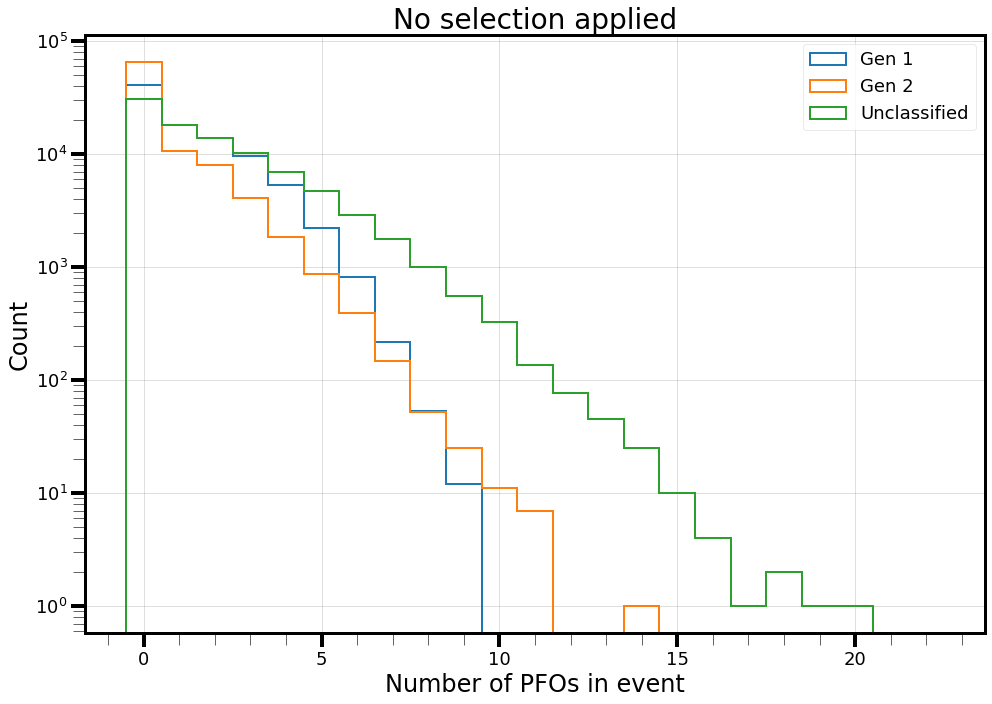

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


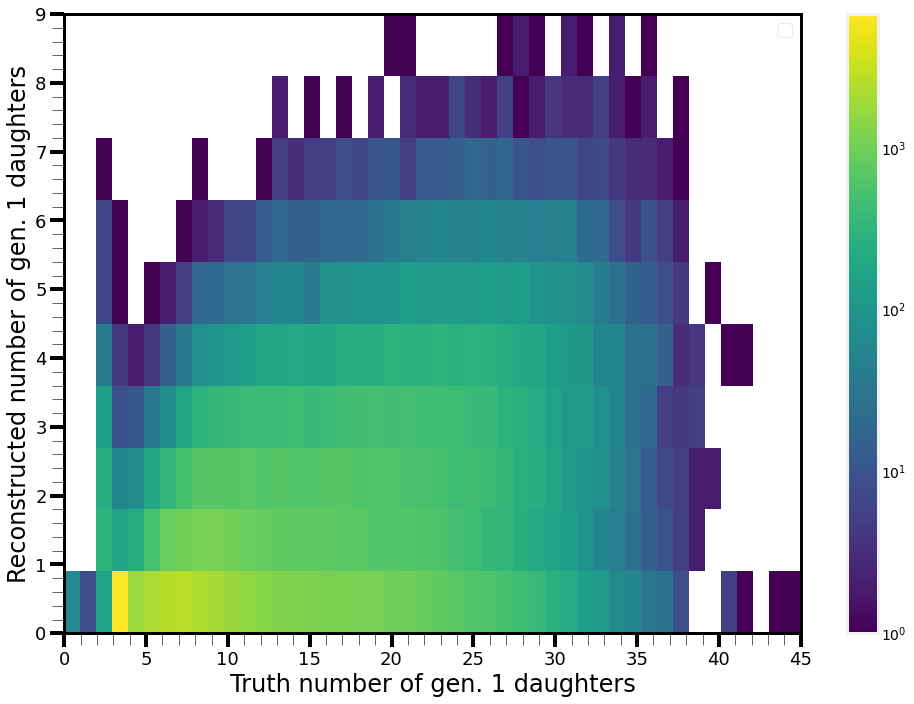

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


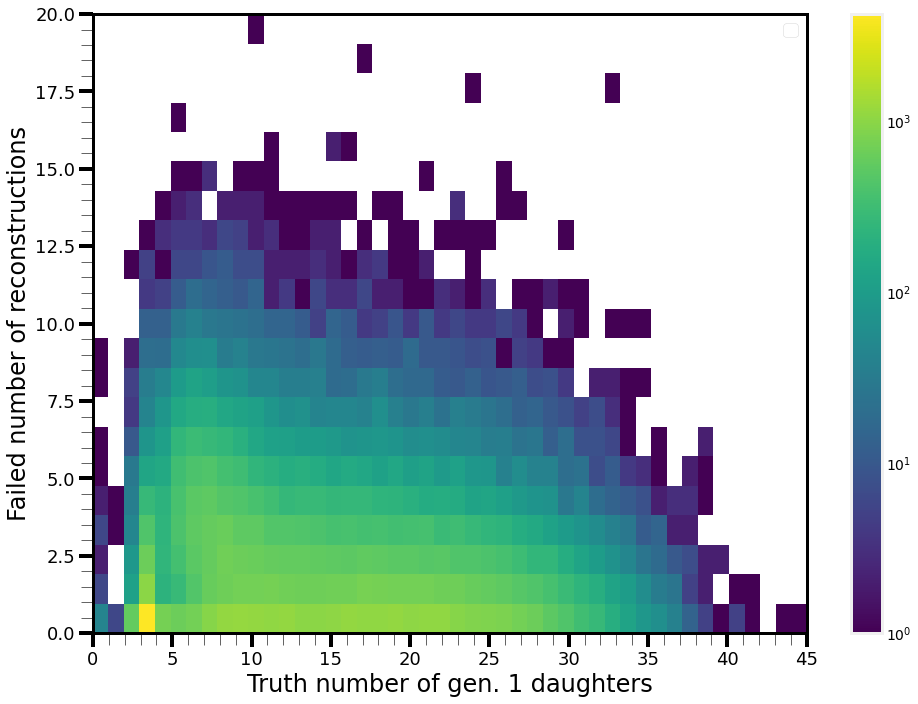

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


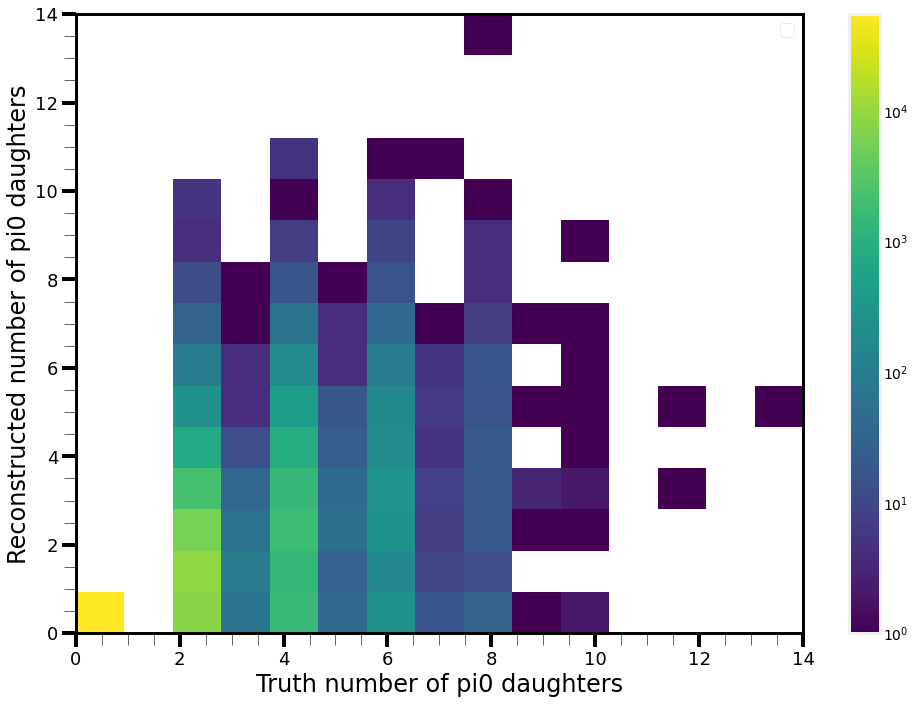

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


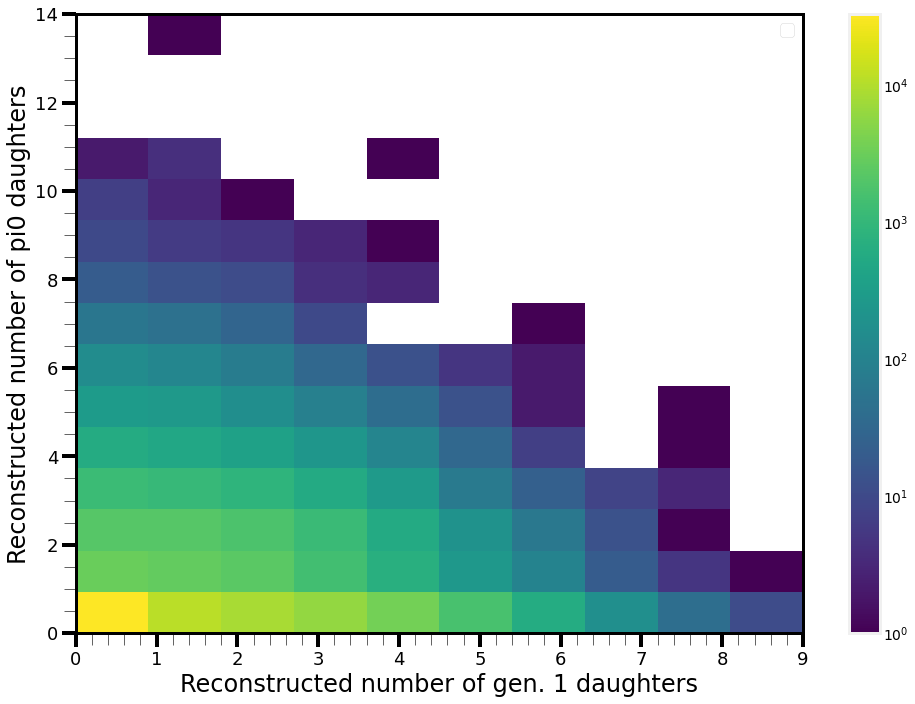

In [11]:
evts_uncut = Master.Data(conf_args.mc_file, nTuple_type = conf_args.ntuple_type)

true_gen1_uncut = gen_1_daughters_truth(evts_uncut)
true_gen2_uncut = pi0_daughters_truth(evts_uncut)
true_beam_uncut = evts_uncut.trueParticles.number == 1
bt_gen1_uncut = gen_1_daughters_bt(evts_uncut)
bt_gen2_uncut = pi0_daughters_bt(evts_uncut)
bt_beam_uncut = evts_uncut.trueParticlesBT.number == 1
bt_others_uncut = np.logical_not(np.logical_or(np.logical_or(bt_gen1_uncut, bt_gen2_uncut), bt_beam_uncut))

plt_conf.setup_figure(title="No selection applied")
plt.hist(count_num_per_event(bt_gen1_uncut), **plt_conf.gen_kwargs(type="hist", label="Gen 1", index=0, bins=np.arange(np.max(ak.count(evts_uncut.trueParticlesBT.number, axis=-1))+1) - 0.5))
plt.hist(count_num_per_event(bt_gen2_uncut), **plt_conf.gen_kwargs(type="hist", label="Gen 2", index=1, bins=np.arange(np.max(ak.count(evts_uncut.trueParticlesBT.number, axis=-1))+1) - 0.5))
plt.hist(count_num_per_event(bt_others_uncut), **plt_conf.gen_kwargs(type="hist", label="Unclassified", index=2, bins=np.arange(np.max(ak.count(evts_uncut.trueParticlesBT.number, axis=-1))+1) - 0.5))
plt_conf.format_axis(xlabel = "Number of PFOs in event", ylabel="Count", ylog=True)
plt_conf.end_plot()

hist_two(true_gen1_uncut, bt_gen1_uncut, "Truth number of gen. 1 daughters", "Reconstructed number of gen. 1 daughters")
hist_two(true_gen1_uncut, bt_others_uncut, "Truth number of gen. 1 daughters", "Failed number of reconstructions")
hist_two(true_gen2_uncut, bt_gen2_uncut, "Truth number of pi0 daughters", "Reconstructed number of pi0 daughters")
hist_two(bt_gen1_uncut, bt_gen2_uncut, "Reconstructed number of gen. 1 daughters", "Reconstructed number of pi0 daughters")

In [5]:
def count_num_per_event(mask):
    return ak.sum(ak.values_astype(mask, int), axis=1)

def gen_1_daughters_bt(events):
    return np.logical_and(events.trueParticlesBT.mother == 1,
                          events.trueParticlesBT.number != 1)

def gen_1_daughters_truth(events):
    return events.trueParticles.mother == 1

def pi0_daughters_truth(events):
    """
    Makes use of the fact only beam, gen 1 and pi0 daughters
    are stored in truth.

    See `mother` definition in `Master.py`, line 884.
    """
    return np.logical_not(
        np.logical_or(events.trueParticles.mother == 1,
                      events.trueParticles.mother == 0))

# # awkward 2.0.0 compatible version (not tested!)
# def isin_eventwise(layouts, **kwargs):
#     assert len(layouts) == 2
#     if layouts[0].is_numpy and layouts[1].is_numpy:
#         return ak.contents.NumpyArray(
#             np.isin(layouts[0].data, layouts[1].data))
# checked_isin = ak.transform(isin_eventwise, bt_nums, true_photon_nums)

def eventwise_isin(elements, test_elements):
    return ak.Array(map(
        lambda zipped: np.isin(zipped["elems"], zipped["tests"]),
        ak.zip(
            {"elems": elements, "tests": test_elements},
            depth_limit=1)))

def pi0_daughters_bt(events):
    true_pi0_daughters = events.trueParticles.number[
        pi0_daughters_truth(events)]
    return eventwise_isin(events.trueParticlesBT.number,
                          true_pi0_daughters)


In [6]:
# These masks completely catagorise every PFO with no overlaps
true_gen1 = gen_1_daughters_truth(evts)
true_gen2 = pi0_daughters_truth(evts)
true_beam = evts.trueParticles.number == 1
bt_gen1 = gen_1_daughters_bt(evts)
bt_gen2 = pi0_daughters_bt(evts)
bt_beam = evts.trueParticlesBT.number == 1
bt_others = np.logical_not(np.logical_or(np.logical_or(bt_gen1, bt_gen2), bt_beam))

In [7]:
bt_all_daughters = np.logical_or(bt_gen1, bt_gen2)

In [36]:
np.max(ak.count(evts.trueParticlesBT.number, axis=-1))

18

In [10]:
def hist_two(mask_one, mask_two, xlab, ylab):
    plt_conf.setup_figure()
    h = plt.hist2d(count_num_per_event(mask_one), count_num_per_event(mask_two), norm="log", bins=np.array([np.max(count_num_per_event(mask_one))+1, np.max(count_num_per_event(mask_two))+1]))
    plt.colorbar(h[-1])
    plt_conf.format_axis(xlabel=xlab, ylabel=ylab)
    plt_conf.end_plot()

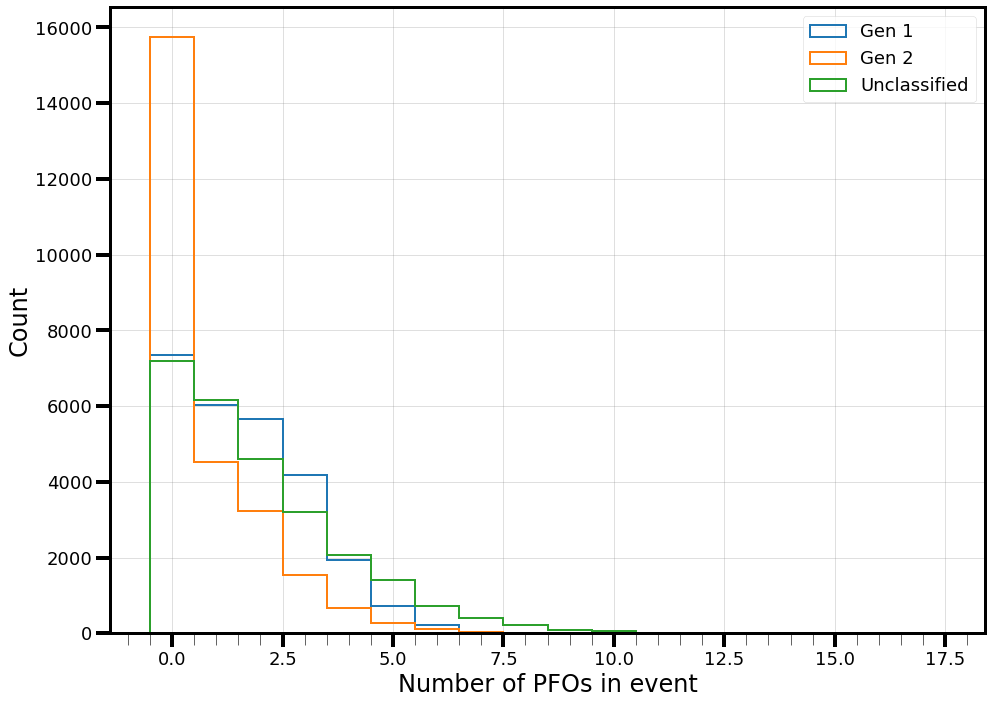

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


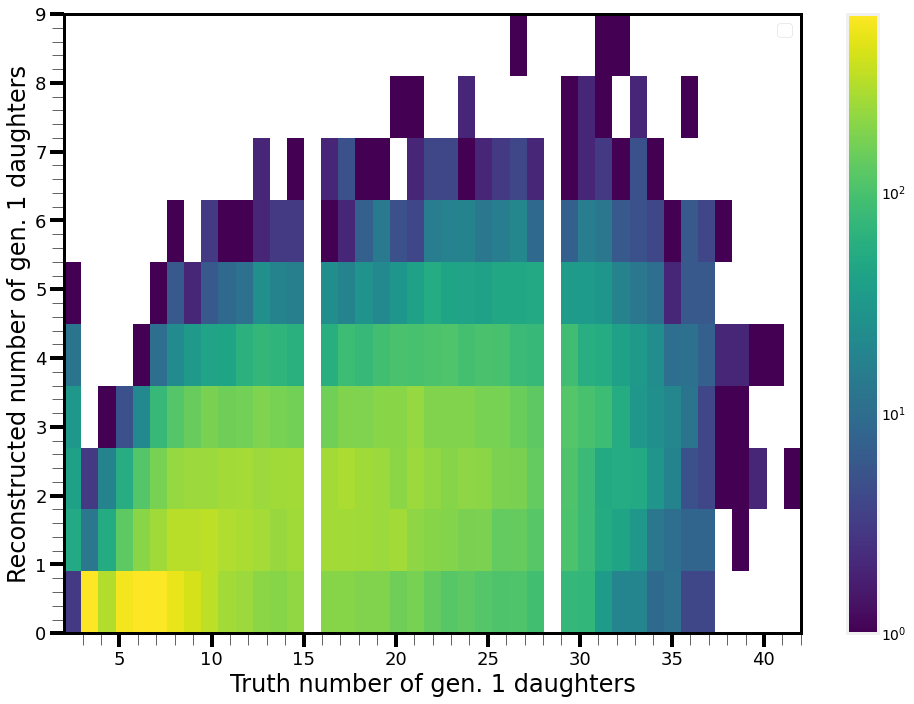

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


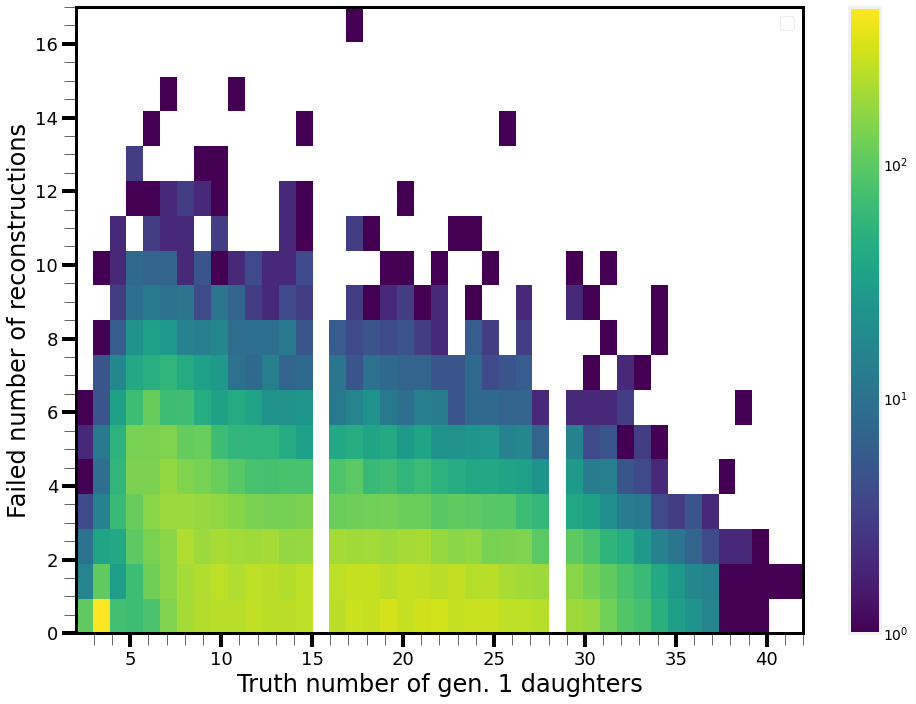

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


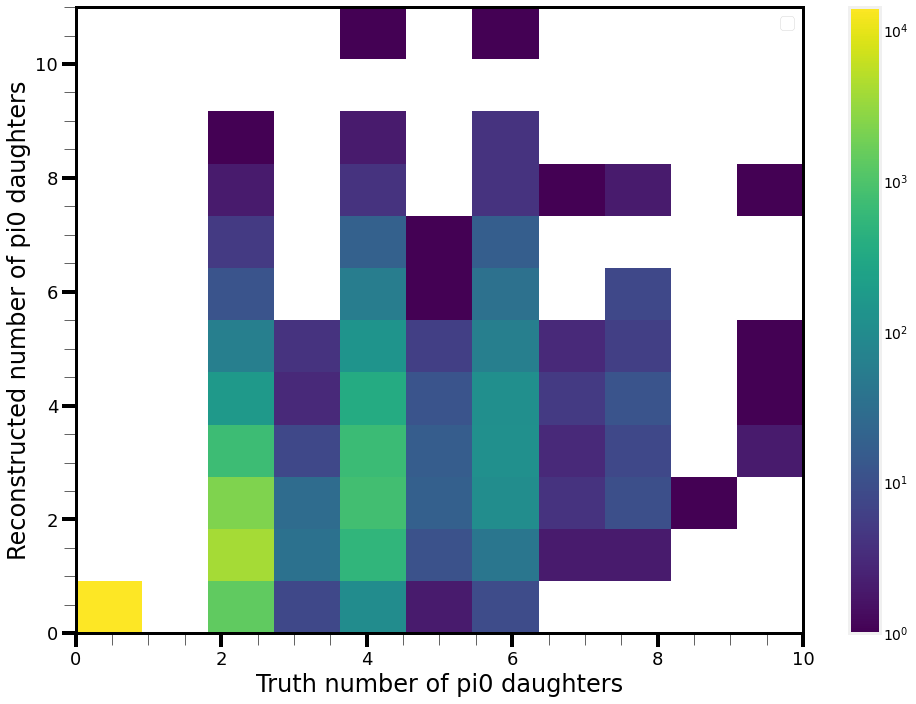

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


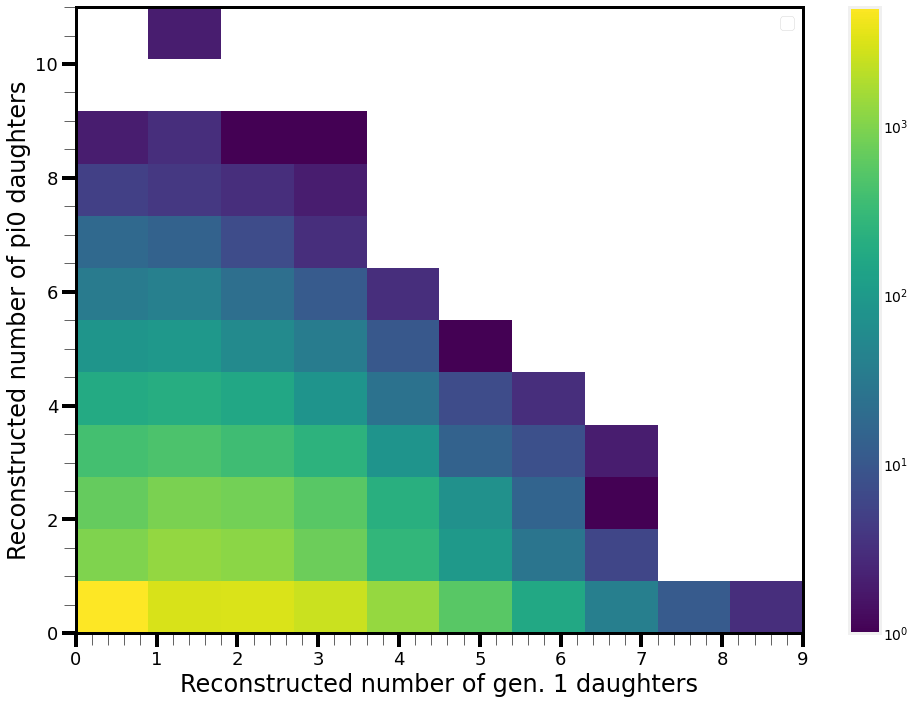

In [14]:
plt_conf.setup_figure()
plt.hist(count_num_per_event(bt_gen1), **plt_conf.gen_kwargs(type="hist", label="Gen 1", index=0, bins=np.arange(np.max(ak.count(evts.trueParticlesBT.number, axis=-1))+1) - 0.5))
plt.hist(count_num_per_event(bt_gen2), **plt_conf.gen_kwargs(type="hist", label="Gen 2", index=1, bins=np.arange(np.max(ak.count(evts.trueParticlesBT.number, axis=-1))+1) - 0.5))
plt.hist(count_num_per_event(bt_others), **plt_conf.gen_kwargs(type="hist", label="Unclassified", index=2, bins=np.arange(np.max(ak.count(evts.trueParticlesBT.number, axis=-1))+1) - 0.5))
plt_conf.format_axis(xlabel = "Number of PFOs in event", ylabel="Count", ylog=False)
plt_conf.end_plot()

hist_two(true_gen1, bt_gen1, "Truth number of gen. 1 daughters", "Reconstructed number of gen. 1 daughters")
hist_two(true_gen1, bt_others, "Truth number of gen. 1 daughters", "Failed number of reconstructions")
hist_two(true_gen2, bt_gen2, "Truth number of pi0 daughters", "Reconstructed number of pi0 daughters")
hist_two(bt_gen1, bt_gen2, "Reconstructed number of gen. 1 daughters", "Reconstructed number of pi0 daughters")

In [13]:
def gen_features_from_dict(d, keys_to_use=None):
    if keys_to_use is not None:
        d = {key:val for key, val in d.items() if key in keys_to_use}
    for i, val in enumerate(d.values()):
        if i == 0:
            features = np.zeros((ak.count(val), len(d)))
        value = ak.ravel(val)
        features[:, i] = value
    return features

def separate_train_test(truth, props_to_use: dict, test_frac=0.2, keys_to_use=None):
    if keys_to_use is not None:
        props_to_use = {key:val for key, val in props_to_use.items() if key in keys_to_use}
    if not isinstance(truth, ak.Array):
        flat_truth = np.zeros(ak.count(truth[0]), dtype=int)
        for i, t_mask in enumerate(truth):
            flat_truth[ak.ravel(t_mask)] = i+1
    else:
        flat_truth = ak.ravel(truth)
    n_tot = len(flat_truth)
    num_train = int(len(flat_truth) *(1-test_frac))
    print(f"{n_tot} data points found, separated into {num_train} "
          + f"training points and {n_tot - num_train} test_points.")
    train_classes = ak.values_astype(flat_truth[:num_train], int)
    test_truth = flat_truth[num_train:]
    train_data = np.zeros((num_train, len(props_to_use)))
    test_props = {}
    for i, item in enumerate(props_to_use.items()):
        val = ak.ravel(item[1])
        train_data[:, i] = val[:num_train]
        test_props[item[0]] = val[num_train:]
    return train_classes, train_data, test_truth, test_props

def wrap_bdt_args(bdt_fit_func, selector: seval.SelectorEvaluator):
    props_dict = selector.properties
    ind_dict = {}
    for i, key in enumerate(props_dict.keys()):
        if i == 0:
            num_pfos = len(ak.ravel(props_dict[key]))
        ind_dict[key] = i
    num_props = len(props_dict)
    def func(use_props):
        bdt_arg = np.zeros((num_pfos, num_props))
        for key, val in use_props.items():
            if val is not None:
                bdt_arg[:, ind_dict[key]] = ak.ravel(val)
        return bdt_fit_func(bdt_arg)
    return func

def bdt_probs(bdt_obj):
    def func(data):
        return bdt_obj.predict_proba(data)[:,1]
    return func

def convert_dict_to_array(props_dict):
    for i, val in enumerate(props_dict.values()):
        if i == 0:
            res = np.zeros((len(ak.ravel(val)), len(props_dict)))
        res[:, i] = ak.ravel(val)
    return res

def plot_importances(bdt, props):
    plt_conf.setup_figure()
    plt.bar([label.replace('_', '\n') for label in props.keys()], bdt.feature_importances_)
    plt_conf.format_axis(ylog=False, xlabel="Feature", ylabel="Importance")
    plt_conf.end_plot()

## Geometric Classification
Currently uses mostly the raw positions etc. of the particles. Will move to using physical quantities later.

Considered ideas:
- Dot product of direction with beam direction
- Dot product of own direction vs. direction between beam end point and own start point
- Thrust? along radial direction
- Create some plane of particles in the radial direction measure from the cylindrical coordinates centered around the beam direction
- All the event like variables will be a comparision between the total of the whole event, and the variable with this one parameter missing
- Possibly hints to a new way of doing it. Use this method to parameterise the partcles with respect to this plane to 
- Give angle around circle in radial direction
- Angular momentum of PFO with respect to the beam

Created variables should be tested on truth first!

In [42]:
evts_raw = Master.Data(conf_args.mc_file, nTuple_type = conf_args.ntuple_type)

In [43]:
print(ak.count(evts_raw.recoParticles.track_start_dir.x))
print(ak.num(evts_raw.recoParticles.track_start_dir.x, axis=0))
print(ak.num(evts_raw.recoParticles.track_start_dir.x, axis=1))
print(ak.count(evts_raw.recoParticles.track_start_dir.x, axis=0))

362892
91237
[0, 7, 1, 5, 6, 3, 4, 4, 7, 4, 3, 3, 7, ... 2, 3, 5, 2, 8, 1, 0, 0, 1, 7, 10, 5, 2]
[81100, 74595, 63953, 50460, 36248, 23904, 14552, 8339, ... 47, 30, 20, 9, 3, 1, 1]


In [44]:
print(ak.count(evts_raw.recoParticles.track_len))
print(ak.num(evts_raw.recoParticles.track_len, axis=0))
print(ak.num(evts_raw.recoParticles.track_len, axis=1))
print(ak.count(evts_raw.recoParticles.track_len, axis=0))

379943
91237
[0, 7, 1, 6, 6, 3, 4, 4, 7, 4, 3, 3, 7, ... 2, 3, 5, 3, 9, 1, 0, 0, 1, 7, 10, 6, 3]
[81241, 75275, 65510, 52807, 39260, 26895, 17055, 9914, ... 35, 22, 12, 7, 3, 1, 1]


In [45]:
evts_beam = Master.Data(conf_args.mc_file, nTuple_type = conf_args.ntuple_type)
evts_beam = apply_selection(evts_beam, "mc", "beam")

            Name  Remaining events  Percentage of total events remaining  \
0   Initial data             91237                            100.000000   
1              -             72019                             78.936177   
2              -             63508                             69.607725   
3              -             59771                             65.511799   
4              -             45862                             50.266887   
5              -             42147                             46.195074   
6              -             40749                             44.662801   
7              -             33019                             36.190361   
8              -             32919                             36.080757   
9              -             31855                             34.914563   
10             -             26165                             28.678058   

    Relative percentage events  Remaining PFOs  \
0                   100.000000       

/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to filters.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to filename.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to nTuple_type.
  warnings.warn(f"Couldn't apply filters to {var}.")


In [46]:
print(ak.count(evts_beam.recoParticles.track_start_dir.x))
print(ak.num(evts_beam.recoParticles.track_start_dir.x, axis=0))
print(ak.num(evts_beam.recoParticles.track_start_dir.x, axis=1))
print(ak.count(evts_beam.recoParticles.track_start_dir.x, axis=0))

127794
26165
[1, 4, 7, 3, 3, 2, 7, 5, 7, 4, 9, 6, 4, 3, ... 3, 3, 5, 2, 8, 4, 2, 4, 5, 7, 2, 1, 7]
[26022, 25134, 22827, 18979, 14080, 9321, 5518, 2973, ... 88, 45, 23, 8, 3, 2, 1]


In [47]:
print(ak.count(evts_beam.recoParticles.track_len))
print(ak.num(evts_beam.recoParticles.track_len, axis=0))
print(ak.num(evts_beam.recoParticles.track_len, axis=1))
print(ak.count(evts_beam.recoParticles.track_len, axis=0))

134264
26165
[1, 4, 7, 3, 3, 3, 8, 5, 7, 4, 9, 6, 4, 4, ... 3, 4, 5, 3, 8, 4, 2, 6, 5, 8, 2, 1, 7]
[26029, 25255, 23245, 19788, 15280, 10583, 6612, 3683, ... 62, 30, 12, 6, 2, 1, 1]


In [49]:
evts_pfo = Master.Data(conf_args.mc_file, nTuple_type = conf_args.ntuple_type)
evts_pfo = apply_selection(evts_pfo, "mc", "valid_pfo")

           Name  Remaining events  Percentage of total events remaining  \
0  Initial data             91237                                 100.0   
1             -             91237                                 100.0   

   Relative percentage events  Remaining PFOs  \
0                       100.0          379943   
1                       100.0          341313   

   Percentage of total PFOs remaining  Relative percentage of PFOs  \
0                          100.000000                   100.000000   
1                           89.832685                    89.832685   

   Average PFOs per event  
0                4.164352  
1                3.740949  


/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to filters.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to filename.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to nTuple_type.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to run.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to subRun.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/an

In [57]:
raw_good_mask = np.logical_not(np.logical_or(evts_raw.recoParticles.track_start_pos.x==-999., np.logical_or(evts_raw.recoParticles.track_start_pos.y==-999.,evts_raw.recoParticles.track_start_pos.z==-999.)))
test_start_pos = evts_raw.recoParticles.track_start_pos.x[raw_good_mask]

assert ak.count(evts_pfo.recoParticles.track_start_dir.x) == ak.count(test_start_pos)
assert ak.num(evts_pfo.recoParticles.track_start_dir.x, axis=0) == ak.num(test_start_pos, axis=0)
assert ak.all(ak.num(evts_pfo.recoParticles.track_start_dir.x, axis=1) == ak.num(test_start_pos, axis=1))
assert ak.all(ak.count(evts_pfo.recoParticles.track_start_dir.x, axis=0) == ak.count(test_start_pos, axis=0))

In [50]:
print(ak.count(evts_pfo.recoParticles.track_start_dir.x))
print(ak.num(evts_pfo.recoParticles.track_start_dir.x, axis=0))
print(ak.num(evts_pfo.recoParticles.track_start_dir.x, axis=1))
print(ak.count(evts_pfo.recoParticles.track_start_dir.x, axis=0))

362892
91237
[0, 7, 1, 5, 6, 3, 4, 4, 7, 4, 3, 3, 7, ... 2, 3, 5, 2, 8, 1, 0, 0, 1, 7, 10, 5, 2]
[81100, 74595, 63953, 50460, 36248, 23904, 14552, 8339, ... 47, 30, 20, 9, 3, 1, 1]


In [51]:
print(ak.count(evts_pfo.recoParticles.track_len))
print(ak.num(evts_pfo.recoParticles.track_len, axis=0))
print(ak.num(evts_pfo.recoParticles.track_len, axis=1))
print(ak.count(evts_pfo.recoParticles.track_len, axis=0))

341313
91237
[0, 7, 1, 3, 5, 3, 4, 4, 6, 4, 3, 3, 7, ... 2, 3, 5, 2, 9, 1, 0, 0, 1, 7, 10, 4, 2]
[80864, 73609, 61757, 47052, 32272, 20306, 11790, 6546, ... 61, 32, 19, 7, 2, 1, 1]


In [28]:
ak.count(evts.recoParticles.track_start_dir.x)

127794

In [8]:
print(ak.count(evts.recoParticles.track_start_dir.x))
print(ak.num(evts.recoParticles.track_start_dir.x, axis=0))
print(ak.num(evts.recoParticles.track_start_dir.x, axis=1))
print(ak.count(evts.recoParticles.track_start_dir.x, axis=0))

119568
26165
[1, 4, 6, 3, 3, 2, 6, 5, 7, 3, 8, 5, 3, 3, ... 2, 3, 5, 2, 7, 4, 2, 3, 5, 7, 2, 1, 7]
[25995, 24952, 22212, 17779, 12446, 7710, 4275, 2180, ... 119, 59, 25, 12, 4, 1, 1]


In [9]:
print(ak.count(evts.recoParticles.track_len))
print(ak.num(evts.recoParticles.track_len, axis=0))
print(ak.num(evts.recoParticles.track_len, axis=1))
print(ak.count(evts.recoParticles.track_len, axis=0))

119568
26165
[1, 4, 6, 3, 3, 2, 6, 5, 7, 3, 8, 5, 3, 3, ... 2, 3, 5, 2, 7, 4, 2, 3, 5, 7, 2, 1, 7]
[25995, 24952, 22212, 17779, 12446, 7710, 4275, 2180, ... 119, 59, 25, 12, 4, 1, 1]


In [32]:
ak.count(evts.io.Get("reco_daughter_allTrack_startDirX"))

362892

In [34]:
ak.count(evts.io.Get("reco_daughter_allShower_dirX"))

379943

In [33]:
ak.count(evts.io.Get("reco_daughter_allTrack_startX"))

379943

In [9]:
geom_props = {
    "length": evts.recoParticles.track_len,
    "alt_length": evts.recoParticles.track_len_alt,
    "beam_impact_params": PFOSelection.find_beam_impact_parameters(evts),
    "beam_separations": PFOSelection.find_beam_separations(evts),
    "beam_start_X":evts.recoParticles.beam_endPos.x*ak.ones_like(evts.recoParticles.track_start_pos.x),
    "beam_start_Y":evts.recoParticles.beam_endPos.y*ak.ones_like(evts.recoParticles.track_start_pos.x),
    "beam_start_Z":evts.recoParticles.beam_endPos.z*ak.ones_like(evts.recoParticles.track_start_pos.x),
    "track_score": evts.recoParticles.track_score,
    "track_start_X": evts.recoParticles.track_start_pos.x,
    "track_start_Y": evts.recoParticles.track_start_pos.y,
    "track_start_Z": evts.recoParticles.track_start_pos.z,
    "track_dir_X": evts.recoParticles.track_start_dir.x,
    "track_dir_Y": evts.recoParticles.track_start_dir.y,
    "track_dir_Z": evts.recoParticles.track_start_dir.z,
    "track_end_X": evts.recoParticles.track_end_pos.x,
    "track_end_Y": evts.recoParticles.track_end_pos.y,
    "track_end_Z": evts.recoParticles.track_end_pos.z,
    "shower_start_X": evts.recoParticles.shower_start_pos.x,
    "shower_start_Y": evts.recoParticles.shower_start_pos.y,
    "shower_start_Z": evts.recoParticles.shower_start_pos.z,
    "shower_dir_X": evts.recoParticles.shower_direction.x,
    "shower_dir_Y": evts.recoParticles.shower_direction.y,
    "shower_dir_Z": evts.recoParticles.shower_direction.z}

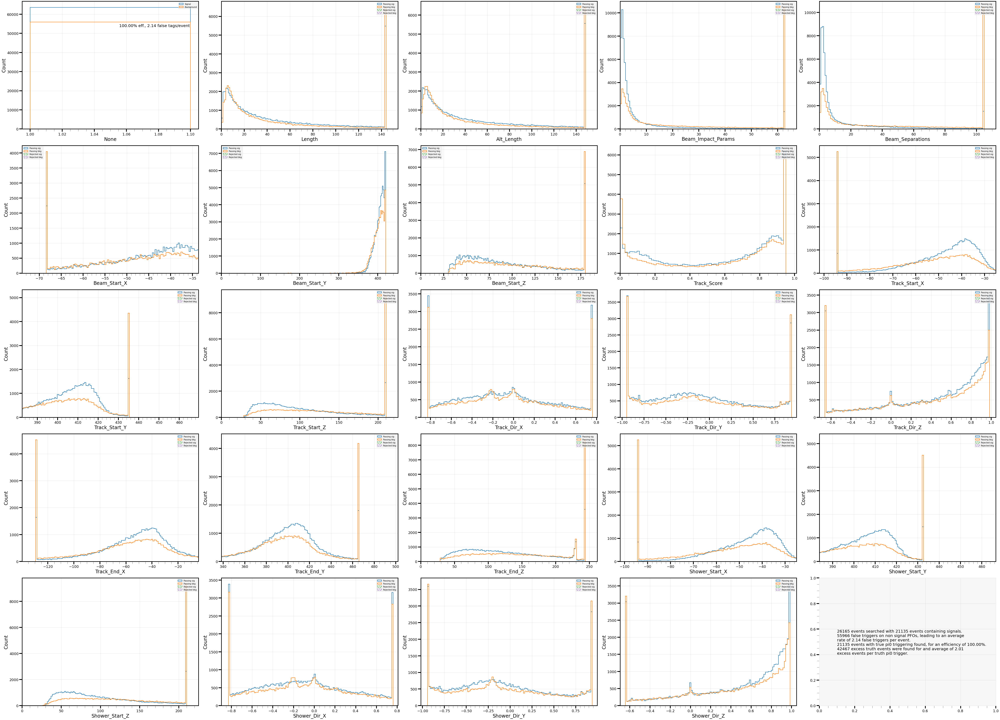

In [10]:
pfo_geom_eval = seval.SelectorEvaluator(bt_all_daughters, geom_props)
pfo_geom_eval.add_selector_metric("none")
pfo_geom_eval.make_metric_summary("none", style="quartile_rejected")

119568 data points found, separated into 95654 training points and 23914 test_points.


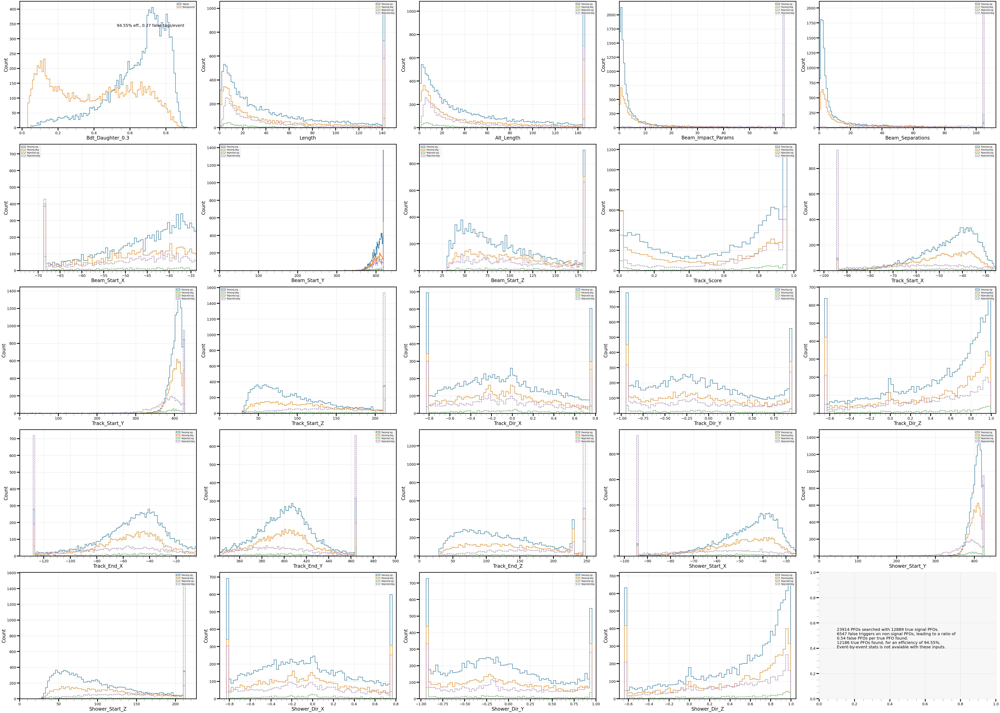

In [10]:
train_class_geom, train_data_geom, test_truth_geom, test_props_geom = separate_train_test(bt_all_daughters, geom_props)
bdt_geom = ensemble.GradientBoostingClassifier()
bdt_geom.fit(train_data_geom, train_class_geom)
bdt_geom_eval = seval.SelectorEvaluator(test_truth_geom, test_props_geom)
bdt_geom_eval.add_metric("bdt_daughter_0.3", wrap_bdt_args(bdt_probs(bdt_geom), bdt_geom_eval), threshold=0.3)
bdt_geom_eval.make_metric_summary("bdt_daughter_0.3", style="quartile_rejected")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


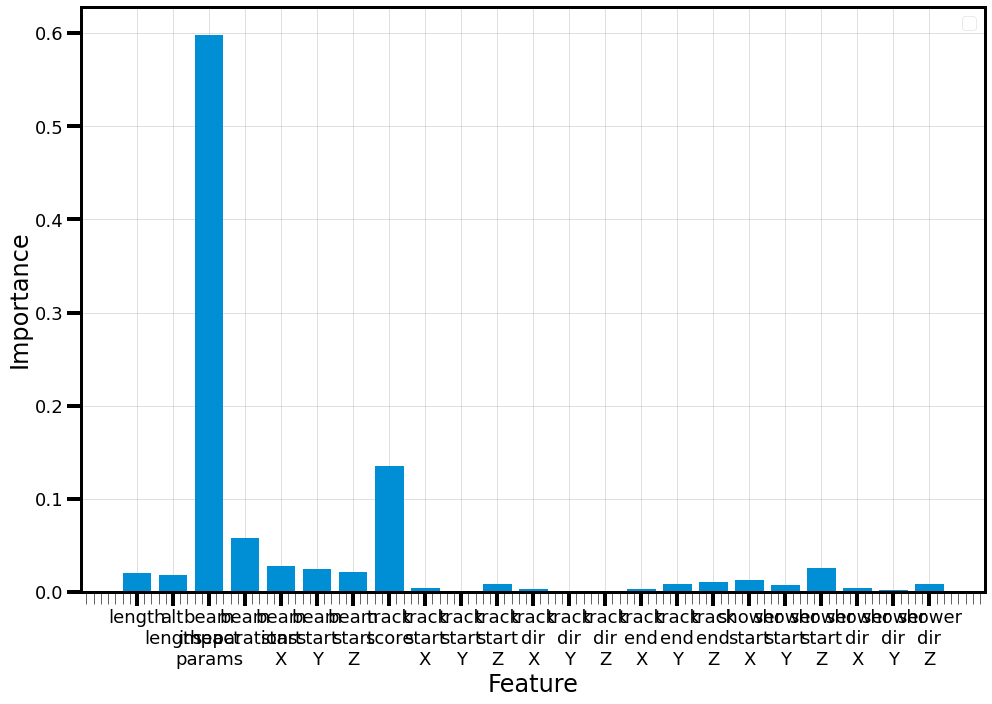

In [12]:
plot_importances(bdt_geom, test_props_geom)

In [ ]:
["length", "beam_impact_params", "beam_start_X", "beam_start_Z", "track_start_X", "track_start_Z", "track_dir_Y", "track_end_X", "track_end_Z", "shower_start_Y", "shower_dir_X", "shower_dir_Z"]
[    "alt_length",  "beam_separations", "beam_start_Y", "track_score",  "track_start_Y", "track_dir_X", "track_dir_Z", "track_end_Y", "shower_start_X", "shower_start_Z", "shower_dir_Y"       ]

In [ ]:
evts.io.ListNTuples()

In [66]:
gen1_daughter_truth = evts.trueParticlesBT.mother == 1
geom_props = {
    "impact":PFOSelection.find_beam_impact_parameters(evts),
    "separation":PFOSelection.find_beam_separations(evts),
    "length":evts.recoParticles.track_len,
    "beam_length":ak.ones_like(evts.recoParticles.track_len) * evts.recoParticles.beam_track_length
}
train_class_geom, train_data_geom, test_truth_geom, test_props_geom = separate_train_test(gen1_daughter_truth, geom_props)

119924 data points found, separated into 95939 training points and 23985 test_points.


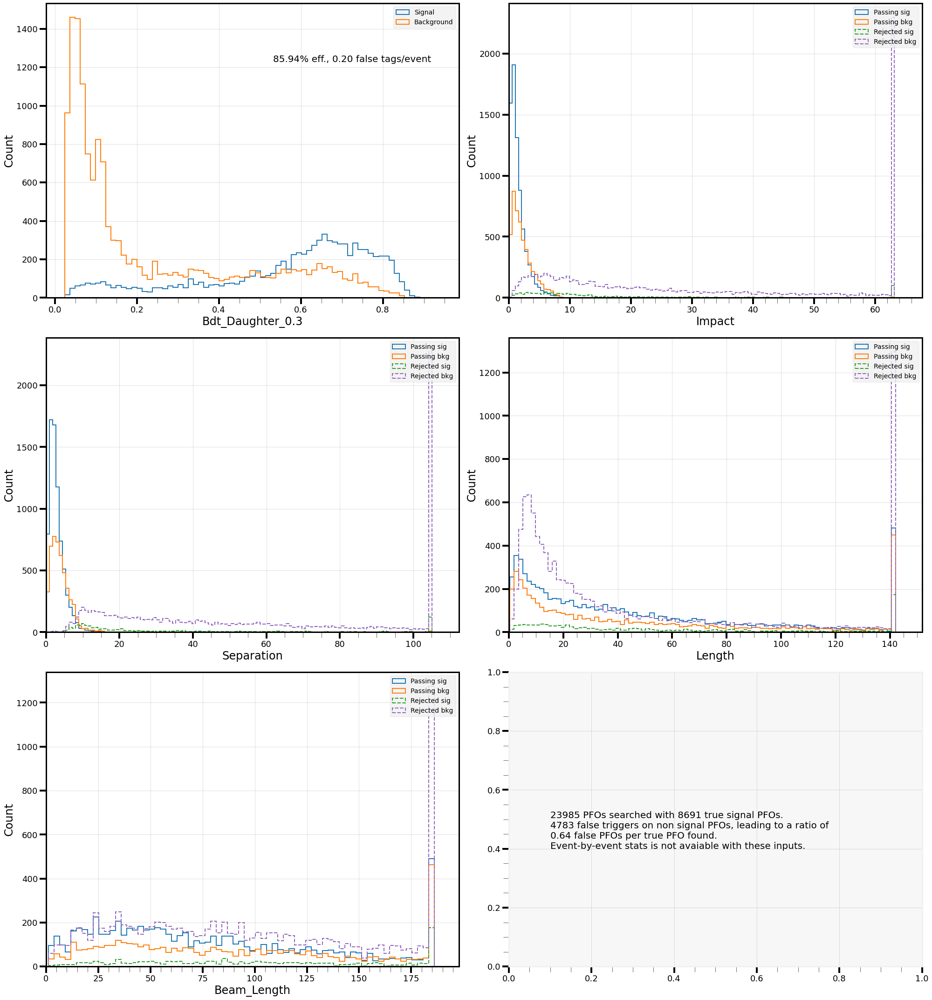

In [67]:
bdt_geom = ensemble.GradientBoostingClassifier()
bdt_geom.fit(train_data_geom, train_class_geom)
bdt_geom_eval = seval.SelectorEvaluator(test_truth_geom, test_props_geom)
bdt_geom_eval.add_metric("bdt_daughter_0.3", wrap_bdt_args(bdt_probs(bdt_geom), bdt_geom_eval), threshold=0.3)
bdt_geom_eval.make_metric_summary("bdt_daughter_0.3", style="quartile_rejected")

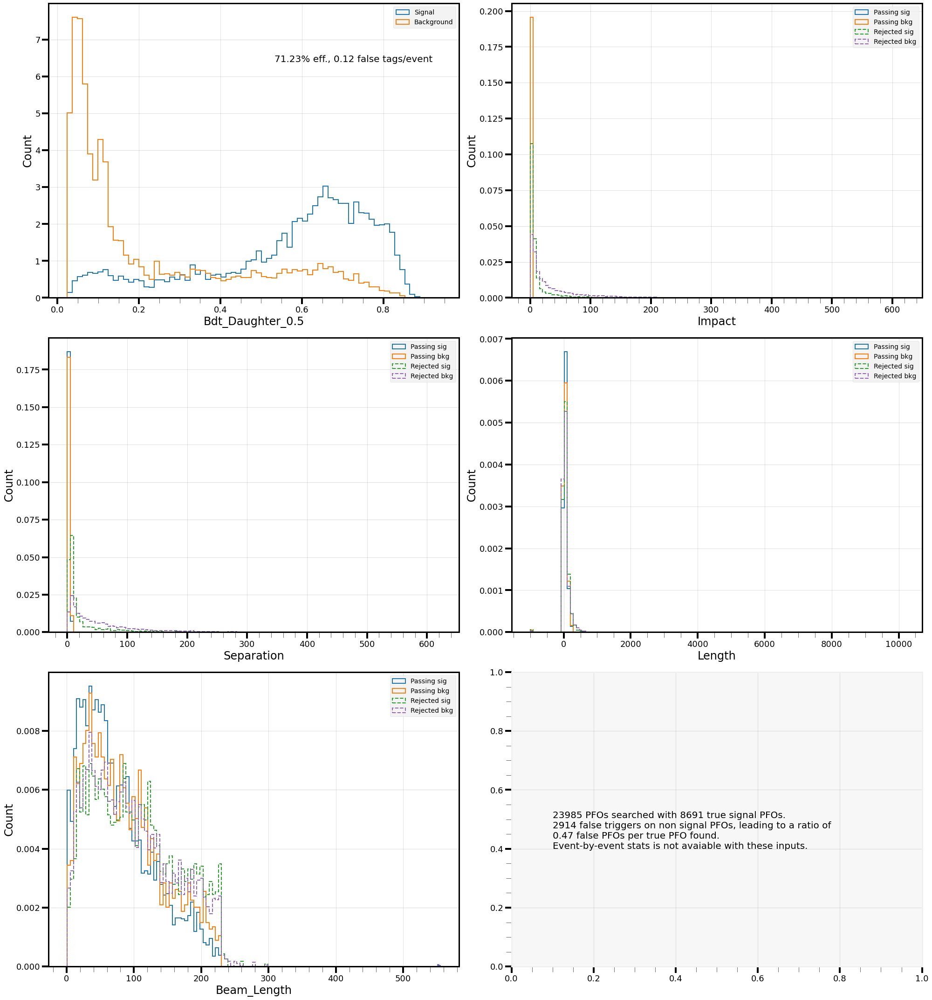

In [69]:
bdt_geom_eval.add_metric("bdt_daughter_0.5", wrap_bdt_args(bdt_probs(bdt_geom), bdt_geom_eval), threshold=0.5 )
bdt_geom_eval.make_metric_summary("bdt_daughter_0.5")

## $\pi^+$(/proton) identification
MicroBooNE paper: https://arxiv.org/pdf/1710.00898.pdf
See section 4.2 for a brief discussion on the observables they pull from the track.

Available reco params:
- number
- nHits
- nHits_collection
- startPos    > Ask Shyam about this (for tracks)
- direction  /
- trackScore
- track_dEdX


Params to explore:
- Track length
- Total energy
- Beam approach
- Beam separation
- 90/10% d2EdX2     > Make plots looking at some generic dEdX distributions
- 90/10% sum dEdX  /
- sum dR^2 from z line between initial and end point
- Sum dR from z line between initial and end point
- (Probably not, jsut sum instead) max dR from zline between initial and endpoit point
  -     ^ in general some handles on curvature - potentially two different handles - one for curved, one for variation
- variables that represent the shape and scale of the dE/dx (or dQ/dx) curve at any point along the reconstructed track


In [11]:
# piplus_props = {
#     "track": evts.recoParticles.track_score,
#     "nhits": evts.recoParticles.n_hits,
#     "dEdx": PFOSelection.Median(evts.recoParticles.track_dEdX),
#     "chi2": evts.recoParticles.track_chi2_pion,
#     "chi2_dof": evts.recoParticles.track_chi2_pion_ndof}
daughter_mask = np.logical_and(evts.trueParticlesBT.mother == 1,
                               evts.trueParticlesBT.number != 1)

piplus_truth = np.logical_and(daughter_mask,
                              evts.trueParticlesBT.pdg == 211)
pi_truth = np.logical_and(
    daughter_mask,
    np.logical_or(evts.trueParticlesBT.pdg == 211,
                  evts.trueParticlesBT.pdg == -211))
proton_truth = np.logical_and(daughter_mask,
                              evts.trueParticlesBT.pdg == 2212)
muon_truth = np.logical_and(daughter_mask,
                              evts.trueParticlesBT.pdg == 13)
any_mu_truth = np.logical_and(
    daughter_mask,
    np.logical_or(evts.trueParticlesBT.pdg == 13,
                  evts.trueParticlesBT.pdg == -13))

photon_truth = np.logical_and(evts.trueParticlesBT.pdg == 22, bt_gen2)

del daughter_mask

In [11]:
pi_truth = np.logical_or(evts.trueParticlesBT.pdg == 211,
                         evts.trueParticlesBT.pdg == -211)
proton_truth = evts.trueParticlesBT.pdg == 2212
muon_truth = np.logical_or(evts.trueParticlesBT.pdg == 13,
                           evts.trueParticlesBT.pdg == -13)

photon_truth = evts.trueParticlesBT.pdg == 22
electron_truth = np.logical_or(evts.trueParticlesBT.pdg == 11, 
                               evts.trueParticlesBT.pdg == -11)

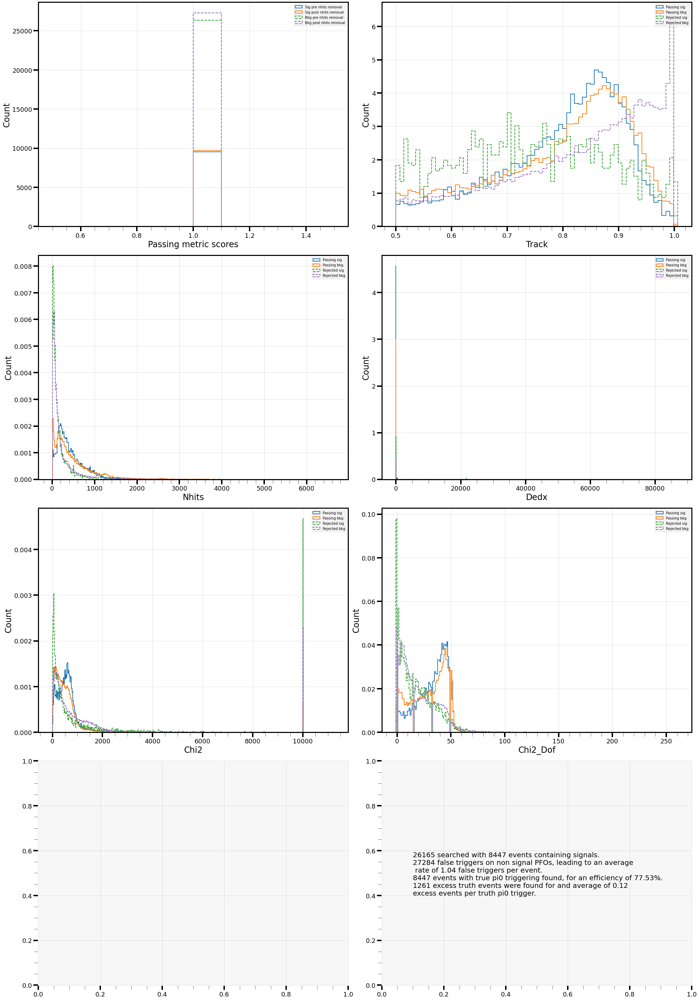

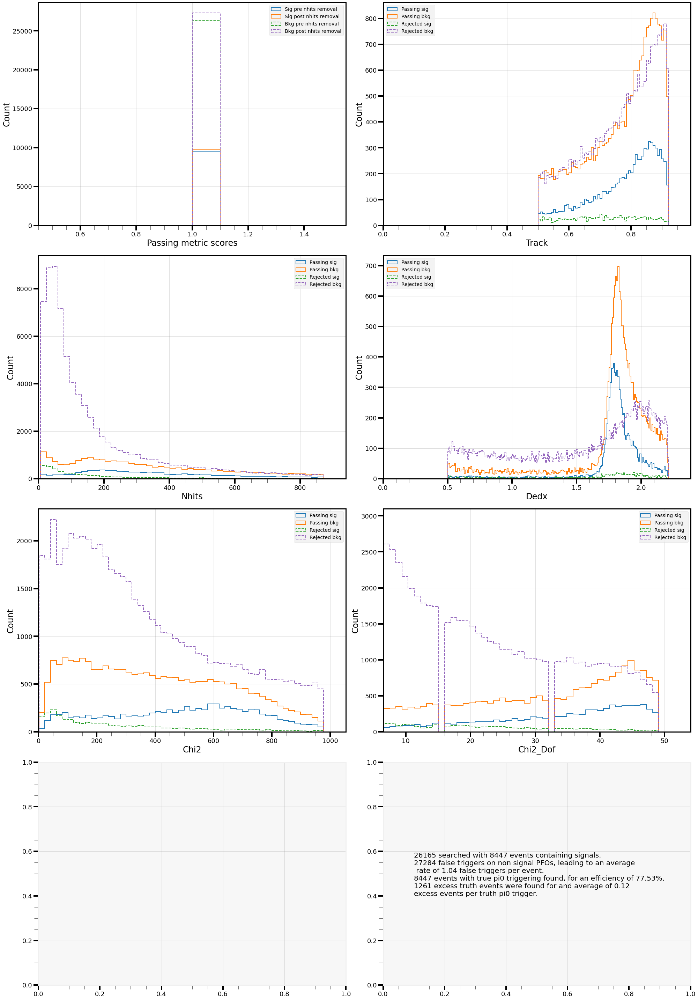

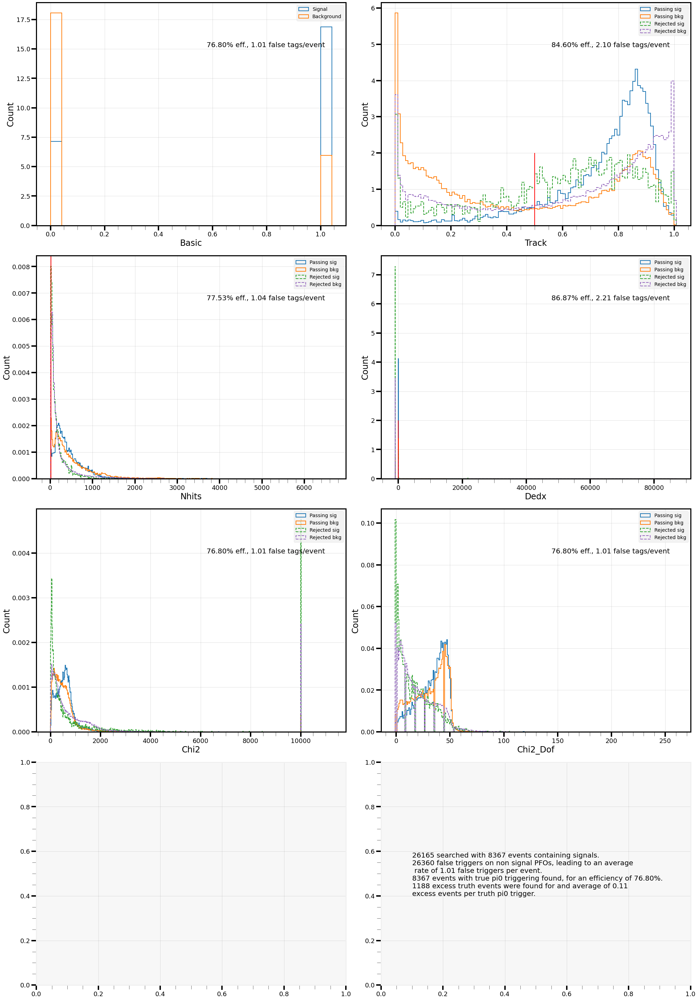

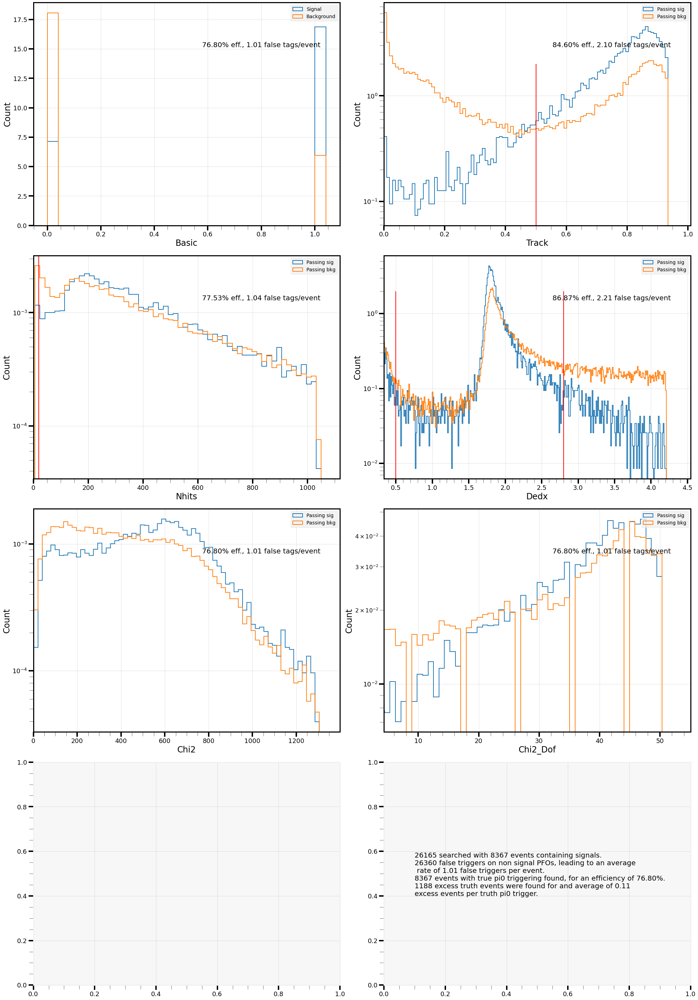

In [7]:
pipselector = seval.SelectorEvaluator(piplus_truth, piplus_props)
pipselector.add_selector_metric("basic", track=(0.5,), nhits=(20,), dEdx=(0.5,2.8))

pipselector.make_n_minus_1_summary("basic", "nhits")
pipselector.make_n_minus_1_summary("basic", "nhits", style="rejected_quartile")
pipselector.make_n_minus_1_per_property("basic")
pipselector.make_n_minus_1_per_property("basic", style="display")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


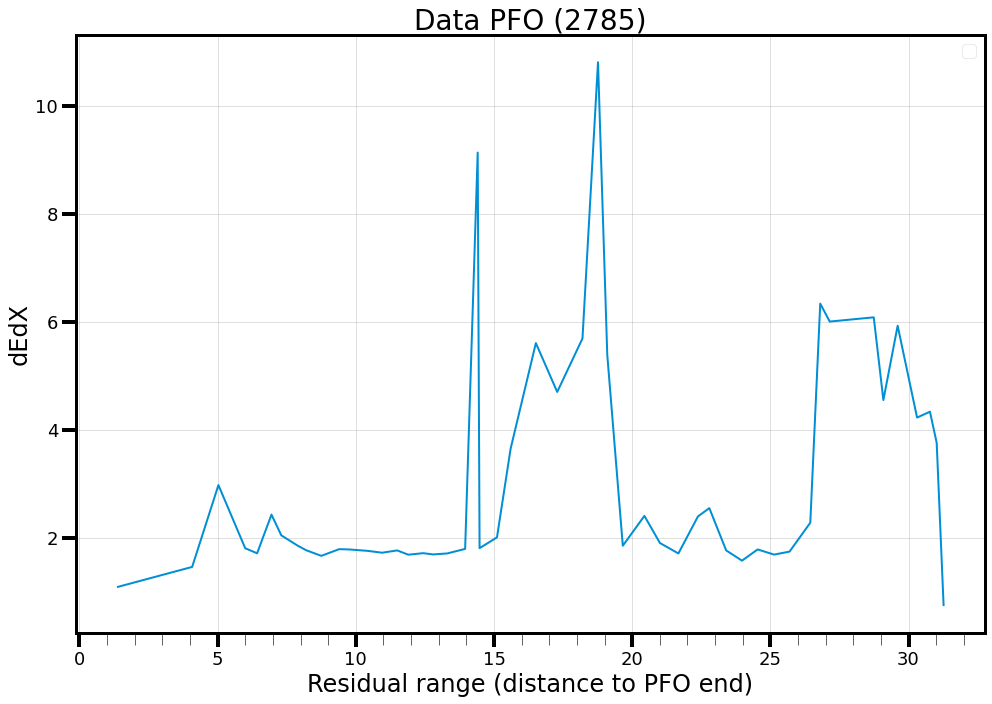

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


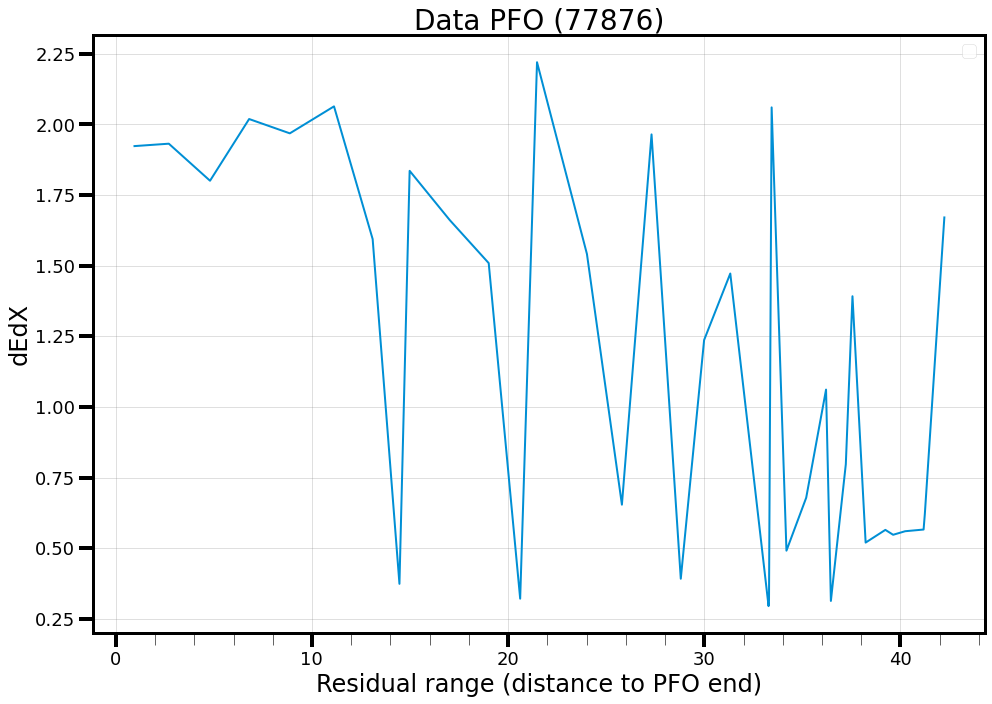

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


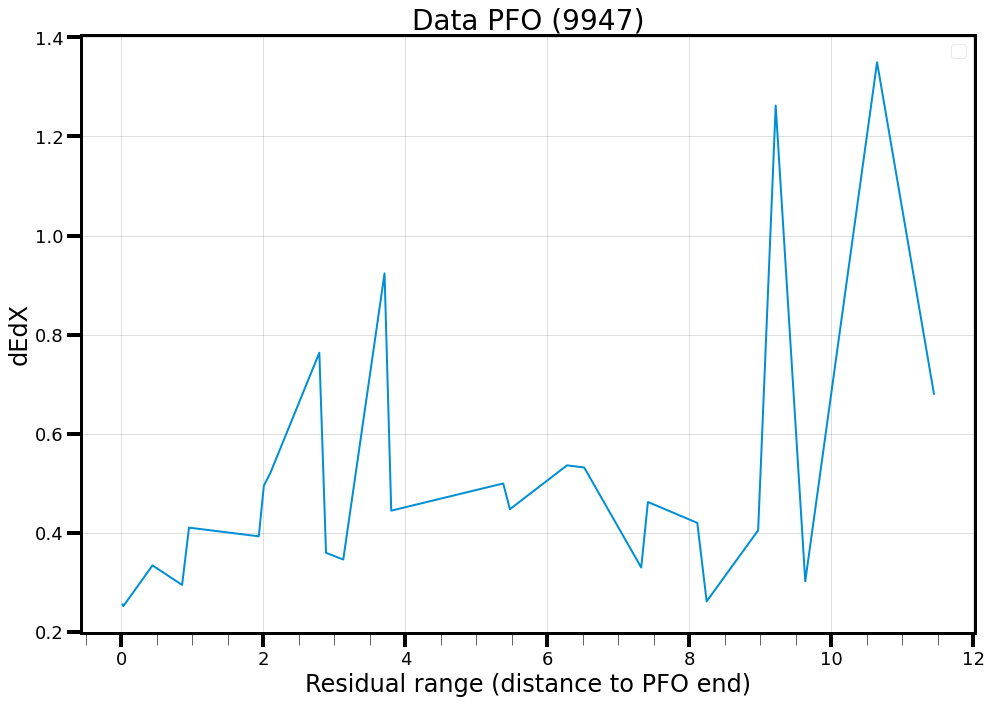

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


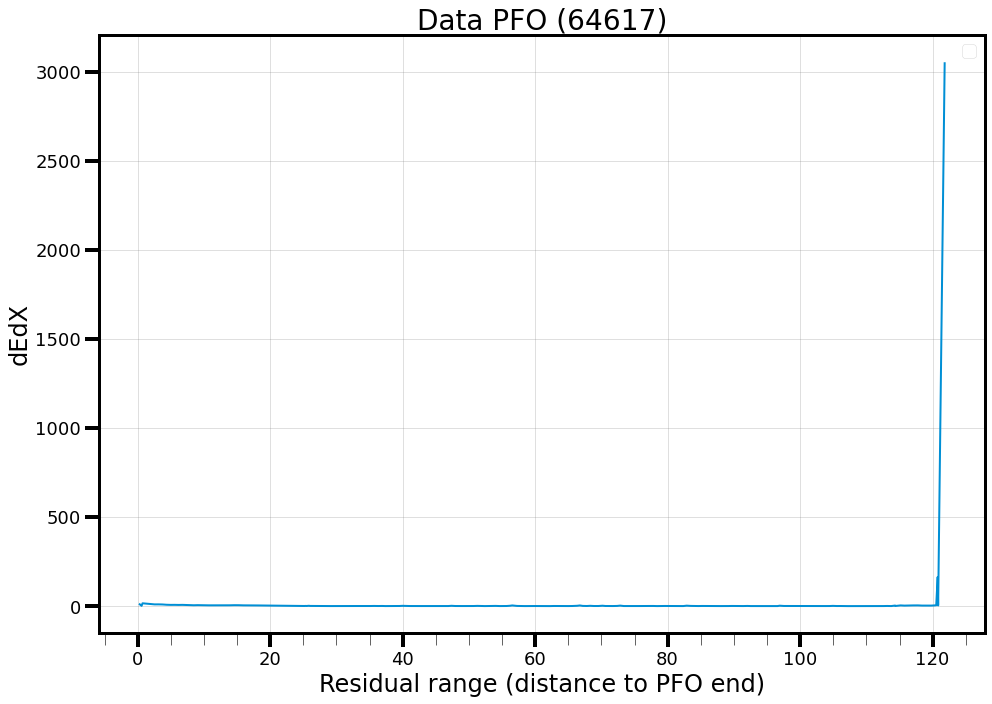

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


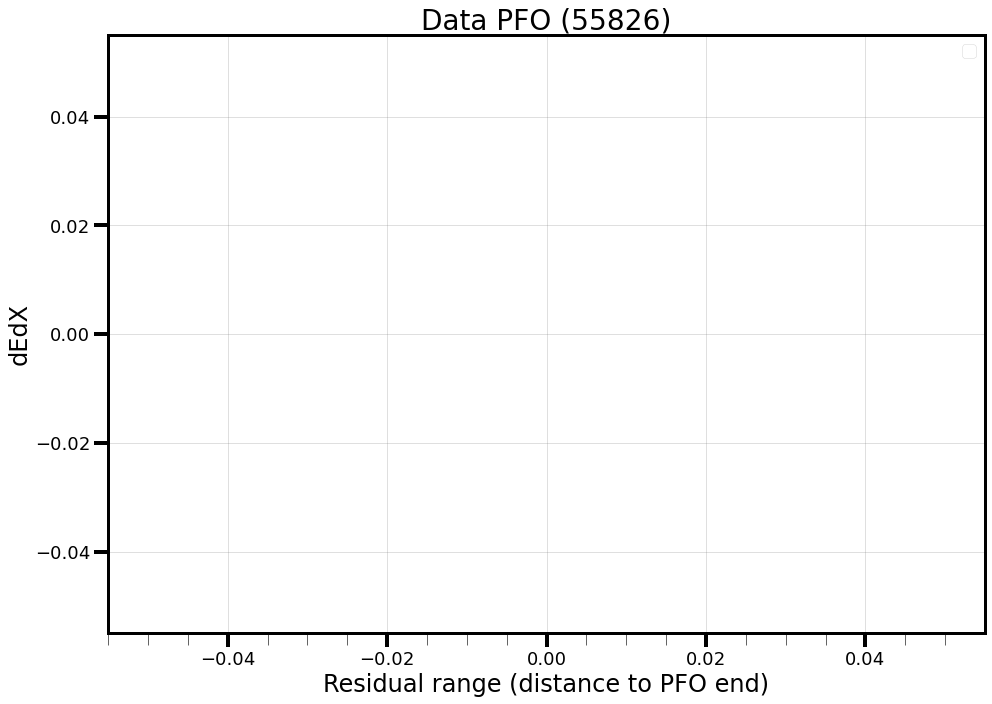

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


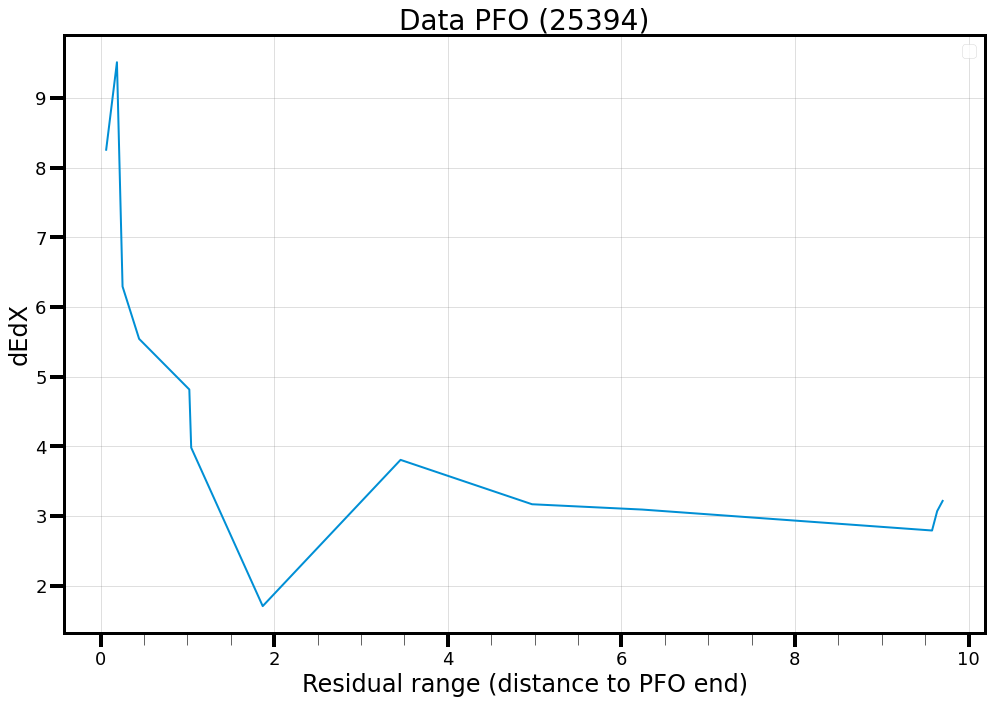

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


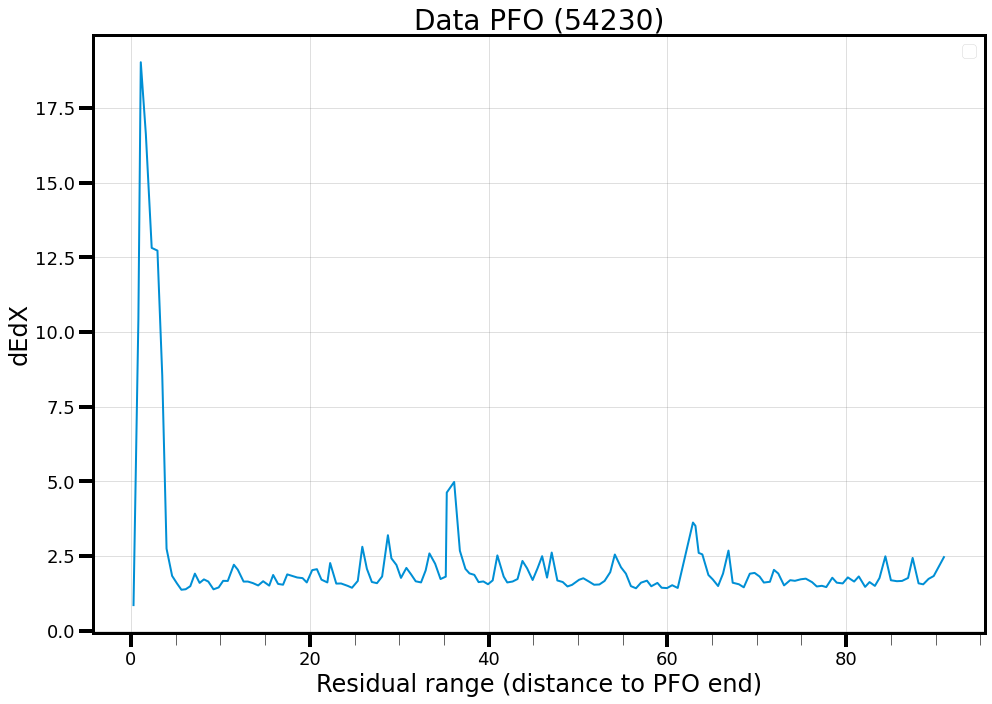

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


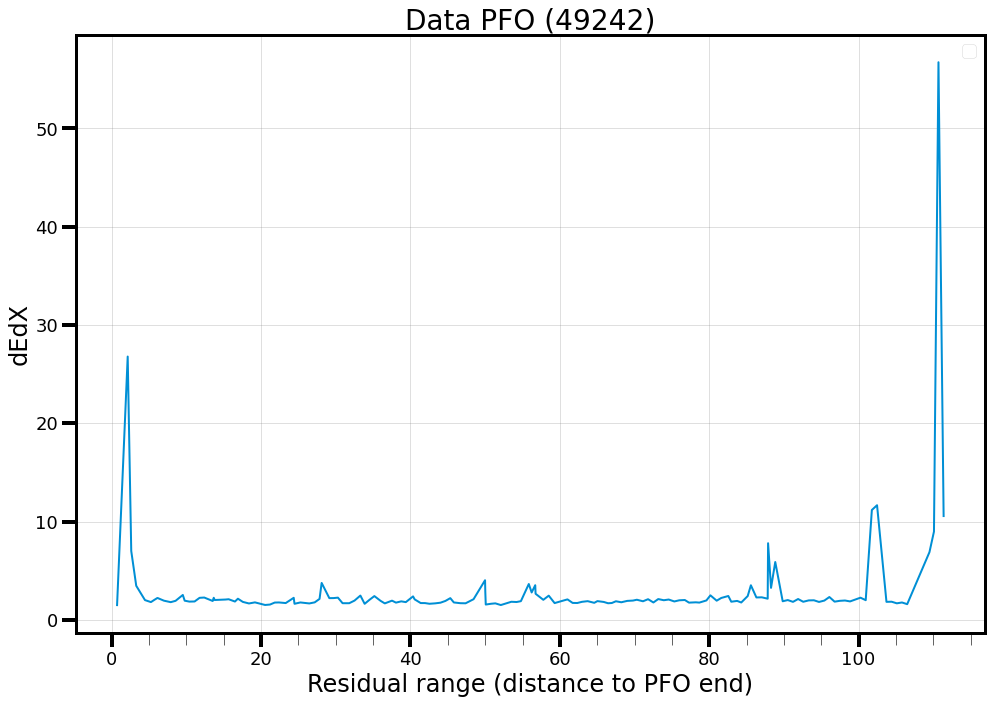

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


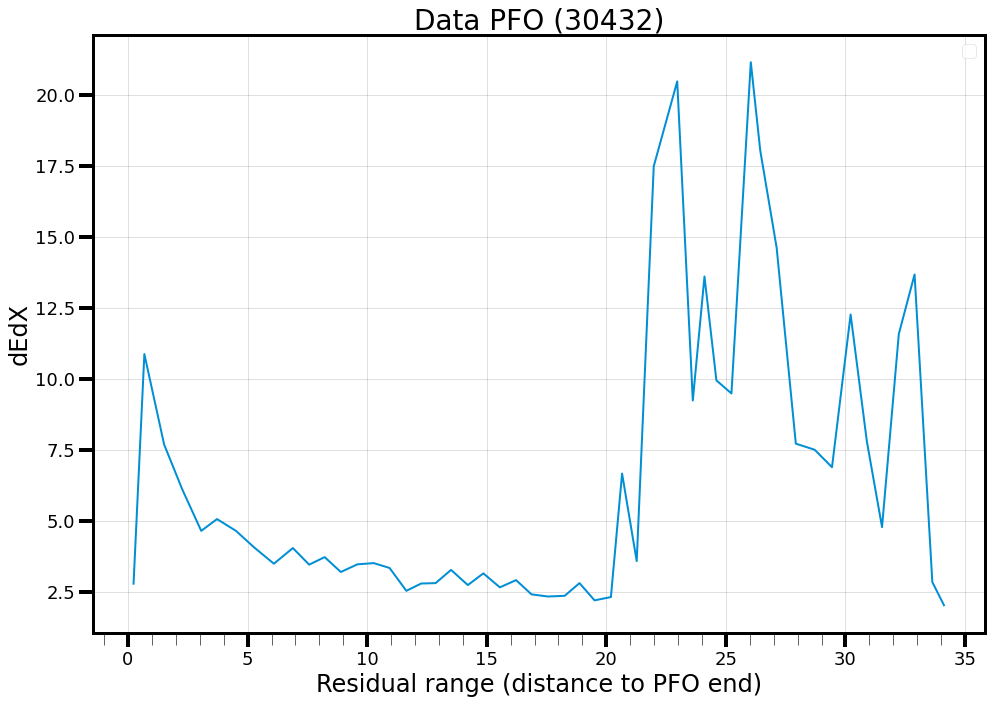

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


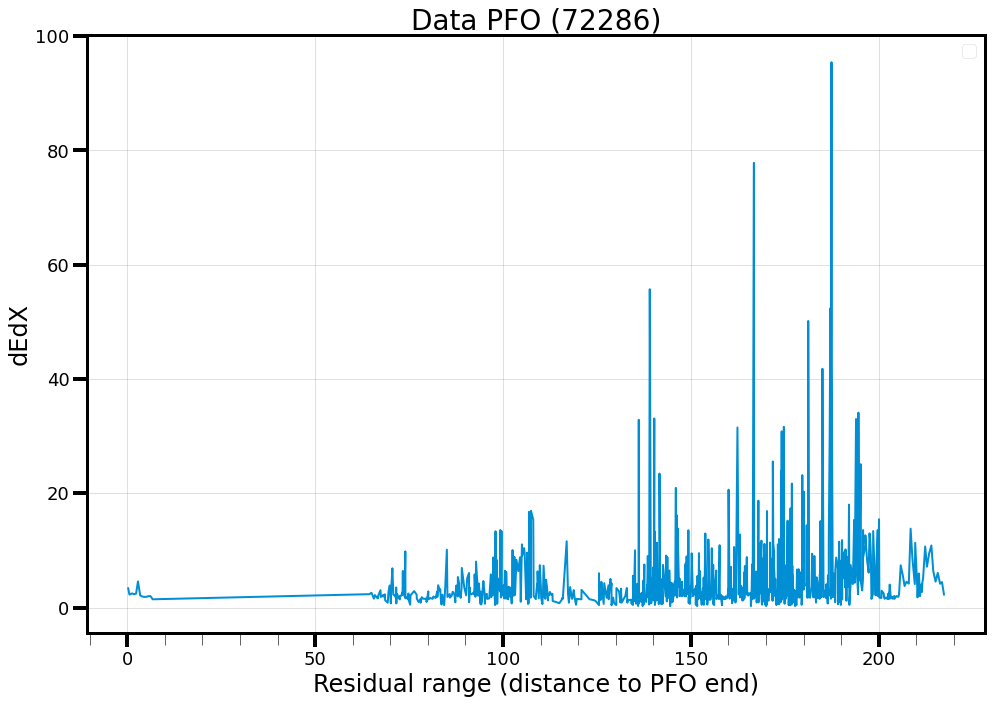

In [35]:
data_flat_dedx = ak.flatten(evts_data.recoParticles.track_dEdX, axis=1)
data_flat_res = ak.flatten(evts_data.recoParticles.residual_range, axis=1)

data_n_pfos = len(data_flat_dedx)

for _ in range(10):
    ind = np.random.randint(0, data_n_pfos)
    plt_conf.setup_figure(title=f"Data PFO ({ind})")
    plt.plot(data_flat_res[ind], data_flat_dedx[ind], **plt_conf.gen_kwargs())
    plt_conf.format_axis(xlabel = "Residual range (distance to PFO end)", ylabel="dEdX", ylog=False)
    plt_conf.end_plot()

In [38]:
np.unique(ak.ravel(evts.trueParticlesBT.pdg), return_counts=True)

(array([      -321,       -211,        -13,        -11,         11,
                13,         22,        211,        321,       2212,
              3112,       3222, 1000010020, 1000010030, 1000020030,
        1000020040, 1000070150], dtype=int32),
 array([   69, 12025,  5953,  2841,   240,  2770, 33422, 22700,   779,
        37928,     7,     4,  1135,    41,     7,     2,     1]))

In [7]:
flat_dedx = ak.flatten(evts.recoParticles.track_dEdX, axis=1)
flat_res = ak.flatten(evts.recoParticles.residual_range, axis=1)

n_pfos = len(flat_dedx)

pfo_type = {1: "Pion (+)", 2:"Muon", 3:"Proton"}
pfo_catalogue = np.zeros(n_pfos, dtype=int)
pfo_catalogue[ak.ravel(piplus_truth)] = 1
pfo_catalogue[ak.ravel(muon_truth)] = 2
pfo_catalogue[ak.ravel(proton_truth)] = 3
known_pfos = np.logical_or(ak.ravel(piplus_truth), np.logical_or(ak.ravel(muon_truth), ak.ravel(proton_truth)))
known_flat_dedx = flat_dedx[known_pfos]
known_flat_res = flat_res[known_pfos]
known_n_pfos = len(known_flat_dedx)
known_pfo_catalogue = pfo_catalogue[known_pfos]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0, 0, 4, 2, 3, 1, 5, 0, 2, 0, 3, 0, 0, 1, ... 1, 0, 2, 0, 3, 2, 1, 4, 4, 1, 0, 0, 2]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ... 0, 0, 1, 0, 1, 0, 0, 0, 0, 2, 0, 0, 0]
(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), array([7355, 5299, 5452, 4371, 2250, 1004,  332,   71,   27,    4]))


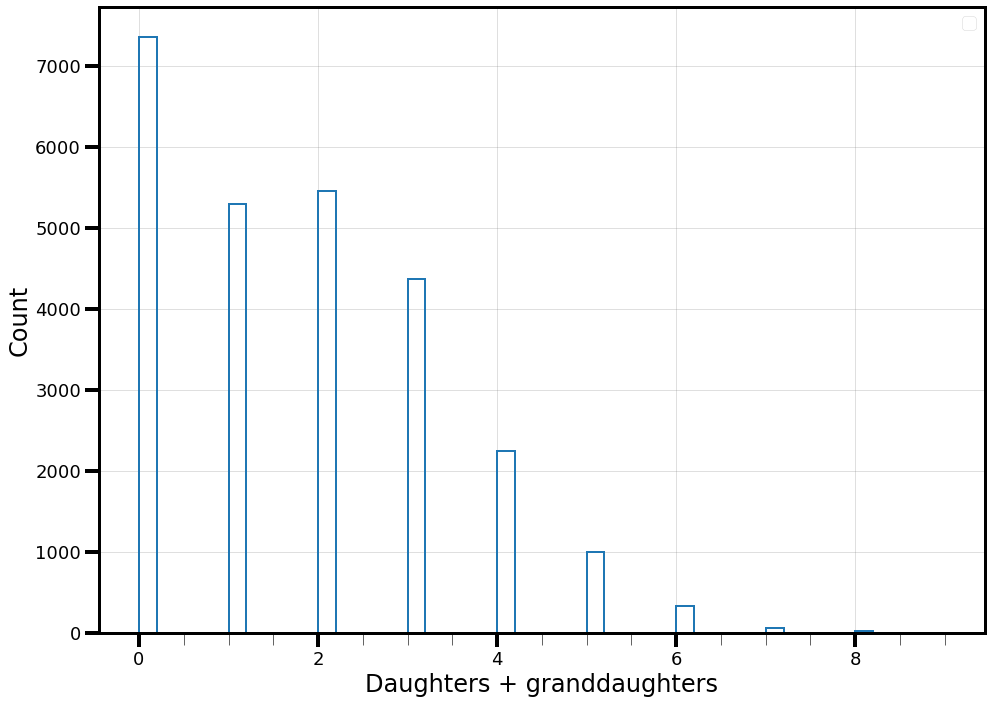

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


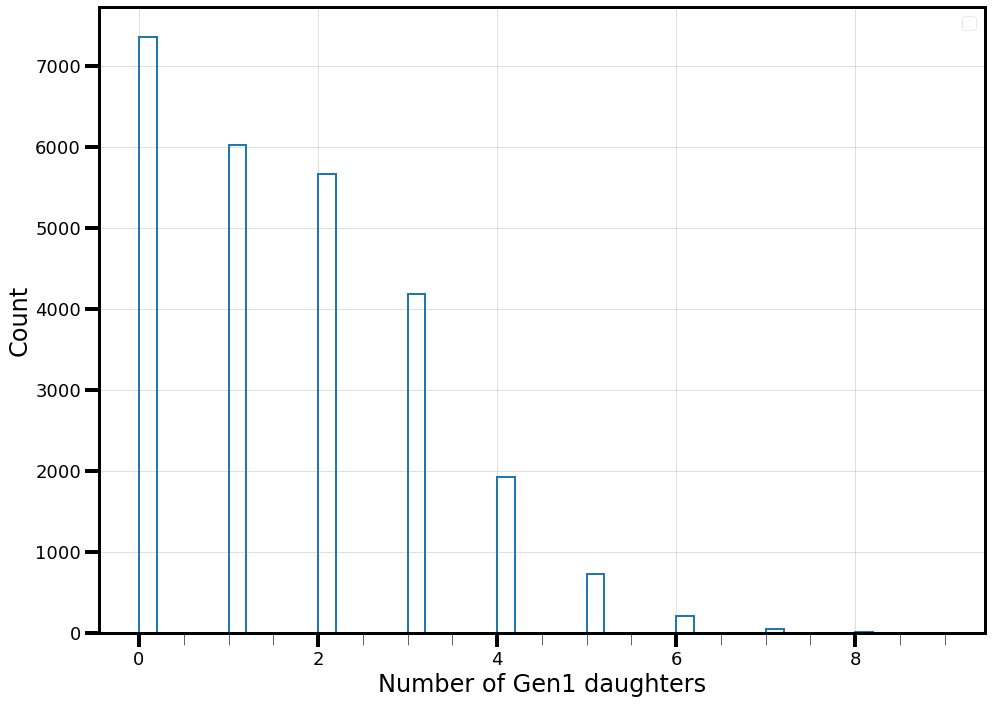

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


6


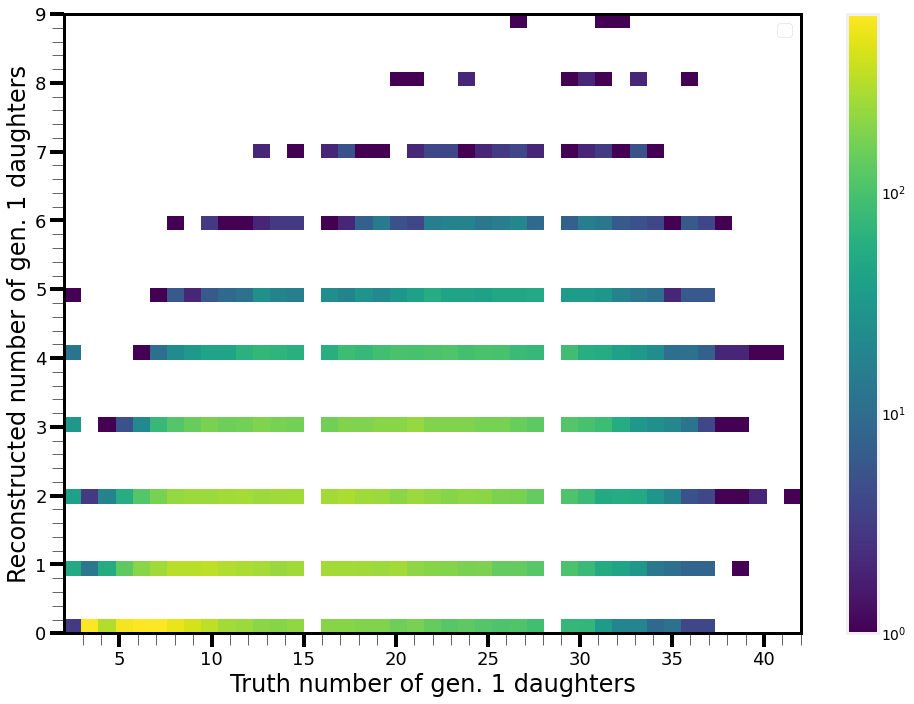

In [8]:
def get_gen2_counts(events, mother_id=None):
    if mother_id is not None:
        id_mask = events.trueParticlesBT.pdg == mother_id
    else:
        id_mask = True

    beam_particles = np.logical_and(
        events.trueParticlesBT.mother == 1,
        id_mask)
    mother_numbers = events.trueParticlesBT.number[beam_particles]
    candidates = evts.trueParticlesBT.mother[evts.trueParticlesBT.mother != 1]

    def get_counts(zipped):
        return 0 + sum([sum(zipped['candidates'] == pfo) for pfo in np.intersect1d(
            zipped['mother'],
            zipped['candidates'])])

    return ak.Array(map(
        get_counts,
        ak.zip(
            {"mother": mother_numbers, "candidates": candidates},
            depth_limit=1)))

truth_gen1_particles = np.logical_and(evts.trueParticles.mother == 1,
                                      evts.trueParticles.number != 1)
true_gen1_daughters = np.logical_and(evts.trueParticlesBT.mother == 1,
                                     evts.trueParticlesBT.number != 1)
true_gen2_counts = get_gen2_counts(evts)
print(ak.sum(ak.values_astype(true_gen1_daughters, int), axis=1))
print(true_gen2_counts)
true_gen1_counts = ak.sum(ak.values_astype(true_gen1_daughters, int), axis=1)
n_beam_pfos = true_gen1_counts + true_gen2_counts
print(np.unique(n_beam_pfos, return_counts=True))
plt_conf.setup_figure()
plt.hist(n_beam_pfos, **plt_conf.gen_kwargs(type="hist", bins=plt_conf.get_bins(n_beam_pfos)))
plt_conf.format_axis(xlabel = "Daughters + granddaughters", ylabel="Count", ylog=False)
plt_conf.end_plot()
plt_conf.setup_figure()
plt.hist(true_gen1_counts, **plt_conf.gen_kwargs(type="hist", bins=plt_conf.get_bins(n_beam_pfos)))
plt_conf.format_axis(xlabel = "Number of Gen1 daughters", ylabel="Count", ylog=False)
plt_conf.end_plot()

truth_gen1_particle_counts = ak.sum(ak.values_astype(truth_gen1_particles, int), axis=1)
plt_conf.setup_figure()
print(np.max(true_gen2_counts))
h = plt.hist2d(truth_gen1_particle_counts, true_gen1_counts, max(np.max(truth_gen1_particle_counts), np.max(true_gen1_counts))+1, norm="log")
plt.colorbar(h[-1])
plt_conf.format_axis(xlabel="Truth number of gen. 1 daughters", ylabel="Reconstructed number of gen. 1 daughters")
plt_conf.end_plot()

In [12]:
evt_id = 121
print(len(evts.trueParticles.pdg[evt_id]))
print(evts.trueParticles.pdg[evt_id])
print(evts.trueParticles.number[evt_id])
print()
print(evts.trueParticlesBT.pdg[evt_id])
print(evts.trueParticlesBT.number[evt_id])

26
[211, 1000180400, 2212, 2212, 2212, 2212, ... 22, 2112, 2112, 22, 22, 1000100210]
[1, 716502, 716523, 716524, 716525, ... 716542, 716543, 716544, 716545, 716546]

[2212, 211, 2212, 2212, 22, -11]
[716525, 716527, 717303, 717404, 717466, 718548]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


6


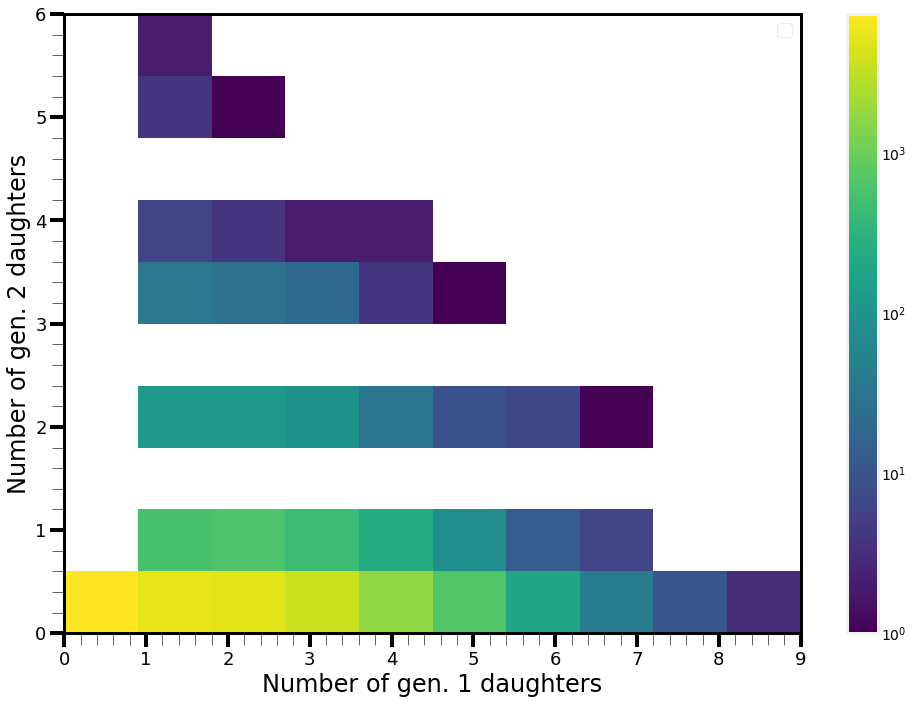

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


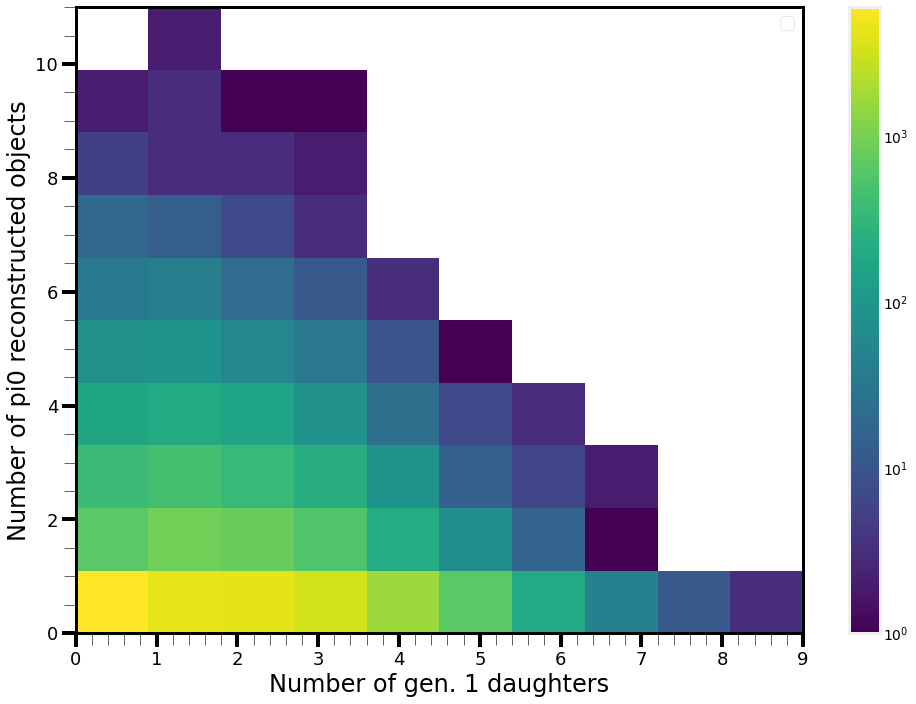

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


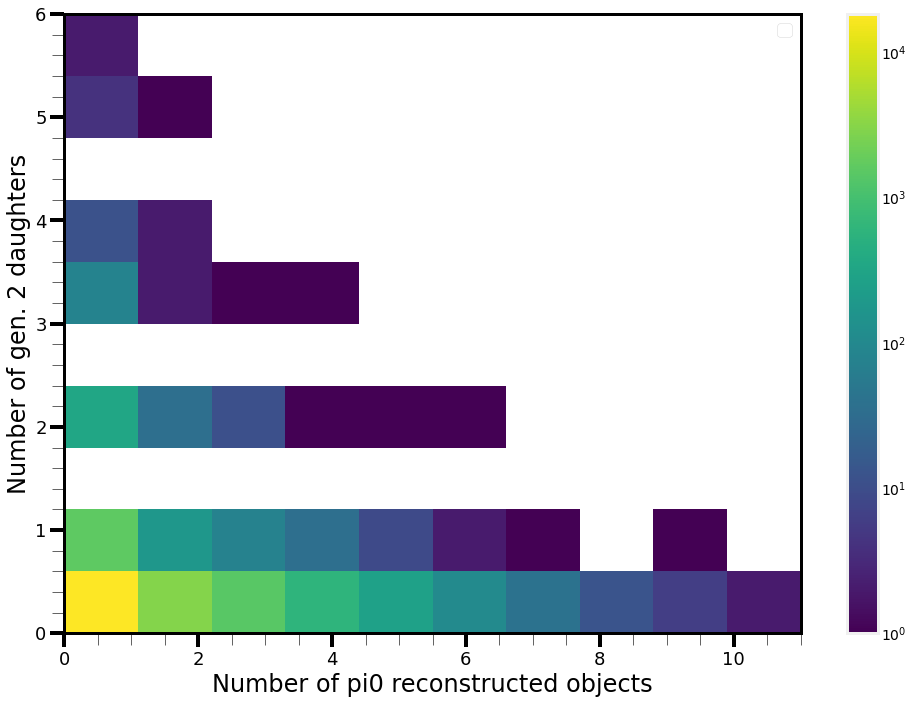

In [14]:
plt_conf.setup_figure()
print(np.max(true_gen2_counts))
h = plt.hist2d(true_gen1_counts, true_gen2_counts, max(np.max(true_gen2_counts), np.max(true_gen1_counts))+1, norm="log")
plt.colorbar(h[-1])
plt_conf.format_axis(xlabel="Number of gen. 1 daughters", ylabel="Number of gen. 2 daughters")
plt_conf.end_plot()

plt_conf.setup_figure()
h = plt.hist2d(true_gen1_counts, cnts2, max(np.max(true_gen2_counts), np.max(true_gen1_counts))+1, norm="log")
plt.colorbar(h[-1])
plt_conf.format_axis(xlabel="Number of gen. 1 daughters", ylabel="Number of pi0 reconstructed objects")
plt_conf.end_plot()

plt_conf.setup_figure()
h = plt.hist2d(cnts2, true_gen2_counts, max(np.max(true_gen2_counts), np.max(true_gen1_counts))+1, norm="log")
plt.colorbar(h[-1])
plt_conf.format_axis(xlabel="Number of pi0 reconstructed objects", ylabel="Number of gen. 2 daughters")
plt_conf.end_plot()

In [13]:
print(len(true_gen1_counts))
print(len(cnts))
print(len(cnts2))

26165
15685
26165


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), array([2928, 7157, 4039, 1147,  285,   97,   21,    7,    3,    1]))
(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 11]), array([15847,  4515,  3211,  1510,   639,   270,   110,    41,    13,
           7,     2]))


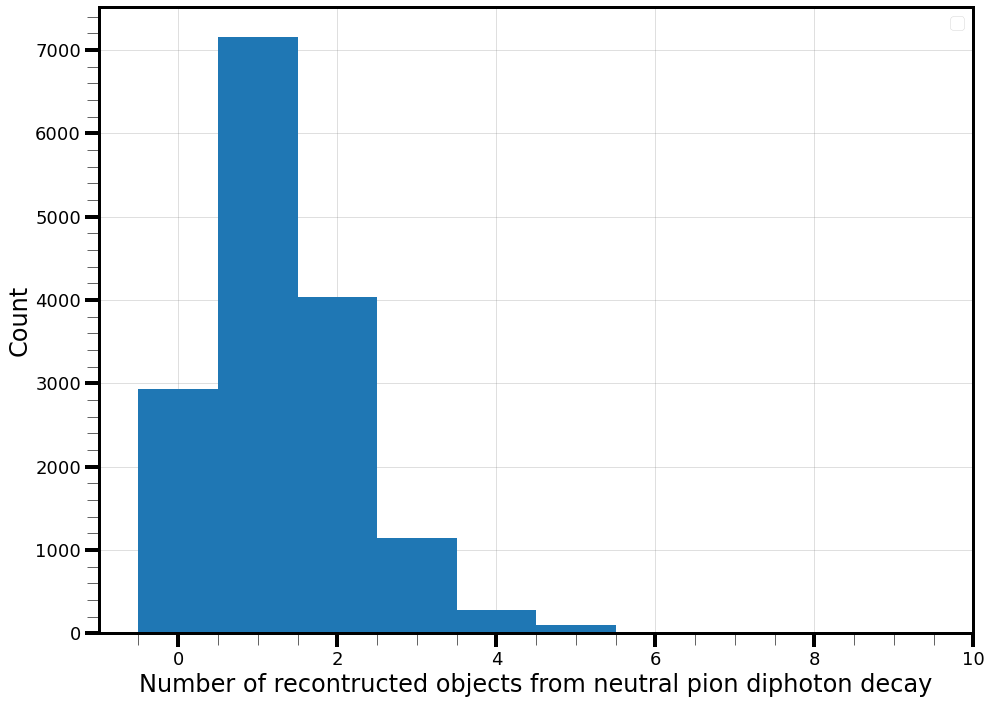

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


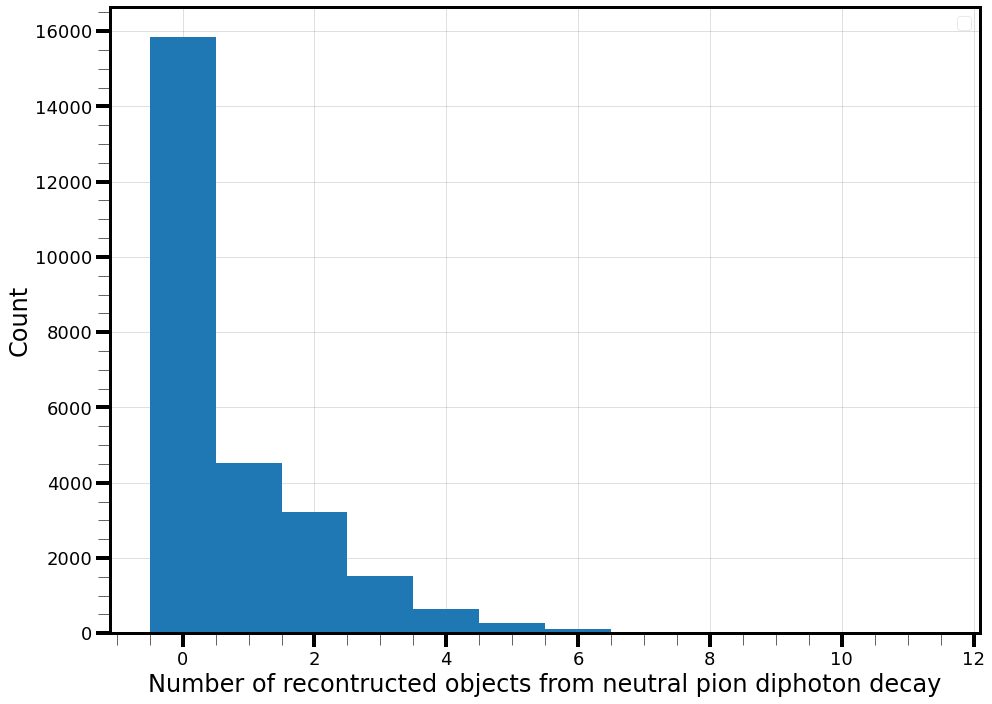

In [10]:
def get_counts(events):
    def get_two_count_pi0s(pi0s):
        pions, counts = np.unique(pi0s, return_counts=True)
        return pions[counts == 2]
    
    beam_pi0s = np.logical_and(
        events.trueParticles.mother == 1,
        events.trueParticles.pdg == 111)
    pi0_numbers = events.trueParticles.number[beam_pi0s]

    pi0_daughters = PFOSelection.get_mother_pdgs(events) == 111
    pi0_photon_mothers = events.trueParticles.mother[np.logical_and(
        events.trueParticles.pdg == 22,
        pi0_daughters)]

    reco_photon_mothers = events.trueParticlesBT.mother[events.trueParticlesBT.pdg == 22]

    def get_counts(zipped):
        return [sum(zipped['photon'] == pi) for pi in np.intersect1d(
            zipped['pi0'],
            get_two_count_pi0s(zipped['diphoton']))]

    return ak.Array(map(
        get_counts,
        ak.zip(
            {"pi0": pi0_numbers, "diphoton": pi0_photon_mothers, "photon": reco_photon_mothers},
            depth_limit=1)))

def get_counts_alt(events):
    def get_two_count_pi0s(pi0s):
        pions, counts = np.unique(pi0s, return_counts=True)
        return pions[counts == 2]
    
    beam_pi0s = np.logical_and(
        events.trueParticles.mother == 1,
        events.trueParticles.pdg == 111)
    pi0_numbers = events.trueParticles.number[beam_pi0s]

    pi0_daughters = PFOSelection.get_mother_pdgs(events) == 111
    pi0_photon_mothers = events.trueParticles.mother[np.logical_and(
        events.trueParticles.pdg == 22,
        pi0_daughters)]

    reco_photon_mothers = events.trueParticlesBT.mother[events.trueParticlesBT.pdg == 22]

    def get_counts(zipped):
        return 0 + sum([sum(zipped['photon'] == pi) for pi in np.intersect1d(
            zipped['pi0'],
            get_two_count_pi0s(zipped['diphoton']))])

    return ak.Array(map(
        get_counts,
        ak.zip(
            {"pi0": pi0_numbers, "diphoton": pi0_photon_mothers, "photon": reco_photon_mothers},
            depth_limit=1)))

cnts = ak.ravel(get_counts(evts))
cnts2 = ak.ravel(get_counts_alt(evts))
print(np.unique(cnts, return_counts=True))
print(np.unique(cnts2, return_counts=True))
plt_conf.setup_figure()
plt.hist(cnts, **plt_conf.gen_kwargs(type="hist", histtype="bar", index=0, bins=max(cnts)+1, range=(-0.5, max(cnts)+0.5)))
plt_conf.format_axis(xlabel="Number of recontructed objects from neutral pion diphoton decay", ylabel="Count")
plt_conf.end_plot()
plt_conf.setup_figure()
plt.hist(cnts2, **plt_conf.gen_kwargs(type="hist", histtype="bar", index=0, bins=max(cnts2)+1, range=(-0.5, max(cnts2)+0.5)))
plt_conf.format_axis(xlabel="Number of recontructed objects from neutral pion diphoton decay", ylabel="Count")
plt_conf.end_plot()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


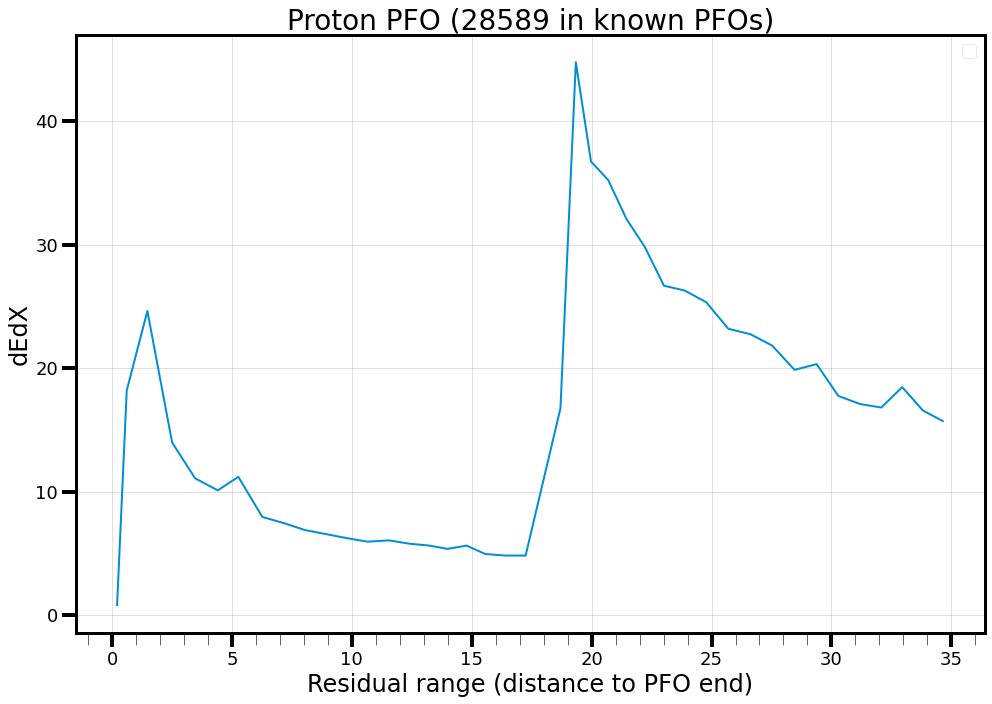

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


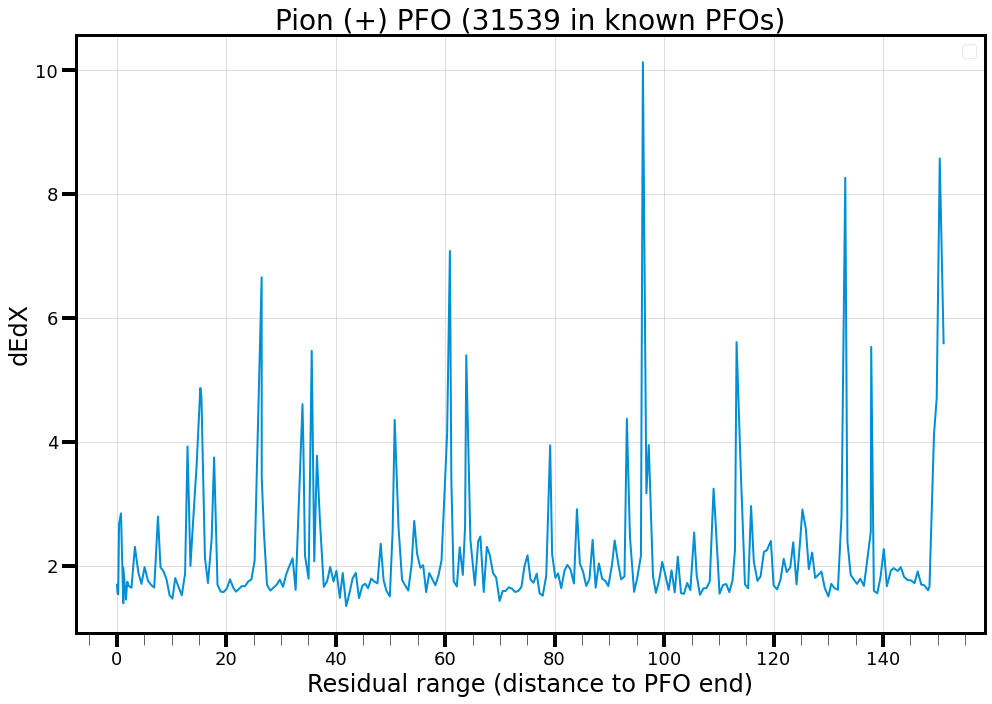

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


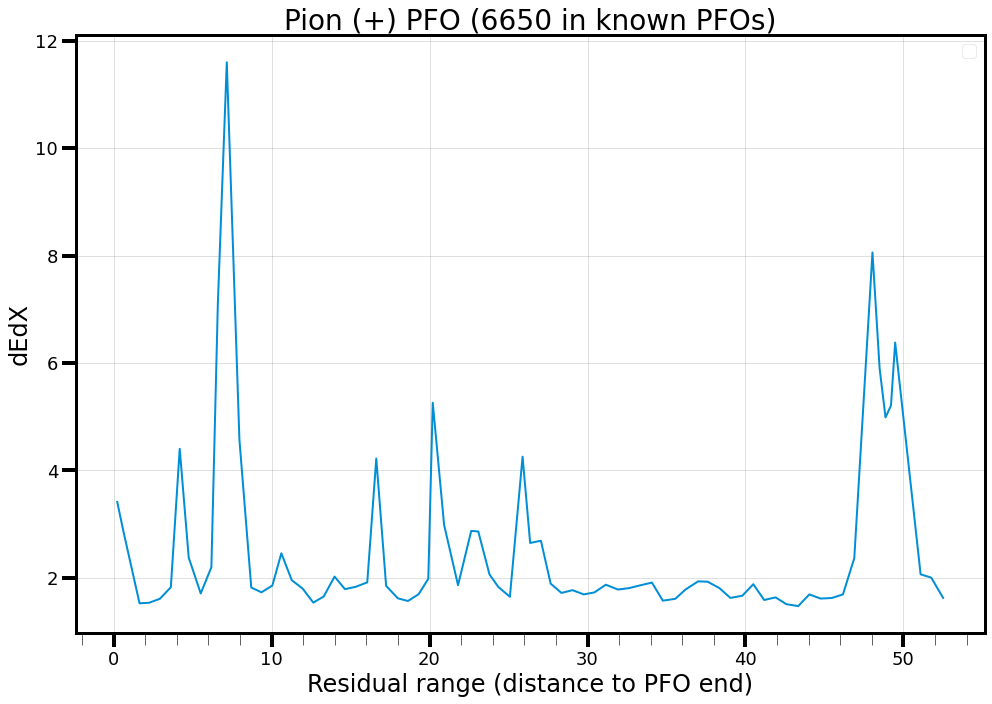

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


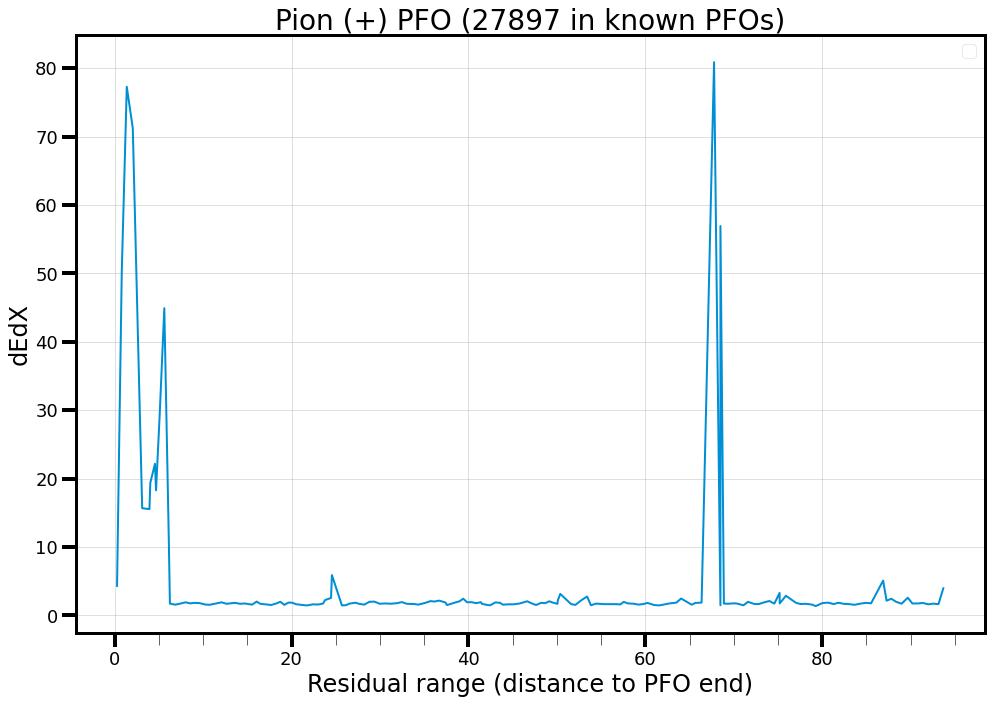

In [32]:
for _ in range(4):
    ind = np.random.randint(0, known_n_pfos)
    plt_conf.setup_figure(title=f"{pfo_type[known_pfo_catalogue[ind]]} PFO ({ind} in known PFOs)")
    plt.plot(known_flat_res[ind], known_flat_dedx[ind], **plt_conf.gen_kwargs())
    plt_conf.format_axis(xlabel = "Residual range (distance to PFO end)", ylabel="dEdX", ylog=False)
    plt_conf.end_plot()

In [ ]:
for _ in range(100):
    ind = np.random.randint(0, known_n_pfos)
    plt_conf.setup_figure(title=f"{pfo_type[known_pfo_catalogue[ind]]} PFO ({ind} in known PFOs)")
    plt.plot(known_flat_res[ind], known_flat_dedx[ind], **plt_conf.gen_kwargs())
    plt_conf.format_axis(xlabel = "Residual range (distance to PFO end)", ylabel="dEdX", ylog=False)
    plt_conf.end_plot()

In [12]:
def split_energy(dedx, res, split=0.1, abs_split=None):
    if abs_split is None:
        length = res[-1]
        end_mask = res <= split*length
    else:
        end_mask = res <= abs_split
    end_e = np.sum(dedx[end_mask])
    start_e = np.sum(dedx[np.logical_not(end_mask)])
    return [end_e, start_e]

def variation(f, x):
    if len(f) < 3:
        return -999.
    dxs = x[1:] - x[:-1]
    dfdx = (f[1:] - f[:-1])/dxs
    d2fdx2 = (dfdx[1:] - dfdx[:-1])/dxs[1:]
    return np.var(d2fdx2)

def deposited_charge(dedx, *args):
    return np.sum(dedx)


In [10]:
def split_energy_full(dedx, res, split=0.1, abs_split=None):
    if abs_split is None:
        abs_split = split*ak.max(res, axis=-1)#[...,-1]
    end_mask = res <= abs_split
    end_e = ak.sum(dedx[end_mask], axis=-1)
    start_e = ak.sum(dedx[np.logical_not(end_mask)], axis=-1)
    return [end_e, start_e]

def get_split_reco_energies(events: Master.Data, split=0.1, abs_split=None):
    if abs_split is None:
        abs_split = split*events.recoParticles.track_len
    end_mask = events.recoParticles.residual_range <= abs_split
    end_e = ak.sum(events.recoParticles.track_dEdX[end_mask], axis=-1)
    start_e = ak.sum(events.recoParticles.track_dEdX[np.logical_not(end_mask)], axis=-1)
    return [end_e, start_e]

def variation_full(f, x):
    # if len(f) < 3:
    #     return -999.
    dxs = x[...,1:] - x[...,:-1]
    good_dxs = dxs != 0.
    dxs = dxs[good_dxs]
    dfdx = (f[...,1:] - f[...,:-1])[good_dxs]/dxs
    d2fdx2 = (dfdx[...,1:] - dfdx[...,:-1])/dxs[...,1:]
    return ak.fill_none(ak.var(d2fdx2, axis=-1), 0., axis=-1)

def get_dedx_variation(events):
    return variation_full(events.recoParticles.track_dEdX, events.recoParticles.residual_range)

def get_deposited_charge_full(events):
    return np.sum(events.recoParticles.track_dEdX, axis=-1)

In [30]:
class BDTPropertyGenerator():
    def _gen_prop_defs(self):
        self.prop_defs = {
            "track": self.get_property("track_score"),
            "nhits": self.get_property("n_hits"),
            "dEdx_med": self.get_dEdX_med(),
            "dEdx_sum": self.get_dEdX_sum(),
            "dEdx_var": self.get_dEdX_var(),
            "dEdx_end25%": self.get_dEdX_end(end_frac=0.25),
            "dEdx_start75%": self.get_dEdX_start(end_frac=0.25),
            "dEdx_start10%": self.get_dEdX_start(end_frac=0.9),
            "chi2_pion_reduced": self.get_reduced_chi2("pion"),
            "chi2_muon_reduced": self.get_reduced_chi2("muon"),
            "chi2_proton_reduced": self.get_reduced_chi2("proton"),
            "length": self.get_property("track_len")}
        return

    def _gen_truth_defs(self):
        self.prop_defs = {
            "pion": self.select_pdgs([211, -211]),
            "photon": self.select_pdgs([22]),
            "proton": self.select_pdgs([2212]),
            "muon": self.select_pdgs([13, -13]),
            "electron": self.select_pdgs([11, -11])}
        return
    
    def __init__(self, which_props, which_truth):
        self._gen_prop_defs()
        self.prop_defs = {prop: self.prop_defs[prop] for prop in which_props}
        return
    
    def select_pdgs(self, pdgs):
        if not isinstance(pdgs):
            pdgs = [pdgs]
        def calc(events):
            pdg_vals = evts.trueParticlesBT.pdg
            mask = pdg_vals == pdgs[0]
            for pdg in pdgs[1:]:
                mask = np.logical_or(mask, pdg_vals == pdg)
            return mask
        return calc
    
    def get_property(self, name):
        def get_prop(events):
            return getattr(events.recoParticles, name)
        return get_prop

    def get_dEdX_end(self, end_frac=0.1, abs_split=None):
        def calc(events):
            if abs_split is None:
                abs_split = end_frac*events.recoParticles.track_len
            end_mask = events.recoParticles.residual_range <= abs_split
            return ak.sum(events.recoParticles.track_dEdX[end_mask], axis=-1)
        return calc
    
    def get_dEdX_start(self, end_frac=0.1, abs_split=None):
        def calc(events):
            if abs_split is None:
                abs_split = end_frac*events.recoParticles.track_len
            start_mask = events.recoParticles.residual_range > abs_split
            return ak.sum(events.recoParticles.track_dEdX[start_mask], axis=-1)
        return calc

    def get_reduced_chi2(self, particle):
        available_parts = ["pion", "muon", "proton"]
        if particle not in available_parts:
            raise ValueError(f"{particle} must be in the available particles: {available_parts}")
        def calc(events):
            chi2_score = getattr(events.recoParticles, f"track_chi2_{particle}")
            chi2_ndof = getattr(events.recoParticles, f"track_chi2_{particle}_ndof")
            return chi2_score/chi2_ndof
        return calc

    def get_dEdX_med(self):
        def calc(events):
            return PFOSelection.Median(evts.recoParticles.track_dEdX)
        return calc

    def get_dEdX_sum(self):
        def calc(events):
            return np.sum(events.recoParticles.track_dEdX, axis=-1)
        return calc

    def get_dEdX_var(self):
        def calc(events):
            x = events.recoParticles.residual_range
            e = events.recoParticles.track_dEdX
            dxs = x[...,1:] - x[...,:-1]
            good_dxs = dxs != 0.
            dxs = dxs[good_dxs]
            dEdx = (e[...,1:] - e[...,:-1])[good_dxs]/dxs
            d2Edx2 = (dEdx[...,1:] - dEdx[...,:-1])/dxs[...,1:]
            return ak.fill_none(ak.var(d2Edx2, axis=-1), 0., axis=-1)
        return calc

    def gen_features(self, events):
        for i, func in enumerate(self.prop_defs.values()):
            val = func(events)
            if i == 0:
                features = np.zeros((ak.count(val), len(d)))
            value = ak.ravel(val)
            features[:, i] = value
        self.features = features
        return features
    
    
    

In [24]:
# props_for_bdt = {
#     "track": evts.recoParticles.track_score,
#     "nhits": evts.recoParticles.n_hits,
#     "dEdx": PFOSelection.Median(evts.recoParticles.track_dEdX),
#     "chi2_pion": evts.recoParticles.track_chi2_pion,
#     # "chi2_pion_reduced": evts.recoParticles.track_chi2_pion/evts.recoParticles.track_chi2_pion_ndof,
#     # "chi2_pion_dof": evts.recoParticles.track_chi2_pion_ndof,
#     "chi2_dof": evts.recoParticles.track_chi2_pion_ndof,
#     "chi2_muon": evts.recoParticles.track_chi2_muon,
#     # "chi2_muon_reduced": evts.recoParticles.track_chi2_muon/evts.recoParticles.track_chi2_muon_ndof,
#     # "chi2_muon_dof": evts.recoParticles.track_chi2_muon_ndof,
#     "chi2_proton": evts.recoParticles.track_chi2_proton,
#     # "chi2_proton_reduced": evts.recoParticles.track_chi2_proton/evts.recoParticles.track_chi2_proton_ndof,
#     # "chi2_proton_dof": evts.recoParticles.track_chi2_proton_ndof,
#     "length": evts.recoParticles.track_len}
end_e, start_e = get_split_reco_energies(evts, split=0.25)
_, start_10_e = get_split_reco_energies(evts, split=0.9)
props_for_bdt_reduced = {
    "track": evts.recoParticles.track_score,
    "nhits": evts.recoParticles.n_hits,
    "dEdx_med": PFOSelection.Median(evts.recoParticles.track_dEdX),
    "dEdx_sum": get_deposited_charge_full(evts),
    "dEdx_var": get_dedx_variation(evts),
    "dEdx_end25%":end_e,
    "dEdx_start75%":start_e,
    "dEdx_start10%":start_10_e,
    # "chi2_pion": evts.recoParticles.track_chi2_pion,
    "chi2_pion_reduced": evts.recoParticles.track_chi2_pion/evts.recoParticles.track_chi2_pion_ndof,
    # "chi2_pion_dof": evts.recoParticles.track_chi2_pion_ndof,
    # "chi2_dof": evts.recoParticles.track_chi2_pion_ndof,
    # "chi2_muon": evts.recoParticles.track_chi2_muon,
    "chi2_muon_reduced": evts.recoParticles.track_chi2_muon/evts.recoParticles.track_chi2_muon_ndof,
    # "chi2_muon_dof": evts.recoParticles.track_chi2_muon_ndof,
    # "chi2_proton": evts.recoParticles.track_chi2_proton,
    "chi2_proton_reduced": evts.recoParticles.track_chi2_proton/evts.recoParticles.track_chi2_proton_ndof,
    # "chi2_proton_dof": evts.recoParticles.track_chi2_proton_ndof,
    "length": evts.recoParticles.track_len}
# old_props_for_bdt = {
#     "track": evts.recoParticles.track_score,
#     "nhits": evts.recoParticles.n_hits,
#     "dEdx": PFOSelection.Median(evts.recoParticles.track_dEdX),
#     "chi2_pion": evts.recoParticles.track_chi2_pion,
#     "chi2_pion_dof": evts.recoParticles.track_chi2_pion_ndof,
#     # "chi2_dof": evts.recoParticles.track_chi2_pion_ndof,
#     "chi2_muon": evts.recoParticles.track_chi2_muon,
#     "chi2_muon_dof": evts.recoParticles.track_chi2_muon_ndof,
#     "chi2_proton": evts.recoParticles.track_chi2_proton,
#     "chi2_proton_dof": evts.recoParticles.track_chi2_proton_ndof,
#     "length": evts.recoParticles.track_len}

# def gen_features_from_dict(d):
#     for i, val in enumerate(d.values()):
#         if i == 0:
#             features = np.zeros((ak.count(val), len(d)))
#         value = ak.ravel(val)
#         features[:, i] = value
#     return features

# def separate_train_test(truth, props_to_use: dict, test_frac=0.2):
#     if not isinstance(truth, ak.Array):
#         flat_truth = np.zeros(ak.count(truth[0]), dtype=int)
#         for i, t_mask in enumerate(truth):
#             flat_truth[ak.ravel(t_mask)] = i+1
#     else:
#         flat_truth = ak.ravel(truth)
#     n_tot = len(flat_truth)
#     num_train = int(len(flat_truth) *(1-test_frac))
#     print(f"{n_tot} data points found, separated into {num_train} "
#           + f"training points and {n_tot - num_train} test_points.")
#     train_classes = ak.values_astype(flat_truth[:num_train], int)
#     test_truth = flat_truth[num_train:]
#     train_data = np.zeros((num_train, len(props_to_use)))
#     test_props = {}
#     for i, item in enumerate(props_to_use.items()):
#         val = ak.ravel(item[1])
#         train_data[:, i] = val[:num_train]
#         test_props[item[0]] = val[num_train:]
#     return train_classes, train_data, test_truth, test_props

# def wrap_bdt_args(bdt_fit_func, selector: seval.SelectorEvaluator):
#     props_dict = selector.properties
#     ind_dict = {}
#     for i, key in enumerate(props_dict.keys()):
#         if i == 0:
#             num_pfos = len(ak.ravel(props_dict[key]))
#         ind_dict[key] = i
#     num_props = len(props_dict)
#     def func(use_props):
#         bdt_arg = np.zeros((num_pfos, num_props))
#         for key, val in use_props.items():
#             if val is not None:
#                 bdt_arg[:, ind_dict[key]] = ak.ravel(val)
#         return bdt_fit_func(bdt_arg)
#     return func

# def bdt_probs(bdt_obj):
#     def func(data):
#         return bdt_obj.predict_proba(data)[:,1]
#     return func

# def convert_dict_to_array(props_dict):
#     for i, val in enumerate(props_dict.values()):
#         if i == 0:
#             res = np.zeros((len(ak.ravel(val)), len(props_dict)))
#         res[:, i] = ak.ravel(val)
#     return res

# old_train_class, old_train_data, old_test_truth, old_test_props = separate_train_test(piplus_truth, old_props_for_bdt)
# train_class, train_data, test_truth, test_props = separate_train_test(piplus_truth, props_for_bdt)
# train_class_reduced, train_data_reduced, test_truth_reduced, test_props_reduced = separate_train_test(piplus_truth, props_for_bdt_reduced)
# train_class_multi, train_data_multi, test_truth_multi, test_props_multi = separate_train_test(
#     (proton_truth, any_mu_truth, photon_truth, pi_truth), props_for_bdt_reduced)
train_class_multi, train_data_multi, test_truth_multi, test_props_multi = separate_train_test(
    (pi_truth, proton_truth, photon_truth), props_for_bdt_reduced)
test_truth_multi = test_truth_multi == 1

119568 data points found, separated into 95654 training points and 23914 test_points.


In [62]:
ak.sum(ak.values_astype(gen1_daughter_truth, int))

43021

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


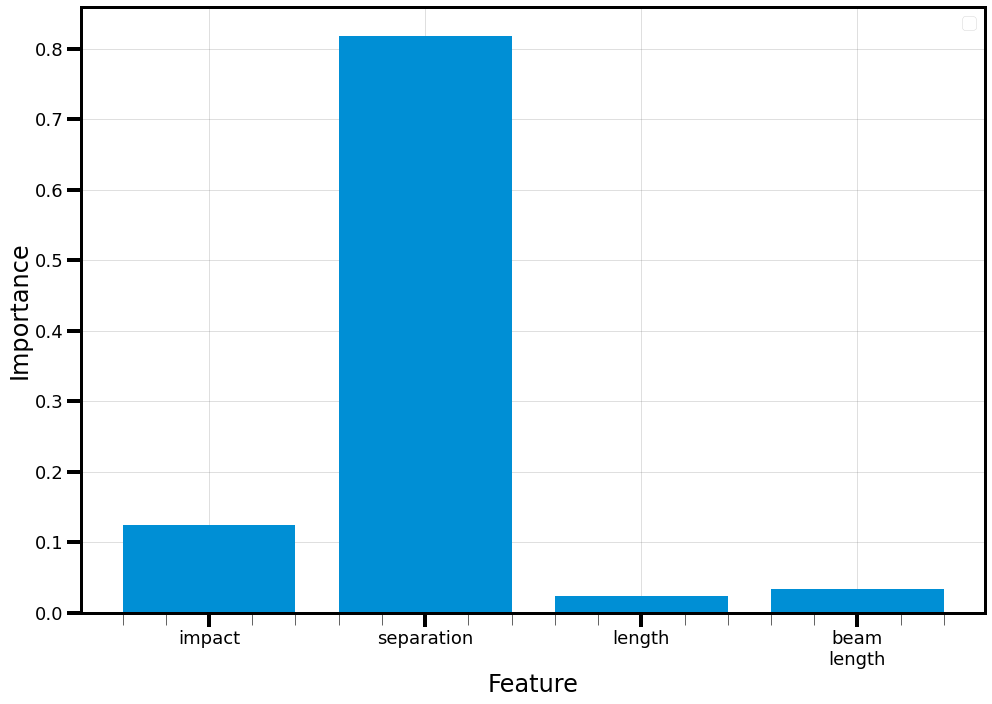

In [68]:
plt_conf.setup_figure()
plt.bar([lab.replace('_', '\n') for lab in test_props_geom.keys()], bdt_geom.feature_importances_)
plt_conf.format_axis(ylog=False, xlabel="Feature", ylabel="Importance")
plt_conf.end_plot()

In [ ]:
bdt_geom_eval.make_property_correlations("beam_length", style="log")
bdt_geom_eval.make_property_correlations("separation", style="quartile_log")

In [14]:
print(f'pion chi^2 == -999.: {np.sum(props_for_bdt["chi2_pion"] == -999.)}')
print(f'pion chi^2 == 9999.: {np.sum(props_for_bdt["chi2_pion"] == 9999.)}')
print(f'pion chi^2 > 9999.: {np.sum(props_for_bdt["chi2_pion"] > 9999.)}')
print()
print(f'muon chi^2 == -999.: {np.sum(props_for_bdt["chi2_muon"] == -999.)}')
print(f'muon chi^2 == 9999.: {np.sum(props_for_bdt["chi2_muon"] == 9999.)}')
print(f'muon chi^2 > 9999.: {np.sum(props_for_bdt["chi2_muon"] > 9999.)}')
print()
print(f'proton chi^2 == -999.: {np.sum(props_for_bdt["chi2_proton"] == -999.)}')
print(f'proton chi^2 == 9999.: {np.sum(props_for_bdt["chi2_proton"] == 9999.)}')
print(f'proton chi^2 > 9999.: {np.sum(props_for_bdt["chi2_proton"] > 9999.)}')

pion chi^2 == -999.: 364
pion chi^2 == 9999.: 4342
pion chi^2 > 9999.: 1

muon chi^2 == -999.: 364
muon chi^2 == 9999.: 4342
muon chi^2 > 9999.: 0

proton chi^2 == -999.: 364
proton chi^2 == 9999.: 4342
proton chi^2 > 9999.: 8172


In [75]:
print(np.sum(test_props["track"] < 0.5))
print(np.min(test_props["track"]))

9444
6.956794550205814e-06


In [71]:
print(np.min(evts.recoParticles.track_score))
print(np.sum(evts.recoParticles.track_score < 0.5))
print(np.sum(evts.recoParticles.track_score > 0.5))
print(len(ak.ravel(evts.recoParticles.track_score)))

6.263268048645187e-08
47244
72680
119924


In [10]:
bdt1 = ensemble.GradientBoostingClassifier()
bdt1.fit(train_data, train_class)

In [11]:
bdt1.score(convert_dict_to_array(test_props), ak.values_astype(test_truth, int))

0.8854700854700854

In [12]:
bdt1.predict_proba(convert_dict_to_array(test_props))

array([[0.60141834, 0.39858166],
       [0.55928289, 0.44071711],
       [0.98960535, 0.01039465],
       ...,
       [0.98520768, 0.01479232],
       [0.93395991, 0.06604009],
       [0.93292404, 0.06707596]])

In [13]:
bdt_probs(bdt1)(convert_dict_to_array(test_props))

array([0.39858166, 0.44071711, 0.01039465, ..., 0.01479232, 0.06604009,
       0.06707596])

In [37]:
from importlib import reload
reload(seval)

<module 'python.analysis.SelectionEvaluation' from '/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/SelectionEvaluation.py'>

In [26]:
bdt_reduced = ensemble.GradientBoostingClassifier()
bdt_reduced.fit(train_data_reduced, train_class_reduced)

GradientBoostingClassifier()

In [ ]:
bdt_reduced_eval = seval.SelectorEvaluator(test_truth_reduced, test_props_reduced)
bdt_reduced_eval.add_metric("bdt_reduced_0.3", wrap_bdt_args(bdt_probs(bdt_reduced), bdt_reduced_eval), threshold=0.3)
bdt_reduced_eval.make_metric_summary("bdt_reduced_0.3")

In [ ]:
bdt_reduced_eval.make_metric_summary("bdt_reduced_0.3", style="quartile_rejected")

In [ ]:
bdt_reduced_eval.make_property_correlations("chi2_pion_reduced", style="quartile_log")
bdt_reduced_eval.make_property_correlations("nhits", style="quartile_log")

In [25]:
bdt_classify = ensemble.GradientBoostingClassifier()
bdt_classify.fit(train_data_multi, train_class_multi)

GradientBoostingClassifier()

In [26]:
test_props_format = gen_features_from_dict(test_props_multi)

In [27]:
print(np.unique(bdt_classify.predict(test_props_format), return_counts=True))
print(np.unique(bdt_classify.predict(test_props_format)[test_truth_multi], return_counts=True))

(array([0, 1, 2, 3]), array([ 914, 7385, 7628, 7987]))
(array([0, 1, 2, 3]), array([ 184, 5097,  815,  944]))


In [50]:
bdt_classify.predict_proba(gen_features_from_dict(test_props_multi)).shape

(23914, 5)

In [34]:
bdt_classify.predict_proba(test_props_format)[test_truth_multi, :]

array([[4.33425049e-01, 2.15604597e-02, 2.65387460e-03, 5.42360617e-01],
       [2.58320749e-01, 4.26414334e-02, 1.33493716e-03, 6.97702880e-01],
       [3.76718600e-01, 2.42776568e-02, 1.97876293e-03, 5.97024980e-01],
       ...,
       [3.28673837e-01, 2.47944977e-02, 1.78874778e-03, 6.44742917e-01],
       [9.70631826e-01, 8.60435616e-03, 1.54443464e-04, 2.06093739e-02],
       [5.25906836e-01, 1.57165079e-01, 4.73322215e-04, 3.16454763e-01]])

In [23]:
np.unique(bdt_classify.predict(test_props_format), return_counts=True)

(array([0, 1, 2, 3]), array([19125,  3191,    14,  1655]))

In [26]:
np.unique(bdt_classify.predict(test_props_format)[test_truth_multi], return_counts=True)

(array([0, 1, 3]), array([2256, 1952,   99]))

In [25]:
bdt_classify.predict_proba(test_props_format)[test_truth_multi, :]

array([[4.33425049e-01, 5.42360617e-01, 2.65387460e-03, 2.15604597e-02],
       [2.58320749e-01, 6.97702880e-01, 1.33493716e-03, 4.26414334e-02],
       [3.76718600e-01, 5.97024980e-01, 1.97876293e-03, 2.42776568e-02],
       ...,
       [3.28673837e-01, 6.44742917e-01, 1.78874778e-03, 2.47944977e-02],
       [9.70631826e-01, 2.06093739e-02, 1.54443464e-04, 8.60435616e-03],
       [5.25906836e-01, 3.16454763e-01, 4.73322215e-04, 1.57165079e-01]])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


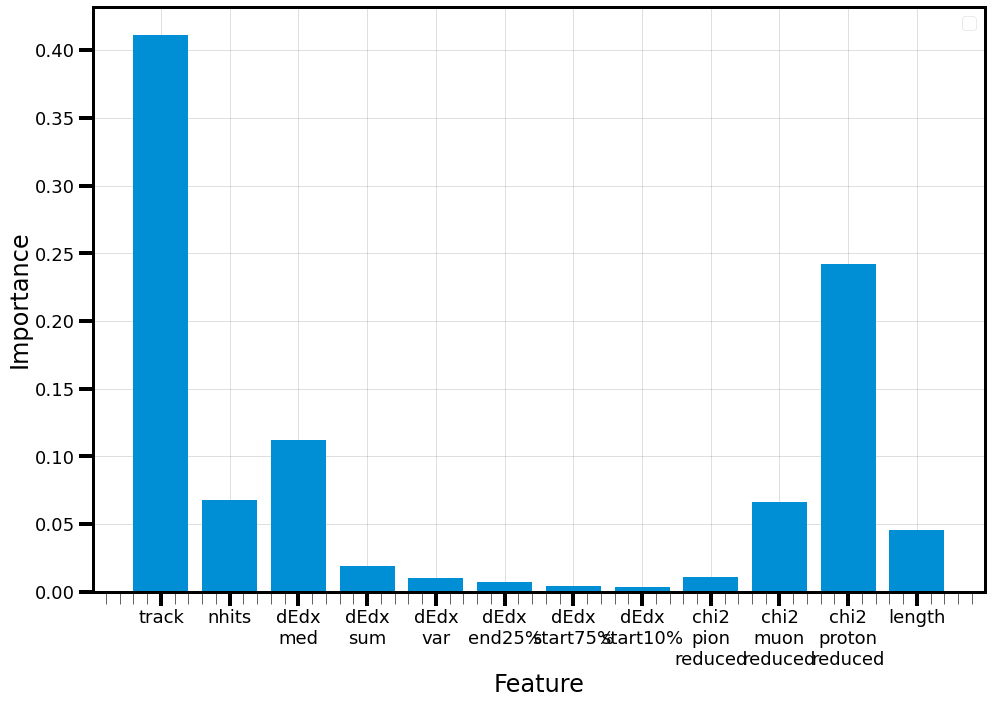

In [28]:
plt_conf.setup_figure()
plt.bar([lab.replace('_', '\n') for lab in test_props_multi.keys()], bdt_classify.feature_importances_)
plt_conf.format_axis(ylog=False, xlabel="Feature", ylabel="Importance")
plt_conf.end_plot()

/software/wx21978/miniconda/envs/pi0-phys-ml/lib/python3.10/site-packages/numpy/lib/histograms.py:883: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
/software/wx21978/miniconda/envs/pi0-phys-ml/lib/python3.10/site-packages/numpy/lib/histograms.py:883: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
/software/wx21978/miniconda/envs/pi0-phys-ml/lib/python3.10/site-packages/numpy/lib/histograms.py:883: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
/software/wx21978/miniconda/envs/pi0-phys-ml/lib/python3.10/site-packages/numpy/lib/histograms.py:883: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
/software/wx21978/miniconda/envs/pi0-phys-ml/lib/python3.10/site-packages/numpy/lib/histograms.py:883: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
/software/wx21978/miniconda/envs/pi0-phys-ml/lib/python3.10/

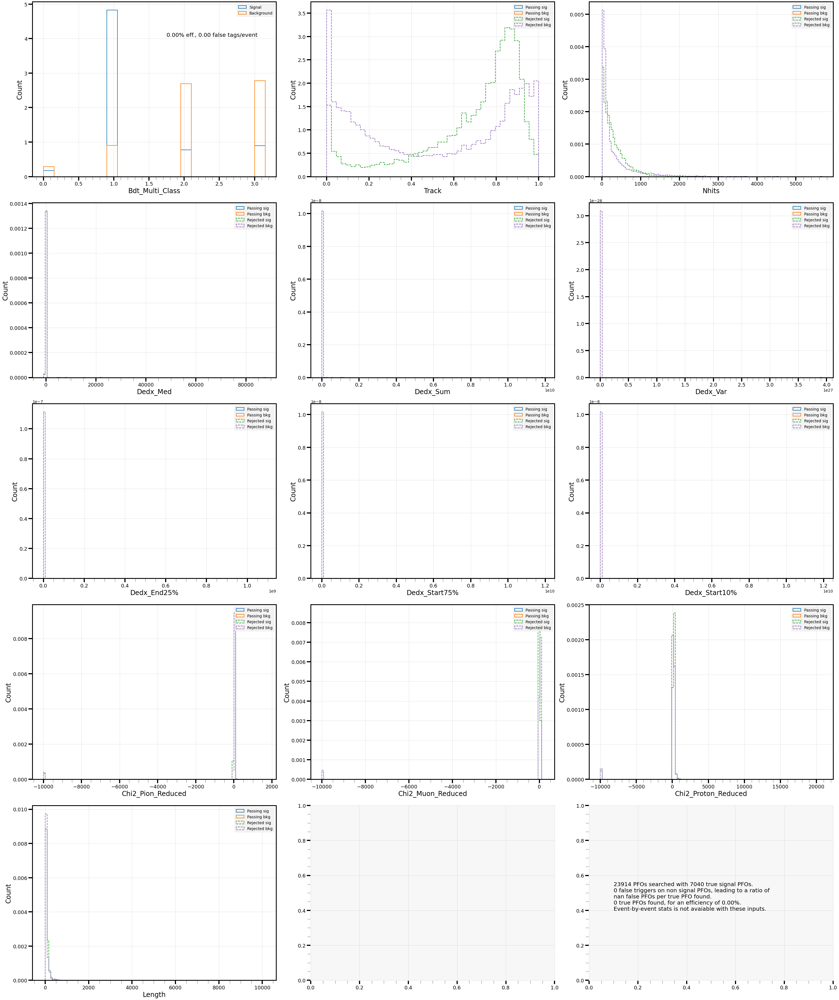

In [29]:
bdt_multi_eval = seval.SelectorEvaluator(test_truth_multi, test_props_multi)
bdt_multi_eval.add_metric("bdt_multi_class", wrap_bdt_args(lambda data: bdt_classify.predict(data), bdt_multi_eval), threshold=3.5)
bdt_multi_eval.make_metric_summary("bdt_multi_class")

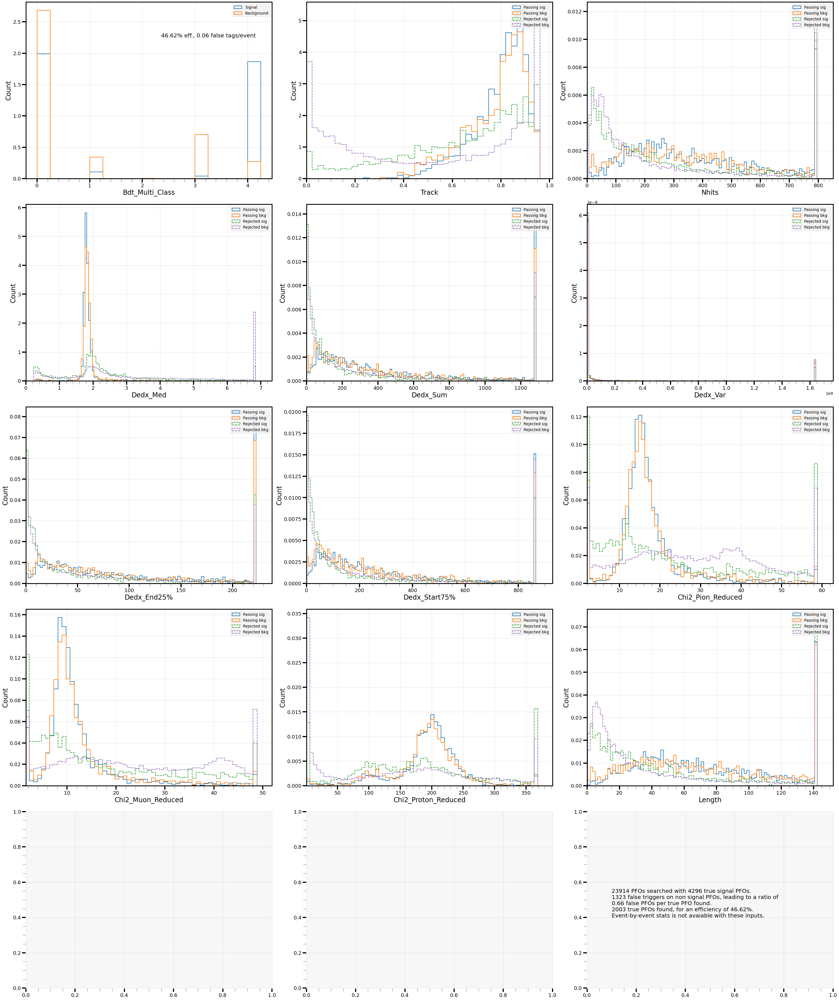

In [32]:
bdt_multi_eval.make_metric_summary("bdt_multi_class", style="quartile_rejected_density")

In [ ]:
bdt_multi_eval.make_property_correlations("track", style="quartile_log")

In [ ]:
bdt_multi_eval.make_property_correlations("dEdx_med", style="quartile_log")

In [ ]:
bdt_multi_eval.make_property_correlations("chi2_proton_reduced", style="quartile_log")

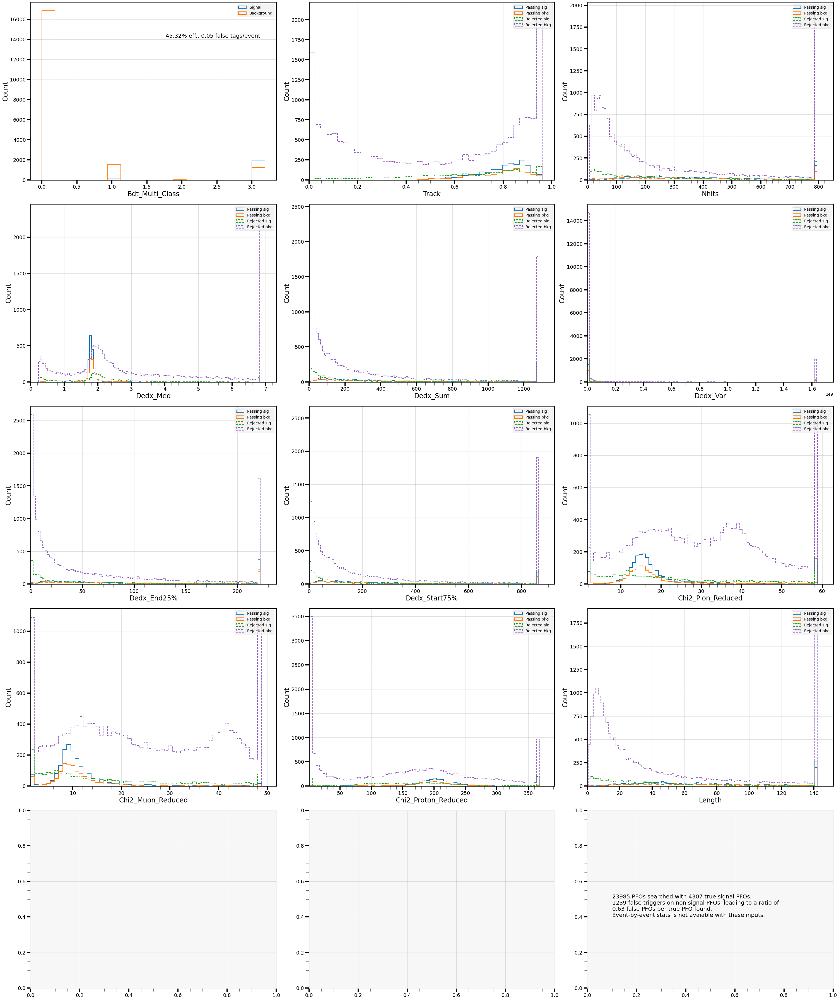

In [41]:
bdt_multi_eval.make_metric_summary("bdt_multi_class", style="quartile_rejected")

In [ ]:
bdt_multi_eval.make_metric_summary("bdt_multi_class", style="quartile_rejected_density")

## Event type selection
Takes the leading PFOs by some combination of previous cuts, and tries to identify the event type

Event types as follows:
- Absorbtion - no pi0s
- Charge Exchange
- Single pion production
- Multi pion production

We choose to take the 4 most shower-like PFOs, and 4 most track like PFOs.
Each PFO can only get assigned to one or the other.
Missing PFOs are assigned parameters based upon what is least realsitic, i.e. Median dEdx -> 0, other physical params to large (inf?).

Variables passed for each PFO:
- Beam like score from beam BDT
- Each of the 4 classifications from classifer BDT
- Track score
- Impact parameter
- Beam separation
- Median dEdx
- Pion reduced chi^2

In [15]:
beam_props = ["length", "alt_length", "beam_impact_params", "beam_separations",
              "beam_start_X", "beam_start_Y", "beam_start_Z", "track",
              "track_start_X", "track_start_Y", "track_start_Z",
              "track_dir_X", "track_dir_Y", "track_dir_Z",
              "track_end_X", "track_end_Y", "track_end_Z",
              "shower_start_X", "shower_start_Y", "shower_start_Z",
              "shower_dir_X", "shower_dir_Y", "shower_dir_Z"]
classify_props = ["track", "nhits",
                  "dEdx_med", "dEdx_sum", "dEdx_var", "dEdx_end25%", "dEdx_start75%",
                  "chi2_pion_reduced", "chi2_muon_reduced", "chi2_proton_reduced", "length"]

event_props = ["beam_score", "proton_score", "muon_score", "photon_score", "pion_score", #"other_score",
               "track", "beam_impact_params", "beam_separations", "dEdx_med", "chi2_pion_reduced"]

all_props = {
    "track": evts.recoParticles.track_score,
    "nhits": evts.recoParticles.n_hits,
    "dEdx_med": PFOSelection.Median(evts.recoParticles.track_dEdX),
    "dEdx_sum": get_deposited_charge_full(evts),
    "dEdx_var": get_dedx_variation(evts),
    "dEdx_end25%":end_e,
    "dEdx_start75%":start_e,
    "chi2_pion_reduced": evts.recoParticles.track_chi2_pion/evts.recoParticles.track_chi2_pion_ndof,
    "chi2_muon_reduced": evts.recoParticles.track_chi2_muon/evts.recoParticles.track_chi2_muon_ndof,
    "chi2_proton_reduced": evts.recoParticles.track_chi2_proton/evts.recoParticles.track_chi2_proton_ndof,
    "length": evts.recoParticles.track_len,
    "alt_length": evts.recoParticles.track_len_alt,
    "beam_impact_params": PFOSelection.find_beam_impact_parameters(evts),
    "beam_separations": PFOSelection.find_beam_separations(evts),
    "beam_start_X":evts.recoParticles.beam_endPos.x*ak.ones_like(evts.recoParticles.track_start_pos.x),
    "beam_start_Y":evts.recoParticles.beam_endPos.y*ak.ones_like(evts.recoParticles.track_start_pos.x),
    "beam_start_Z":evts.recoParticles.beam_endPos.z*ak.ones_like(evts.recoParticles.track_start_pos.x),
    "track_start_X": evts.recoParticles.track_start_pos.x,
    "track_start_Y": evts.recoParticles.track_start_pos.y,
    "track_start_Z": evts.recoParticles.track_start_pos.z,
    "track_dir_X": evts.recoParticles.track_start_dir.x,
    "track_dir_Y": evts.recoParticles.track_start_dir.y,
    "track_dir_Z": evts.recoParticles.track_start_dir.z,
    "track_end_X": evts.recoParticles.track_end_pos.x,
    "track_end_Y": evts.recoParticles.track_end_pos.y,
    "track_end_Z": evts.recoParticles.track_end_pos.z,
    "shower_start_X": evts.recoParticles.shower_start_pos.x,
    "shower_start_Y": evts.recoParticles.shower_start_pos.y,
    "shower_start_Z": evts.recoParticles.shower_start_pos.z,
    "shower_dir_X": evts.recoParticles.shower_direction.x,
    "shower_dir_Y": evts.recoParticles.shower_direction.y,
    "shower_dir_Z": evts.recoParticles.shower_direction.z,
    "beam_score": None,
    "other_score": None,
    "proton_score": None,
    "muon_score": None,
    "photon_score": None,
    "pion_score": None}

all_props["beam_score"] = bdt_geom.predict_proba(gen_features_from_dict(all_props, beam_props))[:, 1]
classify_scores = bdt_classify.predict_proba(gen_features_from_dict(all_props, classify_props))
all_props["other_score"] = classify_scores[:, 0]
all_props["proton_score"] = classify_scores[:, 1]
all_props["muon_score"] = classify_scores[:, 2]
all_props["photon_score"] = classify_scores[:, 3]
all_props["pion_score"] = classify_scores[:, 4]

In [65]:
# ns = evts.recoParticles.number
# pfo_counts = ak.local_index(ns, axis=-1)
# in_evt_counts = ak.count(ns, axis=1)
# unravel_ind = np.concatenate((np.zeros(1, dtype=int), np.cumsum(in_evt_counts)[:-1]), axis=0) + pfo_counts
# scores = ak.Array([
#     [all_props["pion_score"][ev], all_props["photon_score"][ev], all_props["beam_score"][ev]]
#     for ev in unravel_ind])
# pion_scores = scores[:, 0, :]
# photon_scores = scores[:, 1, :]
# beam_scores = scores[:, 2, :]

# pion_selector = ak.values_astype(pion_scores > photon_scores, bool)
# photon_selector = np.logical_not(pion_selector)
# pion_beam_order = ak.argsort(beam_scores[pion_selector], axis=-1)[:, :4]
# photon_beam_order = ak.argsort(beam_scores[photon_selector], axis=-1)[:, :4]
# pion_order = ak.argsort(pion_scores[pion_selector][pion_beam_order], axis=-1)
# photon_order = ak.argsort(photon_scores[photon_selector][photon_beam_order], axis=-1)
pion_inds = unravel_ind[pion_order]
photon_inds = unravel_ind[photon_order]
# pion_inds = ak.pad_none(unravel_ind[pion_order], 4, axis=-1)
# photon_inds = ak.pad_none(unravel_ind[photon_order], 4, axis=-1)


In [16]:
def gen_event_selection_props(events, props, keys_to_use=None, n_pions=4, n_photons=4):
    if keys_to_use is not None:
        props = {key:val for key, val in props.items() if key in keys_to_use}

    ns = events.recoParticles.number
    pfo_counts = ak.local_index(ns, axis=-1)
    in_evt_counts = ak.count(ns, axis=1)
    unravel_ind = np.concatenate((np.zeros(1, dtype=int), np.cumsum(in_evt_counts)[:-1]), axis=0) + pfo_counts

    scores = ak.Array([
        [props["pion_score"][ev], props["photon_score"][ev], props["beam_score"][ev]]
        for ev in unravel_ind])
    pion_scores = scores[:, 0, :]
    photon_scores = scores[:, 1, :]
    beam_scores = scores[:, 2, :]

    pion_selector = pion_scores > photon_scores
    photon_selector = np.logical_not(pion_selector)
    pion_beam_order = ak.argsort(beam_scores[pion_selector], axis=-1)[:, :n_pions]
    photon_beam_order = ak.argsort(beam_scores[photon_selector], axis=-1)[:, :n_photons]
    pion_order = ak.argsort(pion_scores[pion_selector][pion_beam_order], axis=-1)
    photon_order = ak.argsort(photon_scores[photon_selector][photon_beam_order], axis=-1)
    pion_inds = unravel_ind[pion_order]
    photon_inds = unravel_ind[photon_order]
    np_pion_inds = ak.to_numpy(
        ak.fill_none(
            ak.pad_none(pion_inds, n_pions, axis=-1),
            -1))
    np_photon_inds = ak.to_numpy(
        ak.fill_none(
            ak.pad_none(photon_inds, n_photons, axis=-1),
            -1))
    np_inds = np.concatenate((np_pion_inds, np_photon_inds), axis=1)
    np_bad_mask = np_inds == -1
    np_inds[np_bad_mask] = 0

    evt_props = {}
    for key, val in props.items():
        if key in keys_to_use:
            evt_props[key] = ak.to_numpy(ak.ravel(val))[np_inds]
            evt_props[key][np_bad_mask] = np.nan
    # Add in a property which counts the number of pions/photons, but needs extra attention since this is event based, not PFO based
    return evt_props
    
def separate_evt_train_test(truth_classes, props, test_frac=0.2):
    truth = np.zeros(ak.count(truth_classes[0]), dtype=int)
    for i, t_mask in enumerate(truth_classes):
        truth[t_mask] = i
    n_tot = len(truth)
    num_train = int(n_tot * (1-test_frac))
    print(f"{n_tot} data points found, separated into {num_train} "
          + f"training points and {n_tot - num_train} test_points.")
    train_classes = ak.values_astype(truth[:num_train], int)
    test_truth = truth[num_train:]
    train_data = {}
    test_props = {}
    for i, item in enumerate(props.items()):
        key, val = item
        train_data[key] = val[:num_train]
        test_props[key] = val[num_train:]
    train_data = convert_evts_dict_to_array(train_data)
    return train_classes, train_data, test_truth, test_props


def convert_evts_dict_to_array(props_dict):
    for i, val in enumerate(props_dict.values()):
        if i == 0:
            n_particles = val.shape[1]
            res = np.zeros((val.shape[0], n_particles * len(props_dict)))
        res[:, i*n_particles:(i+1)*n_particles] = val
    return res

def wrap_evt_bdt_args(bdt_fit_func, selector: seval.SelectorEvaluator, imputer):
    props_dict = selector.properties
    bdt_props = {key:ak.zeros_like(val) for key, val in props_dict.items()}
    def func(use_props):
        for key, val in use_props.items():
            if val is not None:
                bdt_props[key] = val
        bdt_arg = convert_evts_dict_to_array(bdt_props)
        bdt_arg = imputer.transform(bdt_arg)
        return bdt_fit_func(bdt_arg)
    return func


def parse_bad_count_evts(data, n_params=10):
    """
    Expects the following properties:
    - Results are a vector with shape (3,), corresponding to
      (absorbtion, pion production (> 0 charged pions), charge exchange)
    - `3*n_params` data shape, with the first `n_params` corresponding
      to the mostly charged pion like, the final `2*n_params`
      corresponding to the two most photon like.
    """
    res = np.zeros((data.shape[0], 3))
    n_pion = 1 - np.isnan(data[:, 0])
    n_photon = 2 - np.isnan(data[:, n_params]) - np.isnan(data[:, 2*n_params])
    use_bdt = np.logical_and(n_pion == 1, n_photon == 2)
    auto_absorbtion = np.logical_and(n_pion < 1, n_photon < 2)
    auto_pion_production = np.logical_and(n_pion == 1, n_photon < 2)
    auto_charge_exchange = np.logical_and(n_pion < 1, n_photon == 2)
    res[auto_absorbtion,      0] = 1.
    res[auto_pion_production, 1] = 1.
    res[auto_charge_exchange, 2] = 1.
    return res, use_bdt

def wrap_evt_bdt_args_1_2(bdt_fit_func, selector: seval.SelectorEvaluator, n_params=10):
    props_dict = selector.properties
    bdt_props = {key:ak.zeros_like(val) for key, val in props_dict.items()}
    def func(use_props):
        for key, val in use_props.items():
            if val is not None:
                bdt_props[key] = val
        bdt_arg = convert_evts_dict_to_array(bdt_props)
        bdt_res, good_mask = parse_bad_count_evts(bdt_arg, n_params=n_params)
        bdt_res[good_mask] = bdt_fit_func(bdt_arg[good_mask])
        return bdt_res
    return func


In [70]:
train_class

<Array [1, 1, 3, 2, 2, 3, ... 2, 3, 3, 2, 3, 3] type='20932 * int64'>

In [68]:
np.unique(pion_counts[regions_dict["charge_exchange"]], return_counts=True)

(array([], dtype=int64), array([], dtype=int64))

In [24]:
np.unique(np.logical_and(pi0_counts >= 1, pion_counts == 0), return_counts=True)

(array([False,  True]), array([22580,  3585]))

In [26]:
from importlib import reload
reload(EventSelection)
pi0_counts = EventSelection.count_all_pi0s(evts)

In [18]:
evt_props = gen_event_selection_props(evts, all_props, keys_to_use=event_props, n_pions=4, n_photons=4)
pi0_counts = EventSelection.count_all_pi0s(evts)
pion_counts = EventSelection.count_non_beam_charged_pi(evts)
regions_dict = EventSelection.create_regions_new(pi0_counts, pion_counts)

train_class, train_data, test_class, test_data = separate_evt_train_test((regions_dict["absorption"], regions_dict["single_pion_production"], regions_dict["pion_production"], regions_dict["charge_exchange"]), evt_props)

26165 data points found, separated into 20932 training points and 5233 test_points.


In [19]:
from sklearn.experimental import enable_iterative_imputer
bad_imp = impute.IterativeImputer()
bad_imp.fit(train_data)
train_data_imp = bad_imp.transform(train_data)

/software/wx21978/miniconda/envs/pi0-phys/lib/python3.10/site-packages/sklearn/impute/_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [20]:
bdt_evt = ensemble.GradientBoostingClassifier()
bdt_evt.fit(train_data_imp, train_class)

GradientBoostingClassifier()

In [35]:
res_evt = bdt_evt.predict(bad_imp.transform(convert_evts_dict_to_array(test_data)))

In [23]:
proba_evt = bdt_evt.predict_proba(bad_imp.transform(convert_evts_dict_to_array(test_data)))

<BarContainer object of 80 artists>

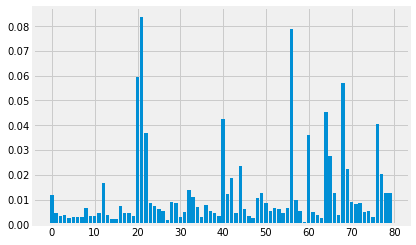

In [21]:
plt.bar(np.arange(80), bdt_evt.feature_importances_)

<BarContainer object of 80 artists>

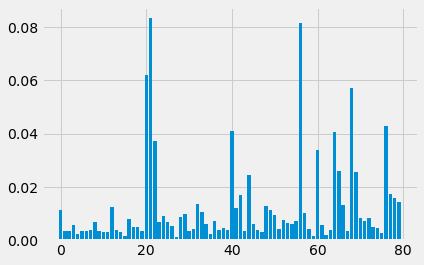

In [38]:
plt.bar(np.arange(80), bdt_evt.feature_importances_)

In [33]:
np.unique(test_class, return_counts=True)

(array([0, 1, 2, 3]), array([ 522, 1640, 2624,  447]))

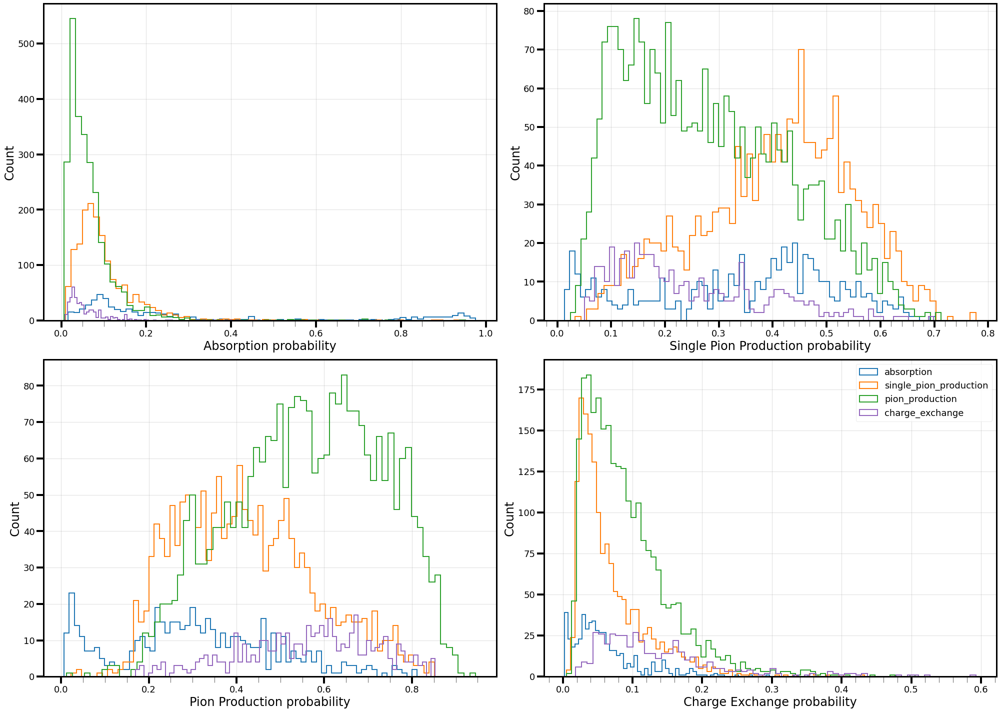

In [24]:
fig, axs = plt_conf.setup_figure(2, 2, figsize = (28, 20))
for j, ax_region in enumerate(["absorption", "single_pion_production", "pion_production", "charge_exchange"]):
    for i, region in enumerate(["absorption", "single_pion_production", "pion_production", "charge_exchange"]):
        axs[j//2, j%2].hist(proba_evt[:, j][test_class == i], **plt_conf.gen_kwargs(type="hist", index=i, label=region, bins=plt_conf.get_bins(proba_evt[:, 3]), density=False))
    plt_conf.format_axis(axs[j//2, j%2], xlabel=f"{ax_region.replace('_', ' ').title()} probability", ylabel="Count", ylog=False)
plt_conf.end_plot()

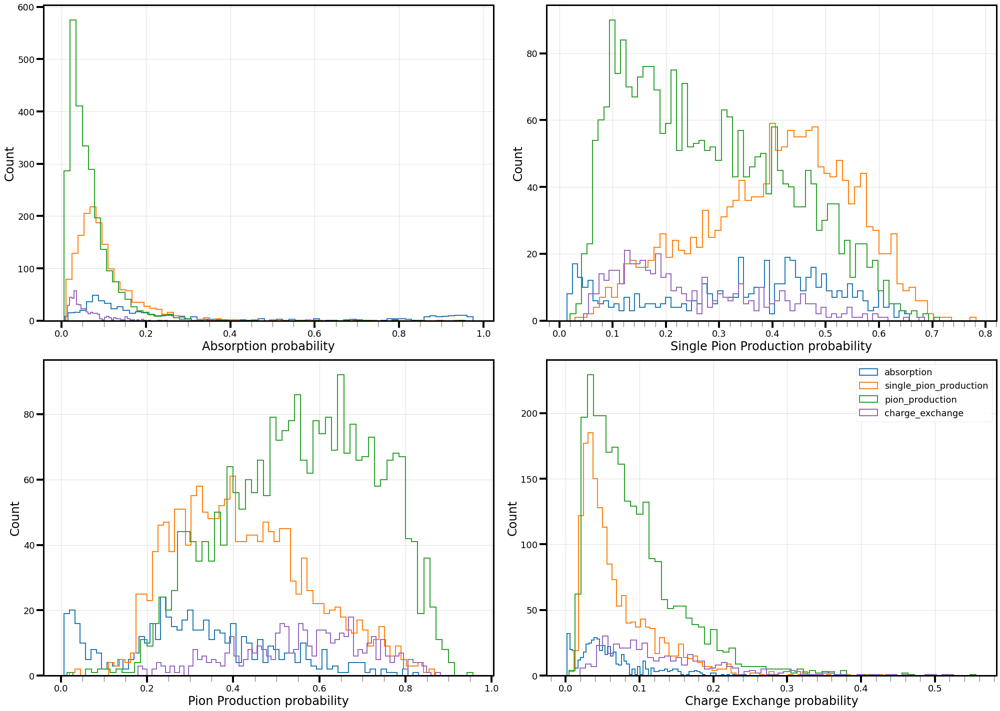

In [50]:
fig, axs = plt_conf.setup_figure(2, 2, figsize = (28, 20))
for j, ax_region in enumerate(["absorption", "single_pion_production", "pion_production", "charge_exchange"]):
    for i, region in enumerate(["absorption", "single_pion_production", "pion_production", "charge_exchange"]):
        axs[j//2, j%2].hist(proba_evt[:, j][test_class == i], **plt_conf.gen_kwargs(type="hist", index=i, label=region, bins=plt_conf.get_bins(proba_evt[:, 3]), density=False))
    plt_conf.format_axis(axs[j//2, j%2], xlabel=f"{ax_region.replace('_', ' ').title()} probability", ylabel="Count", ylog=False)
plt_conf.end_plot()

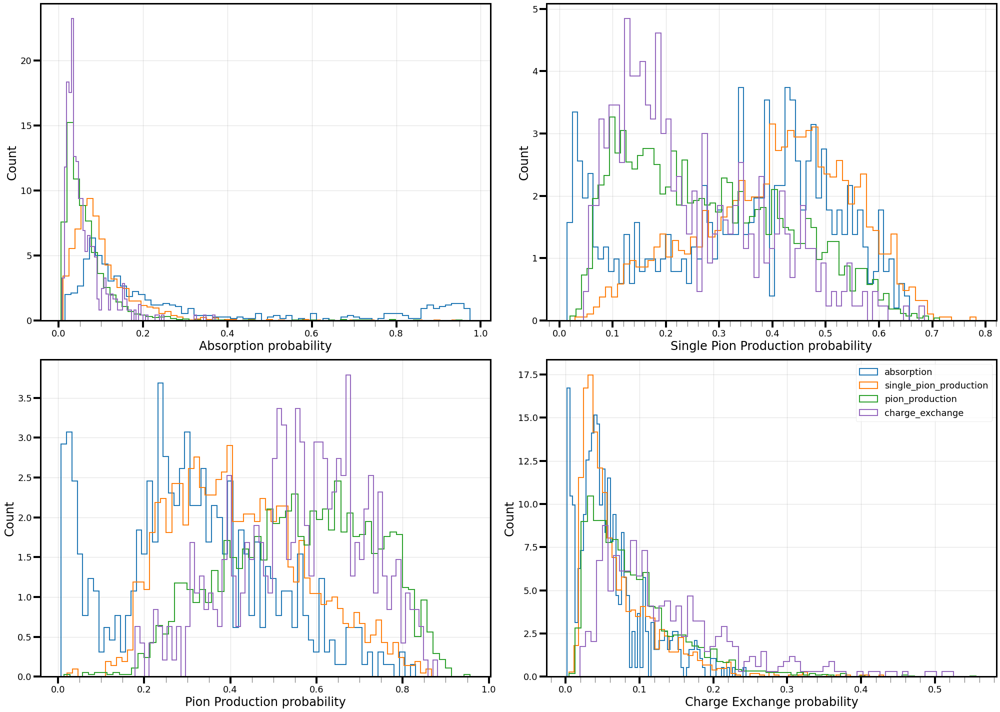

In [49]:
fig, axs = plt_conf.setup_figure(2, 2, figsize = (28, 20))
for j, ax_region in enumerate(["absorption", "single_pion_production", "pion_production", "charge_exchange"]):
    for i, region in enumerate(["absorption", "single_pion_production", "pion_production", "charge_exchange"]):
        axs[j//2, j%2].hist(proba_evt[:, j][test_class == i], **plt_conf.gen_kwargs(type="hist", index=i, label=region, bins=plt_conf.get_bins(proba_evt[:, 3]), density=True))
    plt_conf.format_axis(axs[j//2, j%2], xlabel=f"{ax_region.replace('_', ' ').title()} probability", ylabel="Count", ylog=False)
plt_conf.end_plot()

ValueError: cannot convert float NaN to integer

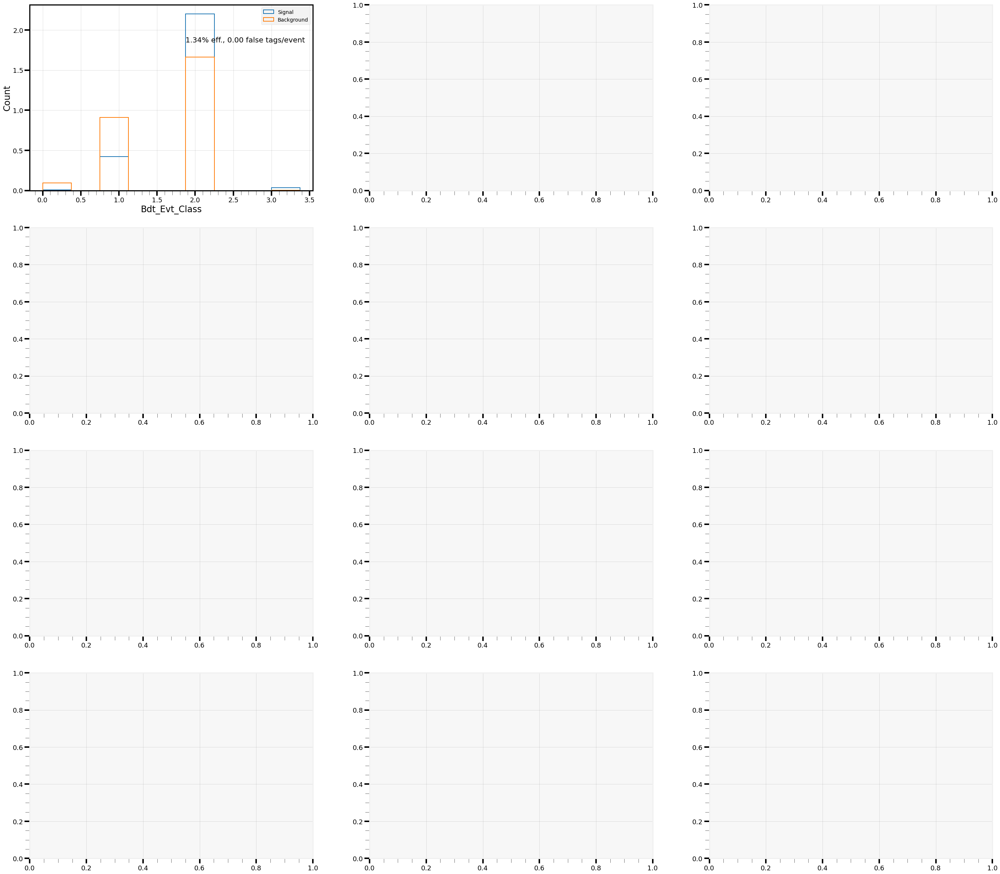

In [32]:
bdt_evt_eval = seval.SelectorEvaluator(test_class==3, test_data)
bdt_evt_eval.add_metric("bdt_evt_class", wrap_evt_bdt_args(lambda data: bdt_evt.predict(data), bdt_evt_eval, bad_imp), threshold=2.5)
bdt_evt_eval.make_metric_summary("bdt_evt_class")

In [19]:
evt_props_1_2 = gen_event_selection_props(evts, all_props, keys_to_use=event_props, n_pions=1, n_photons=2)
train_class_1_2, train_data_1_2, test_class_1_2, test_data_1_2 = separate_evt_train_test((regions_dict["absorption"], np.logical_or(regions_dict["single_pion_production"], regions_dict["pion_production"]), regions_dict["charge_exchange"]), evt_props_1_2)
_, train_mask = parse_bad_count_evts(train_data_1_2)

26165 data points found, separated into 20932 training points and 5233 test_points.


In [20]:
bdt_evt_1_2 = ensemble.GradientBoostingClassifier()
bdt_evt_1_2.fit(train_data_1_2[train_mask], train_class_1_2[train_mask])

GradientBoostingClassifier()

In [21]:
use_test_data_1_2 = convert_evts_dict_to_array(test_data_1_2)
test_1_2_res, test_1_2_mask = parse_bad_count_evts(use_test_data_1_2)
evt_num, evt_class = np.where(test_1_2_res == 1)
test_1_2_class = np.zeros(test_1_2_res.shape[0], dtype=int)
test_1_2_class[evt_num] = evt_class
test_1_2_res[test_1_2_mask] = bdt_evt_1_2.predict_proba(use_test_data_1_2[test_1_2_mask])
test_1_2_class[test_1_2_mask] = bdt_evt_1_2.predict(use_test_data_1_2[test_1_2_mask])

In [31]:
def print_stats(true, pred, num, name):
    true_mask = true==num
    pred_mask = pred==num
    return print(
        f"True {name}: {np.sum(true_mask)}, "
        + f"predicted {name}: {np.sum(pred_mask)}, "
        + f"{name} efficiency: {np.sum(np.logical_and(true_mask, pred_mask))/np.sum(true_mask)}, "
        + f"{name} fakes: {np.sum(np.logical_and(np.logical_not(true_mask), pred_mask))/np.sum(np.logical_and(true_mask, pred_mask))}, "
        + f"{name} purity: {np.sum(np.logical_and(true_mask, pred_mask))/np.sum(pred_mask)}.")

In [32]:
print_stats(test_class_1_2, test_1_2_class, 0, "absorbtion")
print_stats(test_class_1_2, test_1_2_class, 1, "pion prod.")
print_stats(test_class_1_2, test_1_2_class, 2, "cex.")

True absorbtion: 522, predicted absorbtion: 159, absorbtion efficiency: 0.08045977011494253, absorbtion fakes: 2.7857142857142856, absorbtion purity: 0.2641509433962264.
True pion prod.: 4264, predicted pion prod.: 4896, pion prod. efficiency: 0.9423076923076923, pion prod. fakes: 0.218516674962668, pion prod. purity: 0.8206699346405228.
True cex.: 447, predicted cex.: 178, cex. efficiency: 0.05592841163310962, cex. fakes: 6.12, cex. purity: 0.1404494382022472.


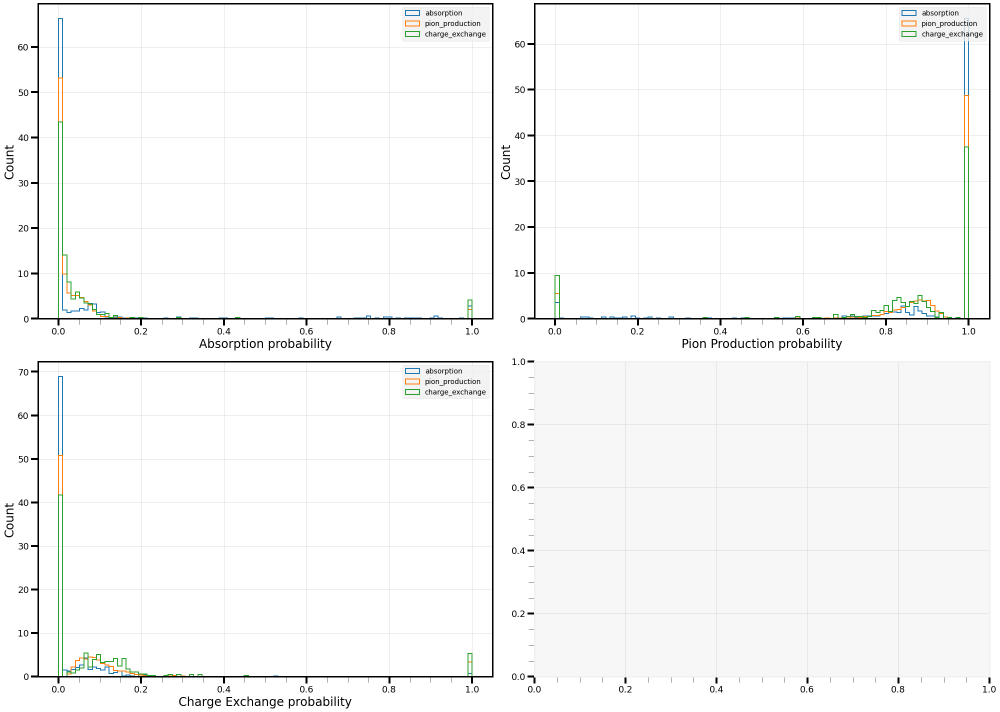

In [28]:
fig, axs = plt_conf.setup_figure(2, 2, figsize = (28, 20))
for j, ax_region in enumerate(["absorption", "pion_production", "charge_exchange"]):
    for i, region in enumerate(["absorption", "pion_production", "charge_exchange"]):
        axs[j//2, j%2].hist(test_1_2_res[:, j][test_class_1_2 == i], **plt_conf.gen_kwargs(type="hist", index=i, label=region, bins=plt_conf.get_bins(test_1_2_res[:, -1]), density=True))
    plt_conf.format_axis(axs[j//2, j%2], xlabel=f"{ax_region.replace('_', ' ').title()} probability", ylabel="Count", ylog=False)
    axs[j//2, j%2].legend()
plt_conf.end_plot()

In [39]:
print_stats(test_class_1_2, test_1_2_class, 0, "absorbtion")
print_stats(test_class_1_2, test_1_2_class, 1, "pion prod.")
print_stats(test_class_1_2, test_1_2_class, 2, "cex.")

True absorbtion: 522, predicted absorbtion: 159, absorbtion efficiency: 0.2641509433962264, absorbtion fakes: 2.7857142857142856
True pion prod.: 4264, predicted pion prod.: 4896, pion prod. efficiency: 0.8206699346405228, pion prod. fakes: 0.218516674962668
True cex.: 447, predicted cex.: 178, cex. efficiency: 0.1404494382022472, cex. fakes: 6.12


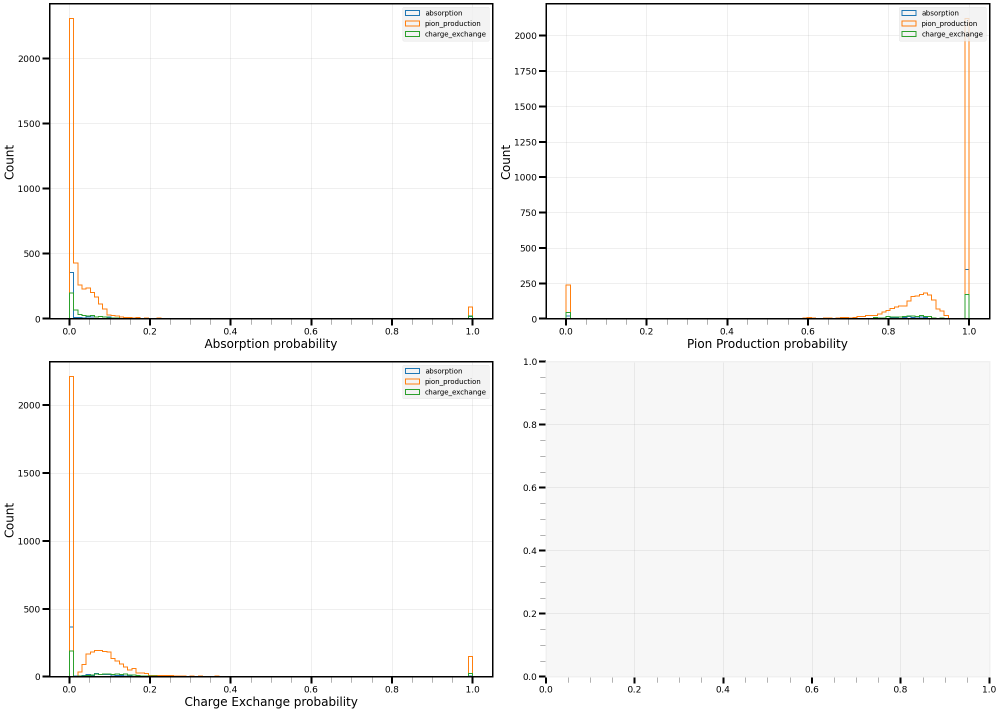

In [37]:
fig, axs = plt_conf.setup_figure(2, 2, figsize = (28, 20))
for j, ax_region in enumerate(["absorption", "pion_production", "charge_exchange"]):
    for i, region in enumerate(["absorption", "pion_production", "charge_exchange"]):
        axs[j//2, j%2].hist(test_1_2_res[:, j][test_class_1_2 == i], **plt_conf.gen_kwargs(type="hist", index=i, label=region, bins=plt_conf.get_bins(test_1_2_res[:, -1]), density=False))
    plt_conf.format_axis(axs[j//2, j%2], xlabel=f"{ax_region.replace('_', ' ').title()} probability", ylabel="Count", ylog=False)
    axs[j//2, j%2].legend()
plt_conf.end_plot()

## Older code
Based on this sort of stuff, but not up-to-date!

In [31]:
print(list(test_props_reduced.keys()))
print(bdt_reduced.feature_importances_)
print()
print(list(test_props.keys()))
print(bdt_new.feature_importances_)

['track', 'nhits', 'dEdx', 'chi2_pion_reduced', 'chi2_muon_reduced', 'chi2_proton_reduced', 'length']
[0.38802882 0.02131487 0.38859763 0.04631952 0.01028647 0.0418415
 0.10361119]

['track', 'nhits', 'dEdx', 'chi2_pion', 'chi2_dof', 'chi2_muon', 'chi2_proton', 'length']
[0.39074898 0.01539772 0.36973716 0.00930149 0.05191949 0.02394803
 0.05435198 0.08459514]


In [30]:
print(list(test_props_reduced.keys()))
print(bdt_reduced.feature_importances_)

['track', 'nhits', 'dEdx_med', 'dEdx_sum', 'dEdx_var', 'dEdx_end25%', 'dEdx_start75%', 'chi2_pion_reduced', 'chi2_muon_reduced', 'chi2_proton_reduced', 'length']
[0.35670119 0.01901328 0.37639981 0.01684698 0.01012212 0.04497791
 0.00775953 0.02894803 0.01593324 0.03429221 0.0890057 ]


In [29]:
bdt_new = ensemble.GradientBoostingClassifier()
bdt_new.fit(train_data, train_class)

GradientBoostingClassifier()

In [8]:
bdt_one_dof = seval.SelectorEvaluator(test_truth, test_props)
bdt_one_dof.add_metric("bdt", wrap_bdt_args(bdt_probs(bdt_new), bdt_one_dof), threshold=0.3)

In [ ]:
bdt_one_dof.make_property_correlations("chi2_pion", style="quartile_log")
bdt_one_dof.make_property_correlations("dEdx", style="quartile_log")

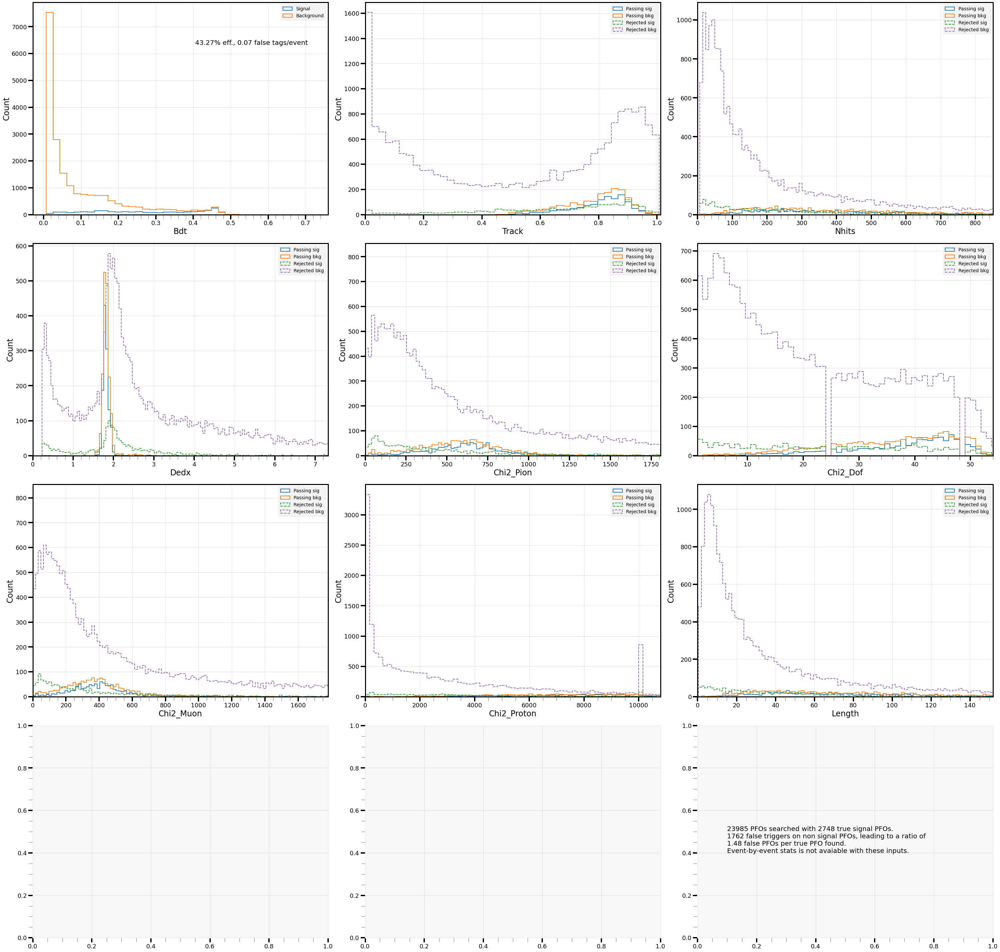

In [37]:
# bdt_one_dof = seval.SelectorEvaluator(test_truth, test_props)
# bdt_one_dof.add_metric("bdt", wrap_bdt_args(bdt_probs(bdt_new), bdt_one_dof), threshold=0.3)
bdt_one_dof.make_metric_summary("bdt", style="quartile_rejected")

In [85]:
bdt_selector = seval.SelectorEvaluator(old_test_truth, old_test_props)
bdt_selector.add_metric("bdt1", wrap_bdt_args(bdt_probs(bdt1), bdt_selector))

In [57]:
bdt_selector.metrics

{'bdt1': <function __main__.wrap_bdt_args.<locals>.func(use_props)>,
 'bdt1_n-1_track': <function python.analysis.SelectionEvaluation.SelectorEvaluator.remove_property_from_metric.<locals>.removal_argument_handler(properties_dict)>}

In [61]:
bdt_selector.metrics["bdt1_n-1_track"](test_props)

array([0, 0, 0, ..., 0, 0, 0])

In [16]:
bdt_selector.get_metric_values("bdt1")

array([0.39858166, 0.44071711, 0.01039465, ..., 0.01479232, 0.06604009,
       0.06707596])

In [71]:
ak.ravel(bdt_selector.get_metric_values("bdt1_n-1_track")[np.logical_and(bdt_selector.truth_mask, bdt_selector.get_passing("bdt1_n-1_track"))])

<Array [] type='0 * int64'>

In [81]:
np.unique(np.logical_and(bdt_selector.truth_mask, bdt_selector.get_passing("bdt1")), return_counts=True)

(array([False,  True]), array([23977,     8]))

In [88]:
ak.ravel(bdt_selector.properties["track"][np.logical_and(bdt_selector.truth_mask, bdt_selector.get_passing("bdt1"))])

<Array [0.66, 0.829, 0.798, ... 0.562, 0.872] type='8 * float64'>

In [ ]:
bdt_selector.make_metric_summary("bdt1", style="rejected_quartile")

In [88]:
bdt_selector.add_metric("bdt0.3", wrap_bdt_args(bdt_probs(bdt1), bdt_selector), threshold=0.3)

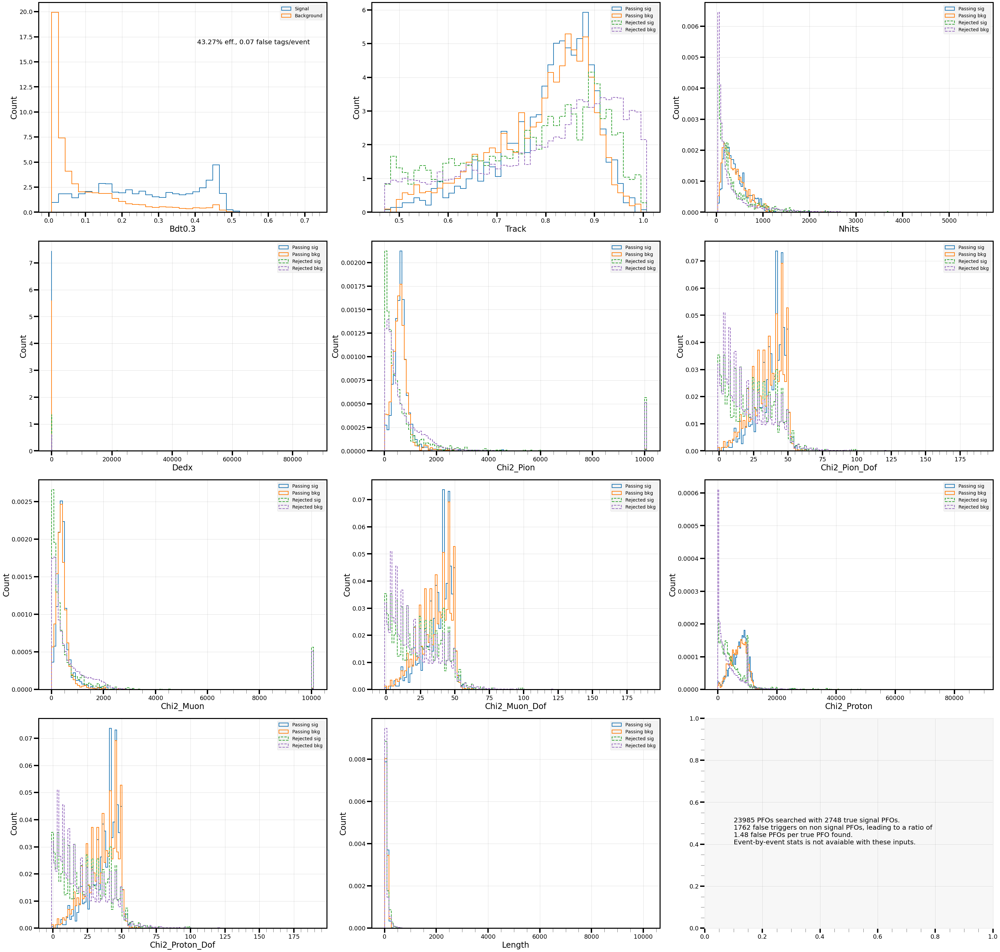

In [27]:
bdt_selector.add_metric("bdt0.3", wrap_bdt_args(bdt_probs(bdt1), bdt_selector), threshold=0.3)
bdt_selector.make_metric_summary("bdt0.3", style="rejected_quartile")

In [56]:
bdt_selector.properties["dEdx"]
passing_count = len(passing_sig) - 1
passing_sig = np.sort(passing_sig)
primary_data = self._determine_primary_data(passing_sig, passing_bkg, rejected_sig, rejected_bkg)
primary_data[min(int(np.round(passing_count * quartile/100)) + 1, passing_count)]

<Array [1.85, 1.79, 8.95, ... 1.4, 3.78, 0.279] type='23985 * float64'>

In [ ]:
bdt_selector.make_n_minus_1_per_property("bdt0.3", style="rejected_quartile")

In [ ]:
bdt_selector.make_n_minus_1_summary("bdt1", "track", style="rejected_quartile")

In [ ]:
pipselector_n = seval.SelectorEvaluator(piplus_truth, piplus_props)
pipselector_n.add_selector_metric("basic", track=(0.5,), nhits=(20,), dEdx=(0.5,2.8))

cProfile.run('pipselector_n.make_n_minus_1_summary("basic", "nhits")')

In [ ]:
import cProfile
cProfile.run('pipselector.make_n_minus_1_summary("basic", "nhits")')

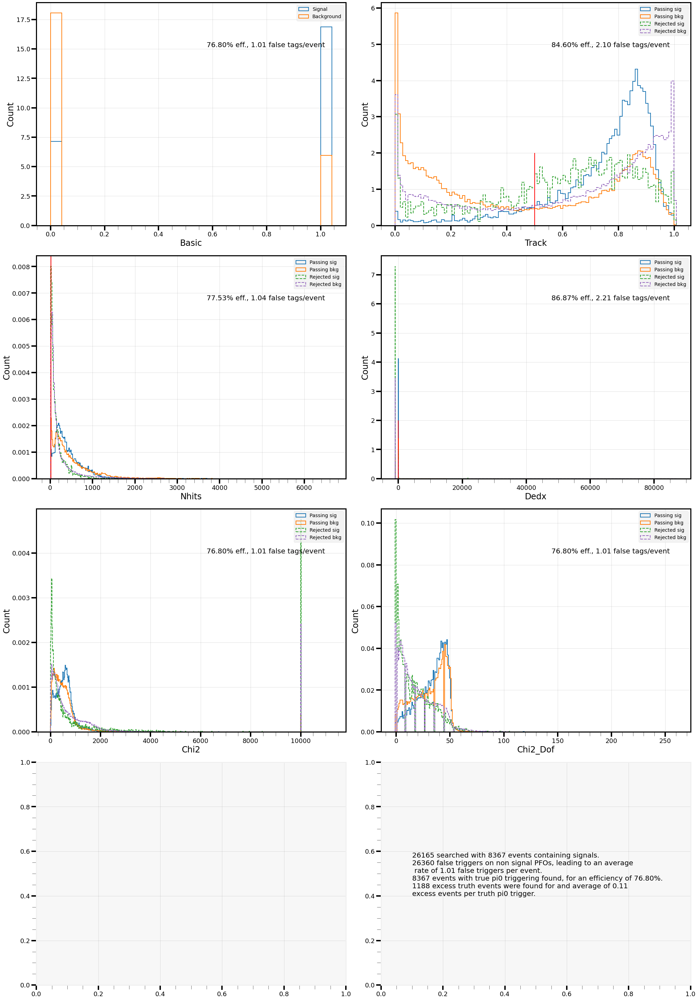

         570413414 function calls (570310411 primitive calls) in 2315.116 seconds

   Ordered by: cumulative time

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        1    0.000    0.000 2315.118 2315.118 {built-in method builtins.exec}
        1    0.000    0.000 2315.118 2315.118 <string>:1(<module>)
        1    0.001    0.001 2315.118 2315.118 SelectionEvaluation.py:537(make_n_minus_1_per_property)
        5    0.002    0.000 2293.628  458.726 SelectionEvaluation.py:323(plot_param_distributions)
       25    0.001    0.000 2284.834   91.393 __init__.py:1430(inner)
       22    0.462    0.021 2284.820  103.855 _axes.py:6446(hist)
       22    0.001    0.000 2283.161  103.780 _axes.py:5128(fill)
       22    0.051    0.002 2282.945  103.770 _base.py:2400(add_patch)
       22  225.505   10.250 2282.887  103.768 _base.py:2413(_update_patch_limits)
 23202612  130.710    0.000  983.394    0.000 path.py:420(iter_bezier)
 23202590  551.917    0.000  918.056    0

In [10]:
cProfile.run('pipselector.make_n_minus_1_per_property("basic")', sort="cumtime")

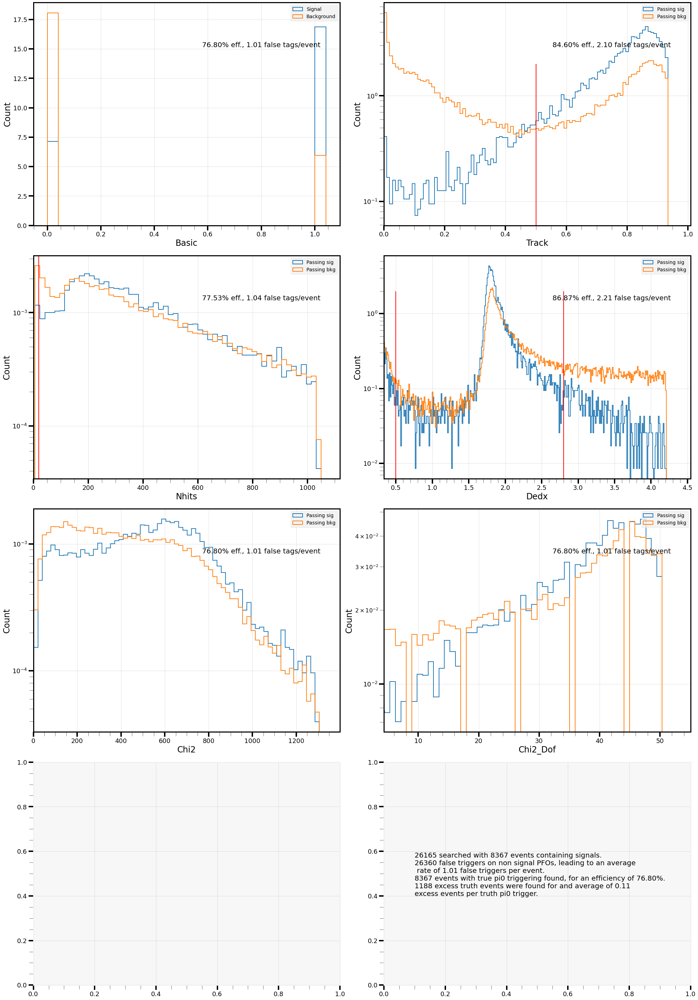

         21431855 function calls (21246621 primitive calls) in 64.733 seconds

   Ordered by: cumulative time

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        1    0.000    0.000   64.736   64.736 {built-in method builtins.exec}
        1    0.000    0.000   64.736   64.736 <string>:1(<module>)
        1    0.001    0.001   64.736   64.736 SelectionEvaluation.py:537(make_n_minus_1_per_property)
        5    0.001    0.000   56.770   11.354 SelectionEvaluation.py:323(plot_param_distributions)
       15    0.000    0.000   54.101    3.607 __init__.py:1430(inner)
       12    0.007    0.001   54.090    4.507 _axes.py:6446(hist)
       12    0.000    0.000   54.034    4.503 _axes.py:5128(fill)
       12    0.000    0.000   54.019    4.502 _base.py:2400(add_patch)
       12    5.279    0.440   54.015    4.501 _base.py:2413(_update_patch_limits)
   542888    3.072    0.000   23.423    0.000 path.py:420(iter_bezier)
   542876   13.068    0.000   21.620    0.000

In [11]:
cProfile.run('pipselector.make_n_minus_1_per_property("basic", style="display")', sort="cumtime")

In [ ]:
pipselector = SelectorEvaluator(piplus_truth, piplus_props)
pipselector.add_selector_metric("basic", track=(0.5,), nhits=(20,), dEdx=(0.5,2.8))

pipselector.make_n_minus_1_summary("basic", "nhits")
pipselector.make_n_minus_1_summary("basic", "nhits", style="rejected_quartile")
pipselector.make_n_minus_1_per_property("basic")
pipselector.make_n_minus_1_per_property("basic", style="display")

In [ ]:
pipselector.make_n_minus_1_summary("basic", "dEdx", style="display")
pipselector.make_n_minus_1_summary("basic", "dEdx", style="rejected_quartile")

In [9]:
from importlib import reload
reload(PairSelection)

<module 'python.analysis.PairSelection' from '/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/PairSelection.py'>

In [ ]:
def get_two_count_pi0s(pi0s):
    pions, counts = np.unique(pi0s, return_counts=True)
    return pions[counts == 2]

beam_cadidate_pi0s = events.trueParticles.number[np.logical_and(
    events.trueParticles.mother == 1,
    events.trueParticles.pdg == 111)]

pi0_daughters = events.trueParticles.mother_pdg == 111
pi0_photon_mothers = events.trueParticles.mother[np.logical_and(
    events.trueParticles.pdg == 22,
    pi0_daughters)]
counts = ak.Array(map(
    lambda pi0s: len(
        np.intersect1d(
            pi0s['beam'],
            get_two_count_pi0s(pi0s['photon']))),
    ak.zip(
        {"beam": beam_cadidate_pi0s, "photon": pi0_photon_mothers},
        depth_limit=1)))

In [9]:
def get_counts(events):
    def get_two_count_pi0s(pi0s):
        pions, counts = np.unique(pi0s, return_counts=True)
        return pions[counts == 2]
    
    beam_pi0s = np.logical_and(
        events.trueParticles.mother == 1,
        events.trueParticles.pdg == 111)
    pi0_numbers = events.trueParticles.number[beam_pi0s]

    pi0_daughters = events.trueParticles.mother_pdg == 111
    pi0_photon_mothers = events.trueParticles.mother[np.logical_and(
        events.trueParticles.pdg == 22,
        pi0_daughters)]

    reco_photon_mothers = events.trueParticlesBT.mother[events.trueParticlesBT.pdg == 22]

    def get_counts(zipped):
        return [sum(zipped['photon'] == pi) for pi in np.intersect1d(
            zipped['pi0'],
            get_two_count_pi0s(zipped['diphoton']))]

    return ak.Array(map(
        get_counts,
        ak.zip(
            {"pi0": pi0_numbers, "diphoton": pi0_photon_mothers, "photon": reco_photon_mothers},
            depth_limit=1)))

In [10]:
counts = get_counts(evts)

In [20]:
counts2 = get_counts(evts2)

In [22]:
np.unique(ak.ravel(counts2), return_counts=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 20, 21, 25, 26, 27, 29, 32]),
 array([ 14,  54, 102,  83,  94,  53,  38,  44,  33,  22,  20,  20,  16,
          7,   7,   7,   6,   9,   2,   1,   2,   1,   1,   1,   1]))

In [21]:
np.unique(ak.num(counts2), return_counts=True)

(array([0, 1, 2]), array([2442,  548,   45]))

In [12]:
np.unique(ak.num(counts), return_counts=True)

(array([0, 1, 2]), array([2442,  548,   45]))

In [17]:
np.unique(ak.ravel(counts), return_counts=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 19,
        22]),
 array([ 30, 148, 167, 105,  57,  39,  32,  13,  13,  11,   8,   4,   3,
          3,   1,   2,   1,   1]))

In [25]:
print(ak.count(counts))
# print(ak.count(counts2))

638
638


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


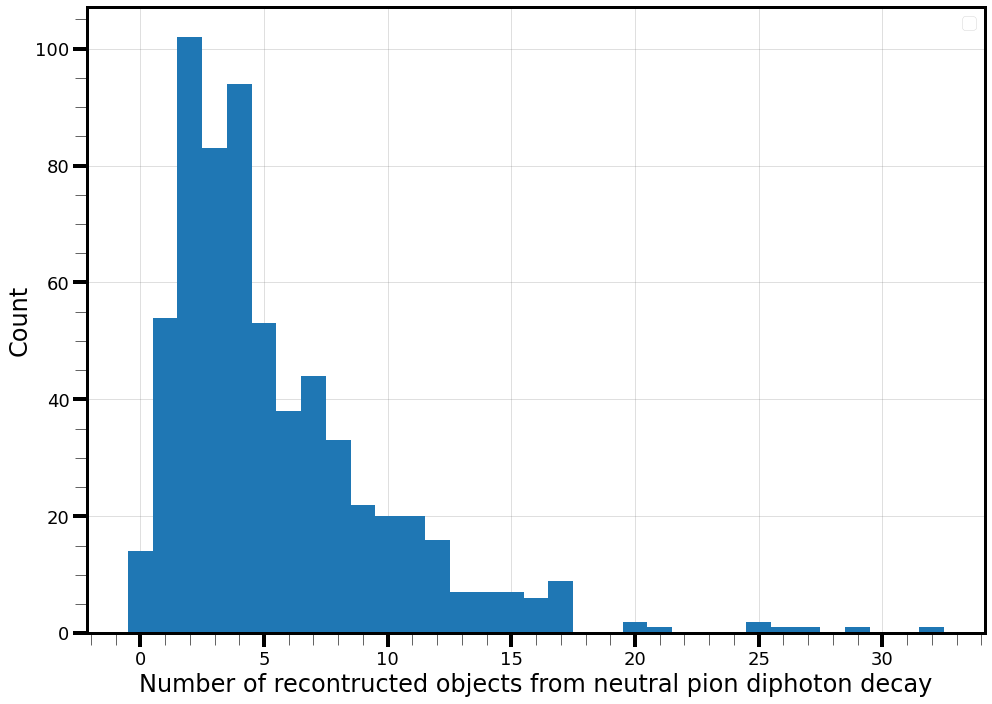

In [23]:
cnts2 = ak.ravel(counts2)
plt_conf.setup_figure()
plt.hist(cnts2, **plt_conf.gen_kwargs(type="hist", histtype="bar", index=0, bins=max(cnts2)+1, range=(-0.5, max(cnts2)+0.5)))
plt_conf.format_axis(xlabel="Number of recontructed objects from neutral pion diphoton decay", ylabel="Count")
plt_conf.end_plot()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


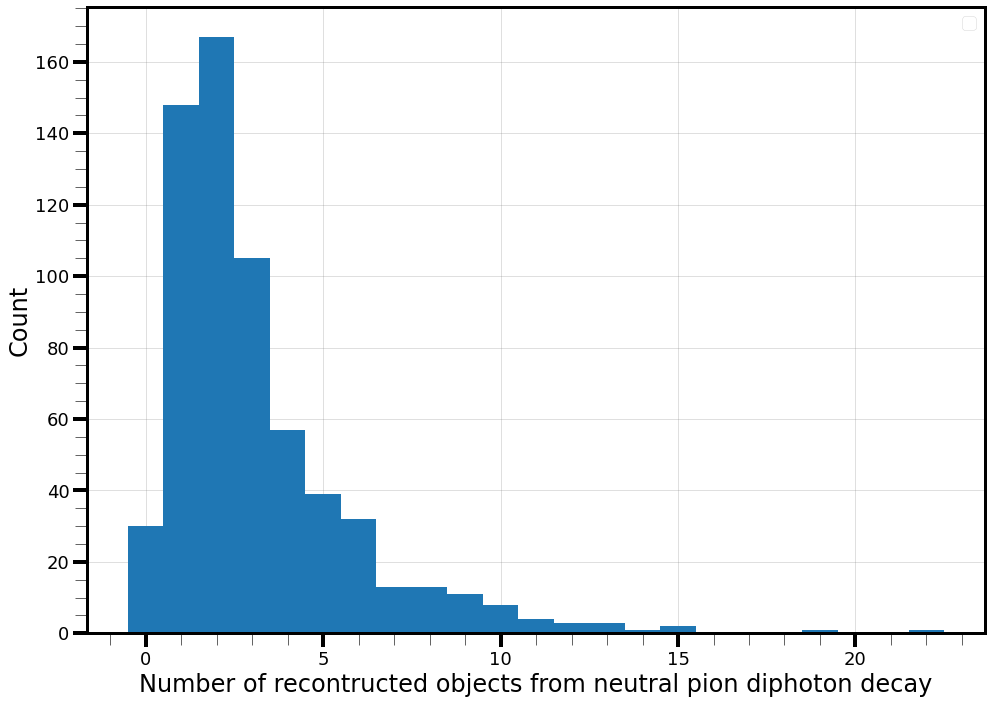

In [16]:
cnts = ak.ravel(counts)
plt_conf.setup_figure()
plt.hist(cnts, **plt_conf.gen_kwargs(type="hist", histtype="bar", index=0, bins=max(cnts)+1, range=(-0.5, max(cnts)+0.5)))
plt_conf.format_axis(xlabel="Number of recontructed objects from neutral pion diphoton decay", ylabel="Count")
plt_conf.end_plot()

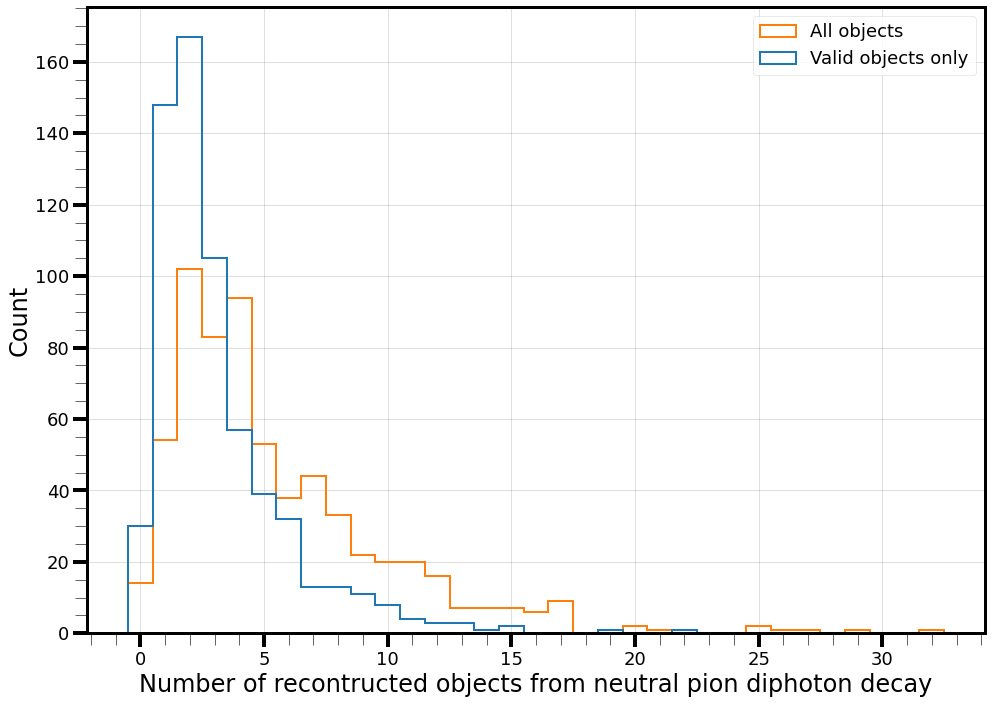

In [24]:
plt_conf.setup_figure()
plt.hist(cnts2, **plt_conf.gen_kwargs(label="All objects", type="hist", index=1, bins=max(cnts2)+1, range=(-0.5, max(cnts2)+0.5)))
plt.hist(cnts, **plt_conf.gen_kwargs(label="Valid objects only", type="hist", index=0, bins=max(cnts)+1, range=(-0.5, max(cnts)+0.5)))
plt_conf.format_axis(xlabel="Number of recontructed objects from neutral pion diphoton decay", ylabel="Count")
plt_conf.end_plot()

In [28]:
np.unique(ak.num(counts), return_counts=True)

(array([0, 1, 2]), array([2430,  560,   45]))

In [ ]:
def get_two_count_pi0s(pi0s):
        pions, counts = np.unique(pi0s, return_counts=True)
        return pions[counts == 2]

    if beam_daughters:
        beam_daughter_filter = events.trueParticles.mother == 1
    else:
        beam_daughter_filter = True
    beam_cadidate_pi0s = events.trueParticles.number[np.logical_and(
        beam_daughter_filter,
        events.trueParticles.pdg == 111)]
    try:
        pi0_daughters = events.trueParticles.mother_pdg == 111
    except:
        pi0_daughters = get_mother_pdgs(events) == 111
    pi0_photon_mothers = events.trueParticles.mother[np.logical_and(
        events.trueParticles.pdg == 22,
        pi0_daughters)]
    counts = ak.Array(map(
        lambda pi0s: len(
            np.intersect1d(
                pi0s['beam'],
                get_two_count_pi0s(pi0s['photon']))),
        ak.zip(
            {"beam": beam_cadidate_pi0s, "photon": pi0_photon_mothers},
            depth_limit=1)))

In [33]:
def get_electrons(pi0s):
    pions, counts = np.unique(pi0s, return_counts=True)
    return pions[counts >=1]

beam_daughter_filter = evts.trueParticles.mother == 1
beam_cadidate_pi0s = evts.trueParticles.number[np.logical_and(
    beam_daughter_filter,
    evts.trueParticles.pdg == 111)]
pi0_daughters = evts.trueParticles.mother_pdg == 111
pi0_photon_mothers = evts.trueParticles.mother[np.logical_and(
    evts.trueParticles.pdg == 11,
    pi0_daughters)]
dalitz_counts = ak.Array(map(
    lambda pi0s: len(
        np.intersect1d(
            pi0s['beam'],
            get_electrons(pi0s['photon']))),
    ak.zip(
        {"beam": beam_cadidate_pi0s, "photon": pi0_photon_mothers},
        depth_limit=1)))

print(ak.sum(dalitz_counts))

12


In [13]:
print(ak.sum(EventSelection.generate_truth_tags(evts, 0, None)))
print(ak.sum(EventSelection.generate_truth_tags(evts, 1, None)))
print(ak.sum(EventSelection.generate_truth_tags(evts, 2, None)))
print(ak.sum(EventSelection.generate_truth_tags(evts, (3,), None)))

2442
548
45
0


In [26]:
zeros_mask = ak.Array(map(lambda x: 0 in x, counts2))

In [35]:
for i, this_event in enumerate(evts.trueParticles.pdg[zeros_mask]):
    print(this_event[evts.trueParticles.mother[zeros_mask][i] == 1])

[111, 11, 11, 11, 11, 11, 11, 11, ... 2112, 211, 111, 22, 22, 2112, 1000180380, 211]
[111, 11, 11, 11, 11, 11, 11, ... 22, 2112, 1000010020, 1000020040, 1000130280, 211]
[111, 11, 11, 11, 11, 11, 11, 11, ... 11, 11, 11, 2212, 111, 22, 2112, 1000180380]
[111, 111, 11, 11, 11, 11, 11, ... 2112, 22, 22, 1000010020, 1000020040, 1000140280]
[111, 111, 11, 11, 11, 11, 11, 11, ... 111, 2212, 22, 2112, 2112, 22, 22, 1000160340]
[111, 11, 11, 11, 11, 11, 11, ... 2212, 22, 2112, 22, 1000020040, 1000140300, 211]
[111, 11, 11, 11, 11, 11, 11, 11, ... 2212, 2112, 2112, 2112, 2112, 22, 1000140290]
[111, 11, 11, 11, 11, 11, 11, ... 2112, 2112, 2112, 22, 22, 1000010020, 1000110230]
[111, 11, 11, 11, 11, 11, 11, 11, ... 22, 2212, 2112, 2212, 2112, 22, 1000140280]
[111, 11, 11, 11, 11, 11, 11, 11, ... 2112, 2112, 2212, 2112, 2112, 2112, 1000140290]
[111, 11, 11, 11, 11, 11, 11, 11, ... 22, 2112, 22, 2112, 22, 1000010020, 1000160320]
[111, 11, 11, 11, 11, 11, 11, ... 2112, 2112, 2112, 22, 1000020030, 100

In [19]:
evts2 = EventSelection.load_and_cut_data(
    "/scratch/wx21978/pi0/root_files/1GeV_beam_v4_prelim/Prod4a_1GeV_BeamSim_00_prelim.root",
    batch_size = -1, batch_start = -1,
    valid_momenta=False,
    cnn_cut=0,#0.5,
    n_hits_cut=0,#80,
    distance_bounds_cm=None,#(3,90),
    max_impact_cm=None,#20,
    beam_slice_cut=False)

number of entries before|after PiBeamSelection: 23660|13430
number of entries before|after PandoraTagCut: 23660|19505
number of entries before|after CaloSizeCut: 23660|19194
number of entries before|after BeamQualityCut: 23660|14415
number of entries before|after APA3Cut: 23660|21409
number of entries before|after MichelScoreCut: 23660|9583
number of entries before|after MedianDEdXCut: 23660|15907
                 number of events which pass the cut  single efficiency  \
no selection                                 23660.0         100.000000   
PiBeamSelection                              13430.0          56.762468   
PandoraTagCut                                19505.0          82.438715   
CaloSizeCut                                  19194.0          81.124260   
BeamQualityCut                               14415.0          60.925613   
APA3Cut                                      21409.0          90.486052   
MichelScoreCut                                9583.0          40.502959   

In [8]:
evts = EventSelection.load_and_cut_data(
    "/scratch/wx21978/pi0/root_files/1GeV_beam_v4_prelim/Prod4a_1GeV_BeamSim_00_prelim.root",
    batch_size = -1, batch_start = -1,
    valid_momenta=True,
    cnn_cut=0,#0.5,
    n_hits_cut=0,#80,
    distance_bounds_cm=None,#(3,90),
    max_impact_cm=None,#20,
    beam_slice_cut=False)

# pair_coords = ak.argcombinations(evts.recoParticles.number, 2)

# sig_count = PairSelection.get_sig_count(evts, pair_coords)
# truth_mask = sig_count == 2
# print("a")

# pairs = Master.ShowerPairs(evts, pair_coords)
# print("b")
# masses = pairs.reco_mass
# momenta = pairs.reco_pi0_mom
# energies = pairs.reco_energy
# approaches = pairs.reco_closest_approach
# separations = pairs.reco_separation
# impacts = PairSelection.paired_beam_impact(pairs)
# angles = pairs.reco_angle

number of entries before|after PiBeamSelection: 23660|13430
number of entries before|after PandoraTagCut: 23660|19505
number of entries before|after CaloSizeCut: 23660|19194
number of entries before|after BeamQualityCut: 23660|14415
number of entries before|after APA3Cut: 23660|21409
number of entries before|after MichelScoreCut: 23660|9583
number of entries before|after MedianDEdXCut: 23660|15907
                 number of events which pass the cut  single efficiency  \
no selection                                 23660.0         100.000000   
PiBeamSelection                              13430.0          56.762468   
PandoraTagCut                                19505.0          82.438715   
CaloSizeCut                                  19194.0          81.124260   
BeamQualityCut                               14415.0          60.925613   
APA3Cut                                      21409.0          90.486052   
MichelScoreCut                                9583.0          40.502959   

In [9]:
tags = {
    "10-0+": EventSelection.generate_truth_tags(evts, 1, 0),
    "X0-0+": EventSelection.generate_truth_tags(evts, (1,), 0),
    "00-0+": EventSelection.generate_truth_tags(evts, 0, 0),
    "00-X+": EventSelection.generate_truth_tags(evts, 0, (1,)),
    "X0-X+": EventSelection.generate_truth_tags(evts, (1,), (1,)),
    "X0-+": EventSelection.generate_truth_tags(evts, (1,), None)}

In [22]:
# print(ak.all(tags["00-0+"] + tags["00-X+"] + tags["X0-+"]))
keys = list(tags.keys())
for i,k in enumerate(keys):
    for k2 in keys[i+1:]:
        print(f"{k}, {k2} Overlapping: {ak.any(tags[k] * tags[k2])}")
        print(f"{k} subset of {k2}: {ak.all((tags[k] * tags[k2])[tags[k]])}")
        print(f"{k2} subset of {k}: {ak.all((tags[k] * tags[k2])[tags[k2]])}")

10-0+, X0-0+ Overlapping: True
10-0+ subset of X0-0+: True
X0-0+ subset of 10-0+: False
10-0+, 00-0+ Overlapping: False
10-0+ subset of 00-0+: False
00-0+ subset of 10-0+: False
10-0+, 00-X+ Overlapping: False
10-0+ subset of 00-X+: False
00-X+ subset of 10-0+: False
10-0+, X0-X+ Overlapping: False
10-0+ subset of X0-X+: False
X0-X+ subset of 10-0+: False
10-0+, X0-+ Overlapping: True
10-0+ subset of X0-+: True
X0-+ subset of 10-0+: False
X0-0+, 00-0+ Overlapping: False
X0-0+ subset of 00-0+: False
00-0+ subset of X0-0+: False
X0-0+, 00-X+ Overlapping: False
X0-0+ subset of 00-X+: False
00-X+ subset of X0-0+: False
X0-0+, X0-X+ Overlapping: False
X0-0+ subset of X0-X+: False
X0-X+ subset of X0-0+: False
X0-0+, X0-+ Overlapping: True
X0-0+ subset of X0-+: True
X0-+ subset of X0-0+: False
00-0+, 00-X+ Overlapping: False
00-0+ subset of 00-X+: False
00-X+ subset of 00-0+: False
00-0+, X0-X+ Overlapping: False
00-0+ subset of X0-X+: False
X0-X+ subset of 00-0+: False
00-0+, X0-+ Overlappin

In [10]:
pairs = Master.ShowerPairs(evts, pair_coords)
print("b")
masses = pairs.reco_mass
momenta = pairs.reco_pi0_mom
energies = pairs.reco_energy
approaches = pairs.reco_closest_approach
separations = pairs.reco_separation
impacts = PairSelection.paired_beam_impact(pairs)
angles = pairs.reco_angle

b


/software/wx21978/miniconda/envs/pi0-phys/lib/python3.10/site-packages/awkward/_connect/_numpy.py:195: RuntimeWarning: invalid value encountered in true_divide
  result = getattr(ufunc, method)(


In [9]:
selction_filter = PFOSelection.InitialPi0PhotonSelection(evts, verbose=True)
test_evts = evts.Filter([selction_filter], returnCopy=True)
EventSelection.apply_filter(test_evts, Master.NPFPMask(test_evts, -1), truth_filter=True)

number of entries before|after EMScoreCut: 790027|601498
number of entries before|after NHitsCut: 790027|204662
number of entries before|after BeamParticleDistanceCut: 790027|16727
number of entries before|after BeamParticleIPCut: 790027|9298
                         number of events which pass the cut  \
no selection                                        790027.0   
EMScoreCut                                          601498.0   
NHitsCut                                            204662.0   
BeamParticleDistanceCut                              16727.0   
BeamParticleIPCut                                     9298.0   

                         single efficiency  \
no selection                    100.000000   
EMScoreCut                       76.136385   
NHitsCut                         25.905697   
BeamParticleDistanceCut           2.117269   
BeamParticleIPCut                 1.176922   

                         number of events after successive cuts  \
no selection                

/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:54: UserWarning: Couldn't apply filters to filters.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:54: UserWarning: Couldn't apply filters to _RecoParticleData__beam_number.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:54: UserWarning: Couldn't apply filters to _RecoParticleData__beam_caloWire.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:54: UserWarning: Couldn't apply filters to _RecoParticleData__beam_startPos.
  warnings.warn(f"Couldn't apply filters to {var}.")
/users/wx21978/projects/pion-phys/pi0-analysis/analysis/python/analysis/Master.py:54: UserWarning: Couldn't apply filters to _RecoParticleData__beam_endPos.
  warnings.warn(f"Coul

Mask created


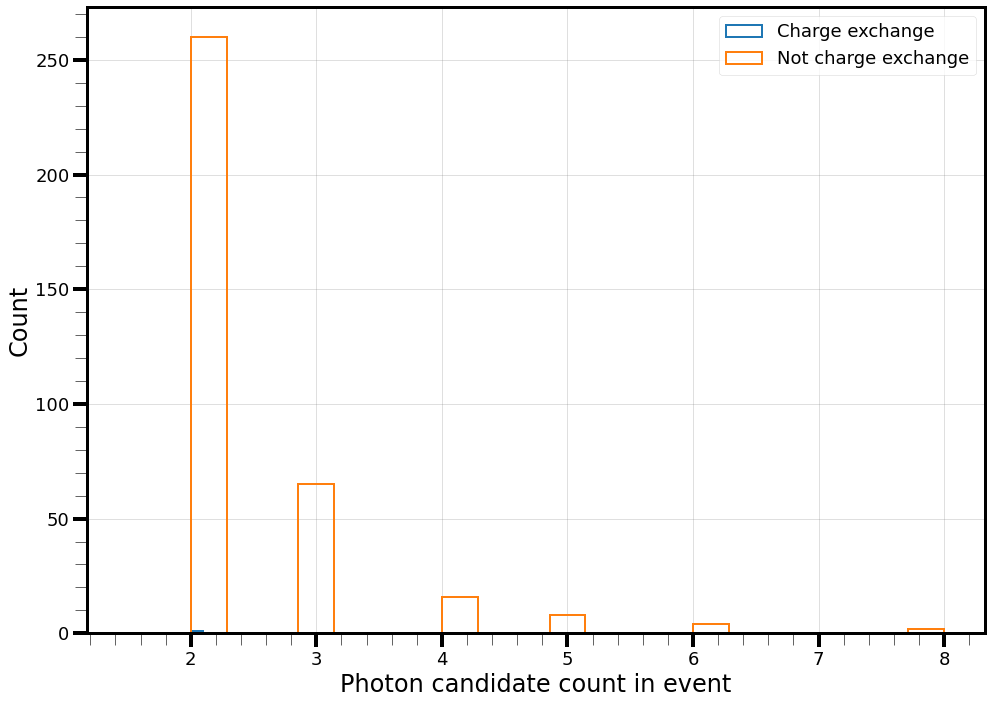

In [ ]:
charge_exchange_mask = EventSelection.generate_truth_tags(evts, 1, 0)
print("Mask created")
cex_counts = ak.count(evts.recoParticles.number[charge_exchange_mask], axis=1)
not_cex_counts = ak.count(evts.recoParticles.number[np.logical_not(charge_exchange_mask)], axis=1)

plt_conf.setup_figure()
plt.hist(cex_counts, **plt_conf.gen_kwargs(type="hist", index=0, label="Charge exchange", bins=plt_conf.get_bins(cex_counts)))
plt.hist(not_cex_counts, **plt_conf.gen_kwargs(type="hist", index=1, label="Not charge exchange", bins=plt_conf.get_bins(not_cex_counts)))
plt_conf.format_axis(xlabel="Photon candidate count in event", ylabel="Count")
plt_conf.end_plot()

In [ ]:
tags = {
    "Charge ex. 1pi0, 0pi+": EventSelection.generate_truth_tags(evts, 1, 0),
    "Charge ex. Xpi0, 0pi+": EventSelection.generate_truth_tags(evts, (1,), 0),
    "Absorbtion 0pi0, 0pi+": EventSelection.generate_truth_tags(evts, 0, 0),
    "Pion production 0pi0, Xpi+": EventSelection.generate_truth_tags(evts, 0, (1,)),
    "Pion production Xpi0, Xpi+": EventSelection.generate_truth_tags(evts, (1,), (1,)),
    "Inclusive pi0 signal Xpi0, 0/Xpi+": EventSelection.generate_truth_tags(evts, (1,), None)}

for label in tags.keys():
    print(f"{ak.sum(tags[label])} events of type: {label}.")



407 events of type: Charge ex. 1pi0, 0pi+.
449 events of type: Charge ex. Xpi0, 0pi+.
1263 events of type: Absorbtion 0pi0, 0pi+.
1179 events of type: Pion production 0pi0, Xpi+.
144 events of type: Pion production Xpi0, Xpi+.
593 events of type: Inclusive pi0 signal Xpi0, 0/Xpi+.


In [13]:
test_evts = evts.Filter([selction_filter], returnCopy=True)
EventSelection.apply_filter(test_evts, np.sort(Master.NPFPMask(test_evts, -1))[::-1], truth_filter=True)

In [14]:
tags = {
    "Charge ex. 1pi0, 0pi+": EventSelection.generate_truth_tags(test_evts, 1, 0),
    "Charge ex. Xpi0, 0pi+": EventSelection.generate_truth_tags(test_evts, (1,), 0),
    "Absorbtion 0pi0, 0pi+": EventSelection.generate_truth_tags(test_evts, 0, 0),
    "Pion production 0pi0, Xpi+": EventSelection.generate_truth_tags(test_evts, 0, (1,)),
    "Pion production Xpi0, Xpi+": EventSelection.generate_truth_tags(test_evts, (1,), (1,)),
    "Inclusive pi0 signal Xpi0, 0/Xpi+": EventSelection.generate_truth_tags(test_evts, (1,), None)}

for label in tags.keys():
    print(f"{ak.sum(tags[label])} events of type: {label}.")

12 events of type: Charge ex. 1pi0, 0pi+.
14 events of type: Charge ex. Xpi0, 0pi+.
57 events of type: Absorbtion 0pi0, 0pi+.
41 events of type: Pion production 0pi0, Xpi+.
6 events of type: Pion production Xpi0, Xpi+.
20 events of type: Inclusive pi0 signal Xpi0, 0/Xpi+.


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


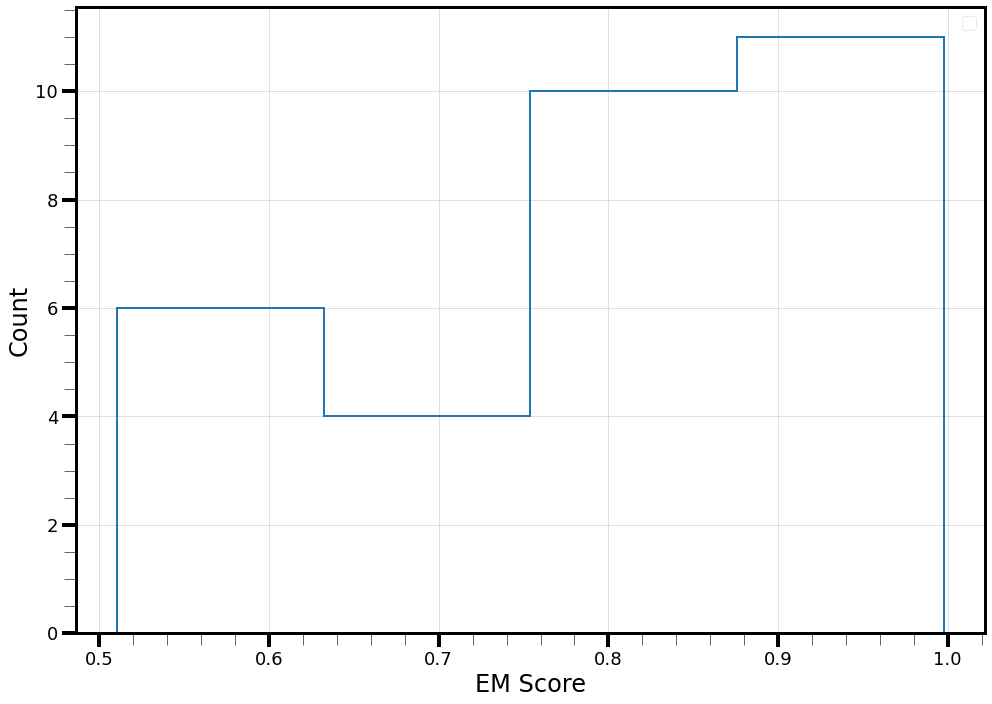

In [16]:
data = ak.ravel(test_evts.recoParticles.emScore)
plt_conf.setup_figure()
plt.hist(data, **plt_conf.gen_kwargs(type="hist", bins=plt_conf.get_bins(data)))
plt_conf.format_axis(xlabel="EM Score", ylabel="Count")
plt_conf.end_plot()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


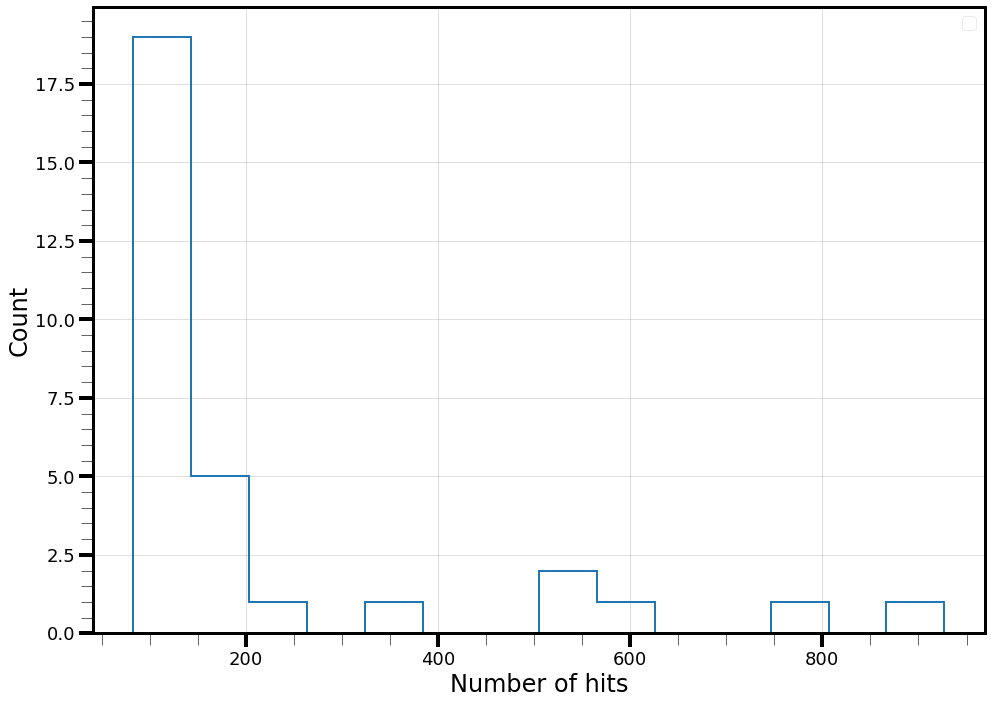

In [17]:
data = ak.ravel(test_evts.recoParticles.nHits)
plt_conf.setup_figure()
plt.hist(data, **plt_conf.gen_kwargs(type="hist", bins=plt_conf.get_bins(data)))
plt_conf.format_axis(xlabel="Number of hits", ylabel="Count")
plt_conf.end_plot()

In [ ]:
tags = {
    "Charge ex. 1pi0, 0pi+": EventSelection.generate_truth_tags(test_evts, 1, 0),
    "Charge ex. Xpi0, 0pi+": EventSelection.generate_truth_tags(test_evts, (1,), 0),
    "Absorbtion 0pi0, 0pi+": EventSelection.generate_truth_tags(test_evts, 0, 0),
    "Pion production 0pi0, Xpi+": EventSelection.generate_truth_tags(test_evts, 0, (1,)),
    "Pion production Xpi0, Xpi+": EventSelection.generate_truth_tags(test_evts, (1,), (1,)),
    "Inclusive pi0 signal Xpi0, 0/Xpi+": EventSelection.generate_truth_tags(test_evts, (1,), None)}

for label in tags.keys():
    print(f"{ak.sum(tags[label])} events of type: {label}.")

12 events of type: Charge ex. 1pi0, 0pi+.
14 events of type: Charge ex. Xpi0, 0pi+.
57 events of type: Absorbtion 0pi0, 0pi+.
41 events of type: Pion production 0pi0, Xpi+.
6 events of type: Pion production Xpi0, Xpi+.
20 events of type: Inclusive pi0 signal Xpi0, 0/Xpi+.


In [ ]:
print(ak.num(evts.eventNum, axis=0))
print(ak.num(test_evts.eventNum, axis=0))

3035
118


In [ ]:
from python.analysis import pfoProperties
num_events = ak.num(evts.recoParticles.beam_number, axis=0)
distance_mask_old = [[]] * num_events
print(num_events)
for i in range(num_events):
    if i%100 == 0:
        print(i)
    starts = evts.recoParticles.startPos[i]
    beam_vertex = evts.recoParticles.beam_endPos[i]
    directions = evts.recoParticles.direction[i]
    distance_mask_old[i] = pfoProperties.get_impact_parameter(
                directions,
                starts,
                beam_vertex) < 20
distance_mask_old = ak.Array(distance_mask_old)

distances_new = pfoProperties.get_impact_parameter(evts.recoParticles.direction, evts.recoParticles.startPos, evts.recoParticles.beam_endPos)

23633
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000
15100
15200
15300
15400
15500
15600
15700
15800
15900
16000
16100
16200
16300
16400
16500
16600
16700
16800
16900
17000
17100
17200
17300
17400
17500
17600
17700
17800
17900
18000
18100
18200
18300
18

In [ ]:
selectors = SelectorEvaluator(evts, pair_coords, sig_count)
selectors.add_selector_metric("basic", mass_cuts=(50,150), approach_cuts=40, impact_cuts=40, separation_cuts=(5,60))

selectors.make_n_minus_1_summary("basic", "mass")
selectors.make_n_minus_1_per_property("basic")
selectors.make_n_minus_1_per_property("basic", style="display")

In [ ]:
# sig_evts = photon_pairs.load_and_cut_data("/scratch/wx21978/pi0/root_files/1GeV_beam_v3/Prod4a_1GeV_BeamSim_00.root", batch_size = -1, batch_start = -1, pion_count="one", two_photon=True)
# bkg_evts = photon_pairs.load_and_cut_data("/scratch/wx21978/pi0/root_files/1GeV_beam_v3/Prod4a_1GeV_BeamSim_00.root", batch_size = -1, batch_start = -1, pion_count="zero", two_photon=False)

# #TODO Split into a background and signal version
# # For bkg, use onl

# sig_pair_coords = ak.argcombinations(sig_evts.recoParticles.number, 2)
# bkg_pair_coords = ak.argcombinations(bkg_evts.recoParticles.number, 2)

# sig_count_single = photon_pairs.get_sig_count(sig_evts, sig_pair_coords, single_best=True) # This isn't working as the "best" method wasnt' designed to deal with this
# sig_count_multi = photon_pairs.get_sig_count(sig_evts, sig_pair_coords)
# bkg_count_multi = photon_pairs.get_sig_count(bkg_evts, bkg_pair_coords)


# sig_masses = photon_pairs.paired_mass(sig_evts, sig_pair_coords)
# sig_momenta = vector.magnitude(photon_pairs.paired_momentum(sig_evts, sig_pair_coords))
# sig_energies = photon_pairs.paired_energy(sig_evts, sig_pair_coords)
# sig_approaches = photon_pairs.paired_closest_approach(sig_evts, sig_pair_coords)
# sig_separations = photon_pairs.paired_separation(sig_evts, sig_pair_coords)
# sig_impacts = photon_pairs.paired_beam_impact(sig_evts, sig_pair_coords)
# sig_angles = photon_pairs.paired_opening_angle(sig_evts, sig_pair_coords)

# bkg_masses = photon_pairs.paired_mass(bkg_evts, bkg_pair_coords)
# bkg_momenta = vector.magnitude(photon_pairs.paired_momentum(bkg_evts, bkg_pair_coords))
# bkg_energies = photon_pairs.paired_energy(bkg_evts, bkg_pair_coords)
# bkg_approaches = photon_pairs.paired_closest_approach(bkg_evts, bkg_pair_coords)
# bkg_separations = photon_pairs.paired_separation(bkg_evts, bkg_pair_coords)
# bkg_impacts = photon_pairs.paired_beam_impact(bkg_evts, bkg_pair_coords)
# bkg_angles = photon_pairs.paired_opening_angle(bkg_evts, bkg_pair_coords)

In [ ]:
# Pair selector
init_cut_metric = cut_metric_generator(mass_cuts=(50,150), approach_cuts=40, impact_cuts=40, separation_cuts=(5,60))

In [ ]:
# sig_count = tagging
get_efficiency_fpr_stats(init_cut_metric(masses, momenta, energies, approaches, separations, impacts, angles) > 0.5, sig_count, print_results=True)
# Get this to produce a metric, i.e. signal/sqrt(bkg)

# Not "triggers" - fake pairs

824 searched with 406 events containing pi0s.
82 false triggers on pairs with no pi0 photons and 518 false triggers on pairs with 1 pi0 photon
for a total of 600 false triggers, at an average rate of 0.73 false triggers per event.
278 events with true pi0 triggering found, for an efficiency of 68.47%.
59 excess truth events were found for and average of 0.15 excess events per truth pi0 trigger.


(0.6847290640394089, 0.7281553398058253)

In [ ]:
selectors = SelectorEvaluator(evts, pair_coords, sig_count)
selectors.add_metric("basic", selectors.wrap_metric_arguments(init_cut_metric))

selectors.make_n_minus_1_summary("basic", "mass")
selectors.make_n_minus_1_per_property("basic")
selectors.make_n_minus_1_per_property("basic", style="display")

NameError: name 'init_cut_metric' is not defined

In [ ]:
selectors.add_selector_metric("included_angle", mass_cuts=(50,150), approach_cuts=40, impact_cuts=40, separation_cuts=(5,60), angle_cuts=(0.2, np.pi/2))

selectors.make_n_minus_1_per_property("included_angle", style="display")

In [ ]:
selectors.add_selector_metric("new_mass", mass_cuts=(40,180), approach_cuts=20, impact_cuts=30, separation_cuts=(5,80), angle_cuts=(0.2, np.pi/2))

selectors.make_n_minus_1_per_property("new_mass", style="display")

In [ ]:
selectors.add_selector_metric("harsh_mass", mass_cuts=(60,180), approach_cuts=20, impact_cuts=40, separation_cuts=(5,80), angle_cuts=(0.2, np.pi/2))

selectors.make_n_minus_1_per_property("harsh_mass", style="display")

In [ ]:
def comb_metric(mass, momentum, energy, approach, separation, impact, angle):
    initial_offset = 100
    
    approach_divisor = 0.01
    separation_divisor = 0.01
    impact_divisor = 0.01

    geometry_metric = np.exp( - approach**2/approach_divisor - separation**2/separation_divisor - impact**2/impact_divisor)

    # geometry_metric = geometry_metric * np.sin(angle)**2

    mass_mean = 110
    mass_sigma = 30

    energy_metric = np.exp(-(mass-mass_mean)**2/mass_sigma)
    energy_metric=1
    
    return np.exp(initial_offset) * geometry_metric * energy_metric

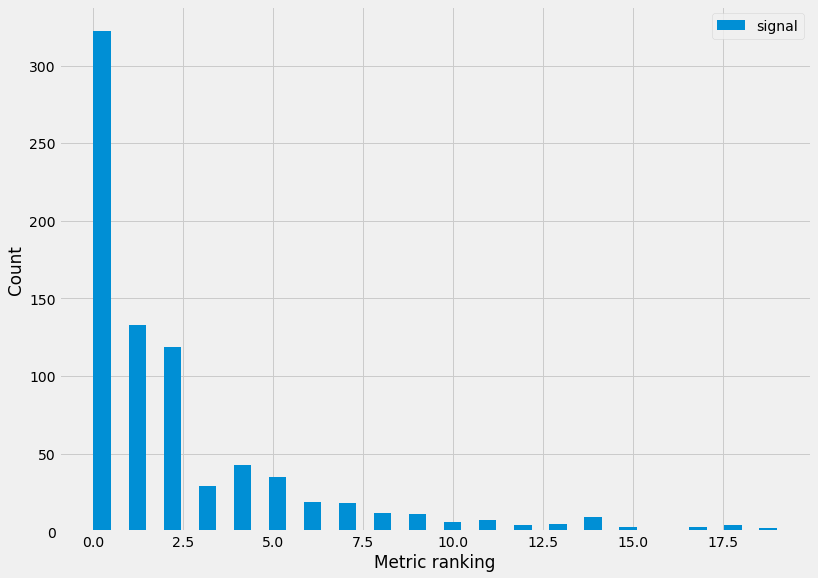

0.3640776699029126


In [ ]:
metric_rank = ak.argsort(comb_metric(masses, momenta, energies, approaches, separations, impacts, angles), ascending=True)[truth_mask]

plot_rank_hist_nb("Metric", metric_rank, y_scaling='linear')

print(np.sum(metric_rank == 0)/ak.num(metric_rank, axis=0))

In [ ]:
def metric_generator(prop_name):
    def metric(properties):
        divisor = 10
        return np.exp(abs(properties[prop_name]) /divisor)
    return metric

def geo_metric(properties):
    initial_offset = 3
    
    approach_divisor = 10
    separation_divisor = 10
    impact_divisor = 10
    
    angle_metric = np.cos((properties["angle"]-np.pi/16)/0.75)

    geometry_metric = np.exp(- initial_offset + abs(properties["approach"])/approach_divisor + abs(properties["separation"])/separation_divisor + abs(properties["impact"])/impact_divisor)
    
    return geometry_metric * np.exp(-angle_metric)

def geo_metric_angle(properties):
    angle_metric = np.cos((properties["angle"]-np.pi/16)/0.75)
    
    return geo_metric(properties) * np.exp(-angle_metric)

metrics = RankEvaluator(evts, pair_coords, sig_count)

metrics.add_metric("separation", metric_generator("separation"))
metrics.add_metric("geometric", geo_metric)
metrics.add_metric("geo_ang", geo_metric_angle)

# Add distribution of metric itself
metrics.make_summary_plot("separation")
metrics.make_summary_plot("geometric")
metrics.make_summary_plot("geo_ang")

[False False False  True False False  True False  True False False False
  True False False False False  True  True False  True False False False
 False  True  True False False False False  True False False False False
  True False False  True False  True  True  True False False  True False
 False False  True False False False  True False  True  True False False
  True False False False  True False False  True False False False False
  True False False  True False False False False False False  True False
 False False  True  True  True False False  True False  True False False
  True False  True  True  True  True False False  True False  True False
 False False False False False  True  True False False False False False
 False  True  True False  True False  True False False False  True  True
 False  True  True False False False False False False  True False False
 False False  True False False False  True False False False False  True
 False  True False False False False False  True Fa

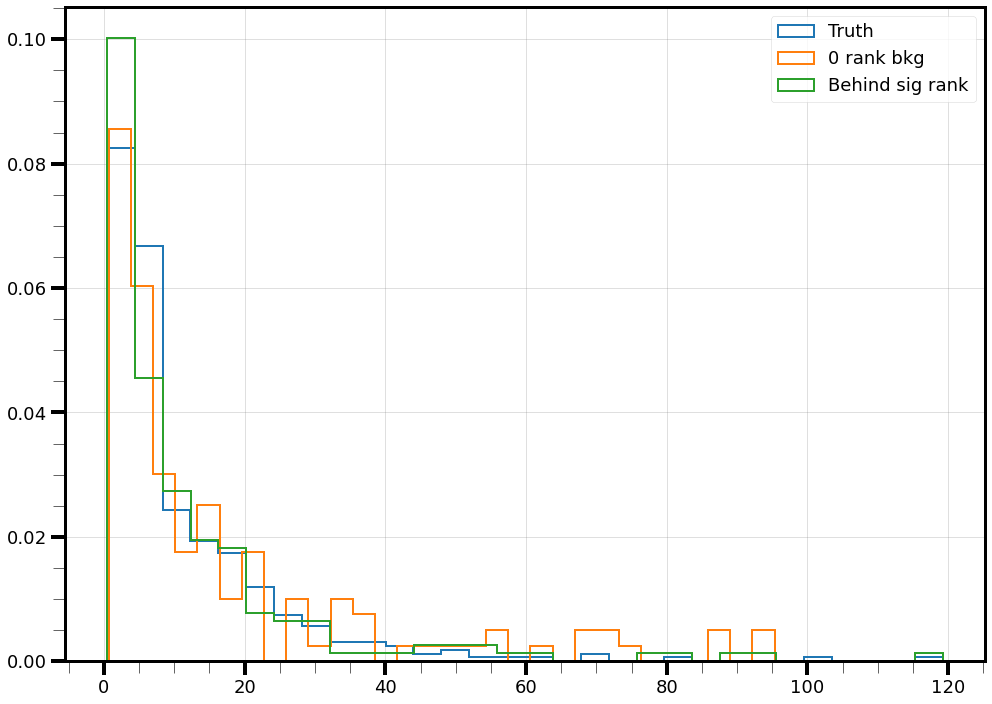

In [ ]:
ranks = ak.argsort(comb_metric(masses, momenta, energies, approaches, separations, impacts, angles), ascending=True)
bkg_ranks = ranks[np.logical_not(truth_mask)]

def get_second_rank(property):
    non_first_sig_events = np.logical_not(ranks[truth_mask] == 0).to_numpy()[:,0]
    print(non_first_sig_events)
    return

second_ranked = get_second_rank(impacts)

plt_conf.setup_figure()
plt.hist(impacts[truth_mask], **plt_conf.gen_kwargs(type="hist", density=True, label="Truth", bins=30))#plt_conf.get_bins(impacts[truth_mask])))
plt.hist(ak.pad_none(impacts[bkg_ranks == 0], 1, axis=1).to_numpy(), **plt_conf.gen_kwargs(type="hist", density=True, label="0 rank bkg", index=1, bins=30))#plt_conf.get_bins(ak.pad_none(impacts[bkg_ranks == 0], 1, axis=1).to_numpy())))

plt.hist(ak.pad_none(impacts[bkg_ranks == 1], 1, axis=1).to_numpy(), **plt_conf.gen_kwargs(type="hist", density=True, label="Behind sig rank", index=2, bins=30))
plt_conf.format_axis()
plt_conf.end_plot()

In [ ]:
print(results)
print(np.max(results))
print(np.where(results == np.max(results)))

[[[[0.68811881 0.18069307 0.06188119]
   [0.68811881 0.18069307 0.06188119]
   [0.68811881 0.18069307 0.06188119]
   [0.68811881 0.18069307 0.06188119]
   [0.68811881 0.18069307 0.06188119]
   [0.68811881 0.18069307 0.06188119]
   [0.68811881 0.18069307 0.06188119]
   [0.68811881 0.18069307 0.06188119]]

  [[0.68811881 0.18069307 0.05940594]
   [0.68564356 0.17821782 0.06188119]
   [0.68564356 0.17821782 0.06188119]
   [0.68564356 0.17821782 0.06188119]
   [0.68564356 0.17821782 0.06188119]
   [0.68564356 0.17821782 0.06188119]
   [0.68564356 0.17821782 0.06188119]
   [0.68564356 0.17821782 0.06188119]]

  [[0.68811881 0.18069307 0.05940594]
   [0.68564356 0.17821782 0.06188119]
   [0.68564356 0.17821782 0.06188119]
   [0.68564356 0.17821782 0.06188119]
   [0.68564356 0.17821782 0.06188119]
   [0.68564356 0.17821782 0.06188119]
   [0.68564356 0.17821782 0.06188119]
   [0.68564356 0.17821782 0.06188119]]

  [[0.68811881 0.18069307 0.05940594]
   [0.68564356 0.17821782 0.06188119]
   [0.

In [ ]:
# WTH is this you ****ing moron... Use something iterable for forming the polynomials...

def comb_metric_polynomial_sum(mass, m_0, m_1, m_2, m_3, m_4, angle, ang_0, ang_1, ang_2, ang_3, ang_4, approach, a_0, a_1, a_2, a_3, a_4, separation, s_0, s_1, s_2, s_3, s_4, impact, i_0, i_1, i_2, i_3, i_4):
    mass_metric     = m_0 + m_1 * mass       + m_2 * mass**2       + m_3 * mass**3       + m_4 * mass**4
    approach_metric =       a_1 * approach   + a_2 * approach**2   + a_3 * approach**3   + a_4 * approach**4
    separation_metric =     s_1 * separation + s_2 * separation**2 + s_3 * separation**3 + s_4 * separation**4
    impact_metric   =       i_1 * impact     + i_2 * impact**2     + i_3 * impact**3     + i_4 * impact**4
    angle_metric    =       ang_1 * angle    + ang_2 * angle**2    + ang_3 * angle**3    + ang_4 * angle**4

    return mass_metric + approach_metric + separation_metric + impact_metric + angle_metric

def comb_metric_polynomial_mult(mass, m_0, m_1, m_2, m_3, m_4, angle, ang_0, ang_1, ang_2, ang_3, ang_4, approach, a_0, a_1, a_2, a_3, a_4, separation, s_0, s_1, s_2, s_3, s_4, impact, i_0, i_1, i_2, i_3, i_4):
    mass_metric     = m_0 + m_1 * mass       + m_2 * mass**2       + m_3 * mass**3       + m_4 * mass**4
    approach_metric = a_0 + a_1 * approach   + a_2 * approach**2   + a_3 * approach**3   + a_4 * approach**4
    separation_metric =s_0+ s_1 * separation + s_2 * separation**2 + s_3 * separation**3 + s_4 * separation**4
    impact_metric   = i_0 + i_1 * impact     + i_2 * impact**2     + i_3 * impact**3     + i_4 * impact**4
    angle_metric    =ang_0+ ang_1 * angle    + ang_2 * angle**2    + ang_3 * angle**3    + ang_4 * angle**4

    return mass_metric * approach_metric * separation_metric * impact_metric * angle_metric

def get_pos_frac(approach_div, sep_div, impact_div, position=0):
    metric_rank = ak.argsort(comb_metric_iterate(approaches, separations, impacts, approach_divisor=approach_div, separation_divisor=sep_div, impact_divisor=impact_div), ascending=True)[truth_mask]
    
    if isinstance(position, int):
        return np.sum(metric_rank == position)/ak.num(metric_rank, axis=0)
    else:
        results = np.zeros_like(position, dtype=float)
        num_vals = ak.num(metric_rank, axis=0)
        for i, p in enumerate(position):
            results[i] = np.sum(metric_rank == p) / num_vals
        return results

In [ ]:
fig = plt.figure()
ax = Axes3D(fig)

